# CMPINF 2100: Midterm exam

## Vishruth Reddy

### Assigned: Tuesday of Week 09 at 11:00PM 

### DUE: Tuesday of Week 10 at 11:59PM

You may add as many code and markdown cells as you see fit to answer the questions.

## You are NOT allowed to collaborate with anyone on this exam.

### Overview

You will demonstrate your ability to merge, group, summarize, visualize, and find patterns in data. This exam uses data associated with a manufacturing example. An overview of the goals, considerations, CSV files, and variables within the data is provided in a presentation on Canvas. Please read through those slides before starting the exam.

The data are provided in 5 separate CSV files. The CSV files are available on Canvas. You **MUST** download the files and save them to the same working directory as this notebook.

The specific instructions in this notebook tell you when you must JOIN the data together. Please read the problems carefully.

The overall objective of this exam is to JOIN data from multiple files in order to explore and find interesting patterns between the machine operating conditions and supplier information. You will report your findings within this notebook by displaying Pandas DataFrames and statistical visualizations via Seaborn and matplotlib when necessary.  

## Import modules

You are permitted to use the following modules on this exam.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

You may also use the following functions from scikit-learn on this exam.

In [2]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

You may also use the following sub module from SCIPY.

In [3]:
from scipy.cluster import hierarchy

You are **NOT** permitted to use any other modules or functions. However, you **ARE** permitted to create your own user defined functions if you would like.

## Problem 01

The file names for the 3 machine data sets are provided as strings in the cell below. You are required to read in the CSV files and assign the data to the `m01_df`, `m02_df`, and `m03_df` objects. The data from machine 1 will therefore be associated with `m01_df`, machine 2 is associated with `m02_df`, and machine 3 is associated with `m03_df`.  

In this problem you must explore each of the three machine data sets. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in each data set? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:

* How many unique values for `Batch` are associated with each MACHINE (data set)?
* How many cell phone cases are associated with each `Batch` value for each MACHINE (data set)?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the summary statistics of the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the three MACHINES?
* Do the relationships between the OPERATING VARIABLES `x1` through `x4` vary across the `Batch` values?

At the conclusion of this problem, you **MUST** CONCATENATE the 3 MACHINE data sets into a single DataFrame. The single DataFrame must be named `machine_df`. Before concatenating, you **MUST** add a column `machine_id` to each DataFrame with the correct index value for that machine (1, 2, or 3). The concatenating DataFrame variable name is provided as a reminder to you below. 

You may add as many markdown and code cells as you see fit to answer this question. Include markdown cells stating what you see in the figures and why you selected to use them.

#### SOLUTION

In [4]:
# Define the files's for the 3 machine level CSV files

file_m01 = 'midterm_machine_01.csv'

file_m02 = 'midterm_machine_02.csv'

file_m03 = 'midterm_machine_03.csv'

In [5]:
# read in the CSV files and name them accordingly

m01_df = pd.read_csv(file_m01)

m02_df = pd.read_csv(file_m02)

m03_df = pd.read_csv(file_m03)

### `m01_df` Essentials

In [6]:
m01_df.head()

,ID,Batch,s_id,x1,x2,x3,x4
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666


In [7]:
m01_df.shape

(5152, 7)

* Machine `m01_df` has `5152 rows` and `7 columns`.

In [8]:
m01_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5152 entries, 0 to 5151
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5152 non-null   object 
 1   Batch   5152 non-null   int64  
 2   s_id    5152 non-null   int64  
 3   x1      5152 non-null   float64
 4   x2      5152 non-null   float64
 5   x3      5152 non-null   float64
 6   x4      5152 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 281.9+ KB


* Variables `x1, x2, x3, x4` are of `float` data types.
* Variables `Batch, s_id` are of `integer` data types.
* Variable `ID` is of `object` data type.

In [9]:
m01_df['Batch'] = m01_df['Batch'].astype('object')

In [10]:
m01_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5152 entries, 0 to 5151
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5152 non-null   object 
 1   Batch   5152 non-null   object 
 2   s_id    5152 non-null   int64  
 3   x1      5152 non-null   float64
 4   x2      5152 non-null   float64
 5   x3      5152 non-null   float64
 6   x4      5152 non-null   float64
dtypes: float64(4), int64(1), object(2)
memory usage: 281.9+ KB


In [11]:
m01_df.nunique()

ID       5152
Batch      50
s_id      149
x1       5152
x2       5152
x3       5152
x4       5152
dtype: int64

* Variables `ID, x1, x2, x3, x4` have `5152 unique values` each.
* Variable `Batch` has `50 unique values`.
* Variable `s_id` has `149 unique values`.

In [12]:
m01_df.isna().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

* None of the variables have missing values.

### `m01_df` Marginal Behavior

In [13]:
m01_df.describe()

,s_id,x1,x2,x3,x4
count,5152.000000,5152.000000,5152.000000,5152.000000,5152.000000
mean,54.540373,51.998218,102.207011,23.947216,10.628436
std,33.650665,3.151912,12.888171,2.269325,1.542291
min,1.000000,44.275379,65.810729,19.095832,7.644190
25%,26.000000,49.335776,96.610288,22.334048,9.479969
50%,52.000000,52.536206,104.487824,23.855690,10.356002
75%,80.000000,54.662490,110.609442,25.448356,11.318120
max,149.000000,58.647186,130.228828,29.477213,14.612911


In [14]:
m01_df.describe(include=object)

,ID,Batch
count,5152,5152
unique,5152,50
top,B001-M01-S001,36
freq,1,149


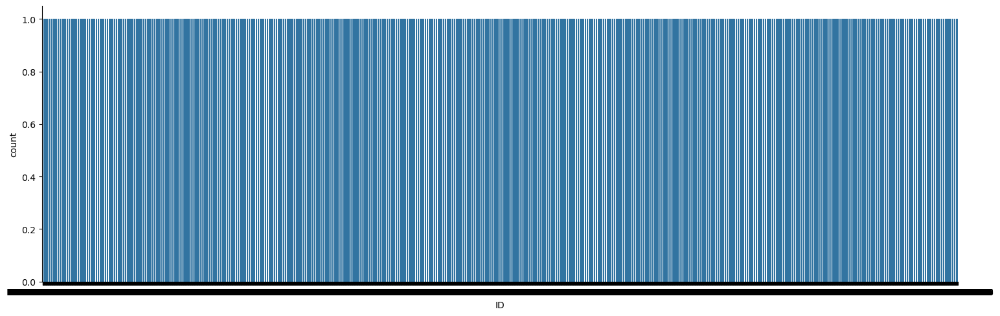

In [15]:
sns.catplot(data = m01_df, x='ID', kind='count', aspect=3)

plt.show()

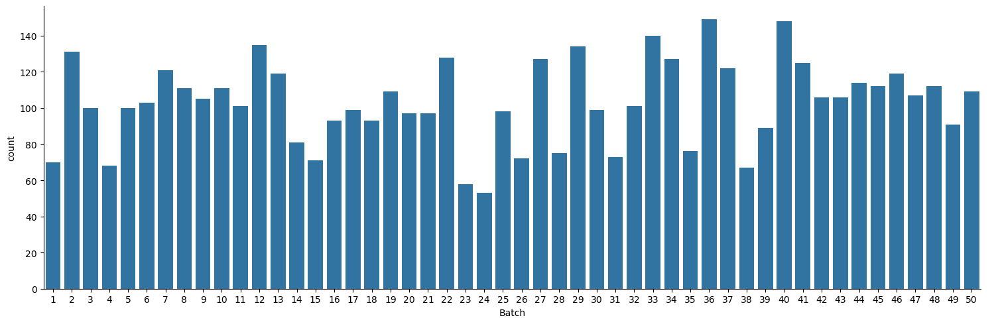

In [16]:
sns.catplot(data = m01_df, x='Batch', kind='count', aspect=3)

plt.show()

* There are `50` unique values for Batch associated with Machine 1
* We can visually see the number of cell phone cases associated with the 1st machine for each batch from the graph above. 

### `m01_df` Relationships

In [17]:
m01_df_features = m01_df.select_dtypes('number').copy()
m01_df_features = m01_df_features.drop(columns=['s_id'])
m01_df_features

,x1,x2,x3,x4
0,50.117118,102.167346,22.067812,13.889524
1,46.887333,112.266102,23.197330,13.064709
2,50.132744,103.674908,22.319933,13.647482
3,48.501042,107.143156,22.162947,14.077758
4,49.690442,102.120283,22.248696,13.728666
...,...,...,...,...
5147,51.989030,101.587723,19.945482,11.456779
5148,52.331889,105.846820,20.836308,11.048374
5149,53.910224,99.050877,21.227331,10.697194
5150,51.021515,107.294368,20.914290,11.052844


In [18]:
m01_lf = m01_df_features.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid'])
m01_lf

,rowid,variable,value
0,0,x1,50.117118
1,1,x1,46.887333
2,2,x1,50.132744
3,3,x1,48.501042
4,4,x1,49.690442
...,...,...,...
20603,5147,x4,11.456779
20604,5148,x4,11.048374
20605,5149,x4,10.697194
20606,5150,x4,11.052844


In [19]:
m01_objects = m01_df.select_dtypes('object').copy()
m01_objects

,ID,Batch
0,B001-M01-S001,1
1,B001-M01-S002,1
2,B001-M01-S003,1
3,B001-M01-S004,1
4,B001-M01-S005,1
...,...,...
5147,B050-M01-S105,50
5148,B050-M01-S106,50
5149,B050-M01-S107,50
5150,B050-M01-S108,50


In [20]:
id_cols = ['rowid'] + m01_objects.columns.to_list()
id_cols

['rowid', 'ID', 'Batch']

In [21]:
m01_objects_lf = m01_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols, value_vars=m01_df_features.columns)
m01_objects_lf

,rowid,ID,Batch,variable,value
0,0,B001-M01-S001,1,x1,50.117118
1,1,B001-M01-S002,1,x1,46.887333
2,2,B001-M01-S003,1,x1,50.132744
3,3,B001-M01-S004,1,x1,48.501042
4,4,B001-M01-S005,1,x1,49.690442
...,...,...,...,...,...
20603,5147,B050-M01-S105,50,x4,11.456779
20604,5148,B050-M01-S106,50,x4,11.048374
20605,5149,B050-M01-S107,50,x4,10.697194
20606,5150,B050-M01-S108,50,x4,11.052844


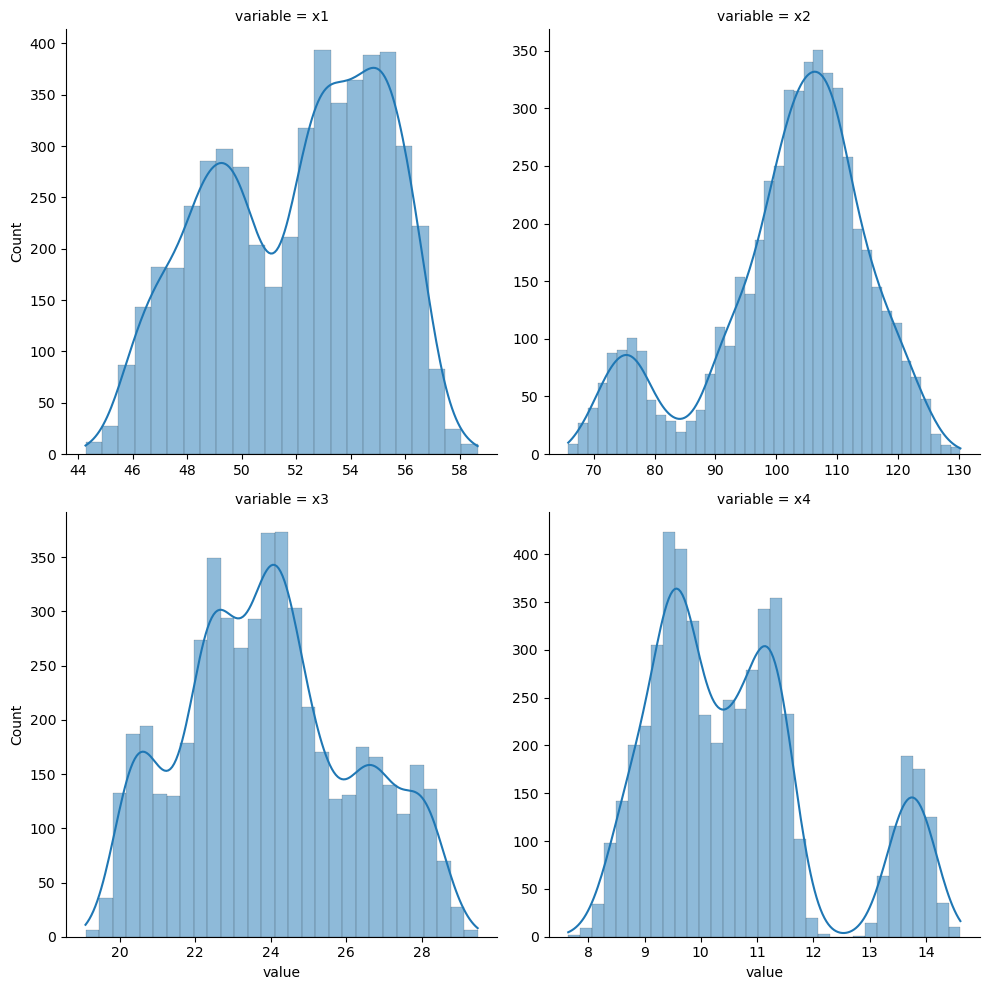

In [22]:
sns.displot(data = m01_lf, x='value', col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=2)

plt.show()

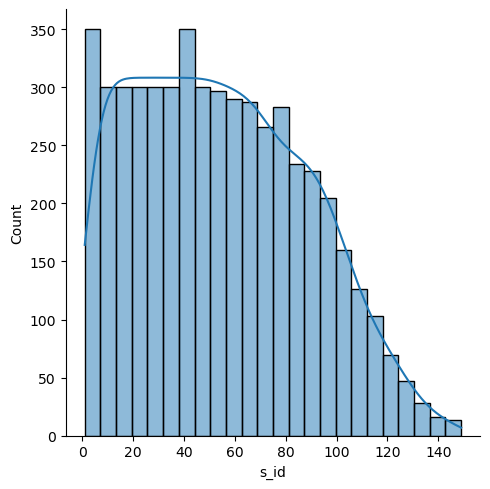

In [23]:
sns.displot(data = m01_df, x='s_id', kind='hist', kde=True) 

plt.show()

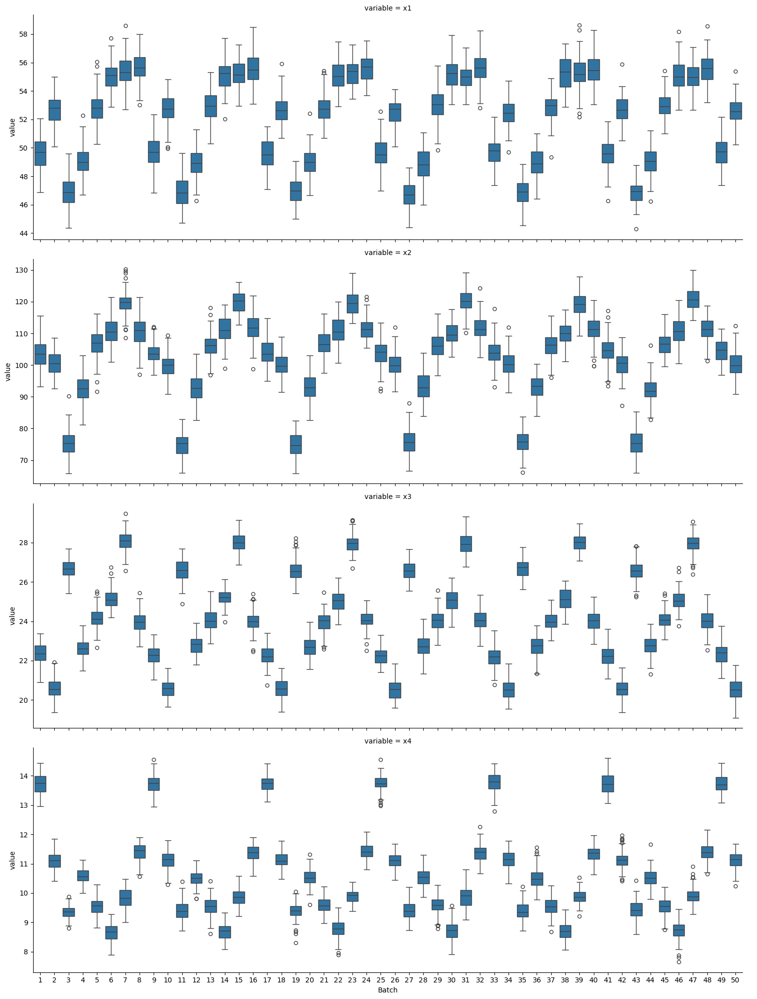

In [24]:
sns.catplot(data = m01_objects_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

* Yes, the summary statistics of the operating variables vary across th Batch values.

In [25]:
m01_df_features

,x1,x2,x3,x4
0,50.117118,102.167346,22.067812,13.889524
1,46.887333,112.266102,23.197330,13.064709
2,50.132744,103.674908,22.319933,13.647482
3,48.501042,107.143156,22.162947,14.077758
4,49.690442,102.120283,22.248696,13.728666
...,...,...,...,...
5147,51.989030,101.587723,19.945482,11.456779
5148,52.331889,105.846820,20.836308,11.048374
5149,53.910224,99.050877,21.227331,10.697194
5150,51.021515,107.294368,20.914290,11.052844


In [26]:
m01_df_features_batch = m01_df_features.copy()
m01_df_features_batch['Batch'] = m01_df['Batch']
m01_df_features_batch

,x1,x2,x3,x4,Batch
0,50.117118,102.167346,22.067812,13.889524,1
1,46.887333,112.266102,23.197330,13.064709,1
2,50.132744,103.674908,22.319933,13.647482,1
3,48.501042,107.143156,22.162947,14.077758,1
4,49.690442,102.120283,22.248696,13.728666,1
...,...,...,...,...,...
5147,51.989030,101.587723,19.945482,11.456779,50
5148,52.331889,105.846820,20.836308,11.048374,50
5149,53.910224,99.050877,21.227331,10.697194,50
5150,51.021515,107.294368,20.914290,11.052844,50


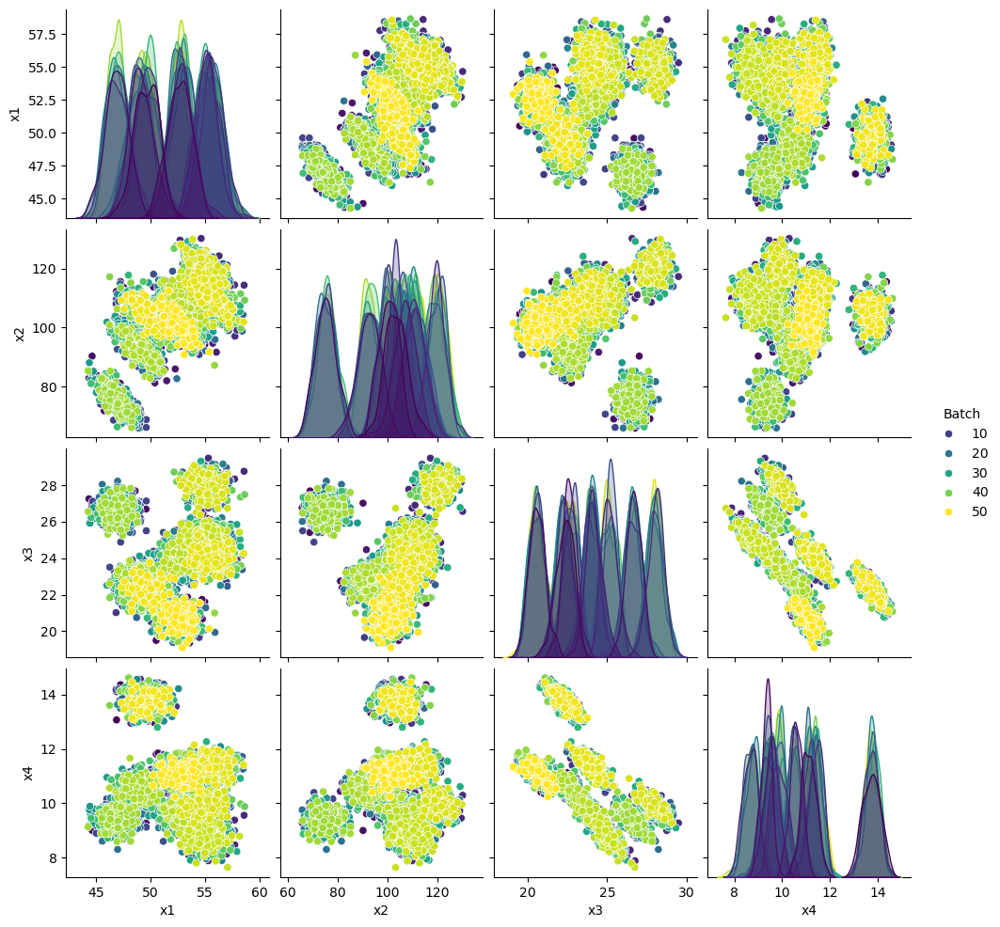

In [27]:
sns.pairplot(data = m01_df_features_batch, hue='Batch', 
             diag_kws={'common_norm': False}, palette='viridis')

plt.show()

In [28]:
corr_per_group_all = m01_df_features_batch.groupby('Batch').corr(numeric_only=True)
corr_per_group_all

x1        x2        x3        x4
Batch                                           
1     x1  1.000000 -0.799209 -0.120857 -0.022968
      x2 -0.799209  1.000000  0.157464  0.000275
      x3 -0.120857  0.157464  1.000000 -0.767872
      x4 -0.022968  0.000275 -0.767872  1.000000
2     x1  1.000000 -0.768966  0.069225 -0.076870
...            ...       ...       ...       ...
49    x4  0.159566 -0.257262 -0.808746  1.000000
50    x1  1.000000 -0.717987 -0.108621  0.091202
      x2 -0.717987  1.000000  0.076936 -0.070050
      x3 -0.108621  0.076936  1.000000 -0.719884
      x4  0.091202 -0.070050 -0.719884  1.000000

[200 rows x 4 columns]

In [29]:
the_groups = m01_df_features_batch.Batch.unique().tolist()
print(the_groups)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


In [30]:
sublists = [the_groups[i:i + 5] for i in range(0, len(the_groups), 5)]

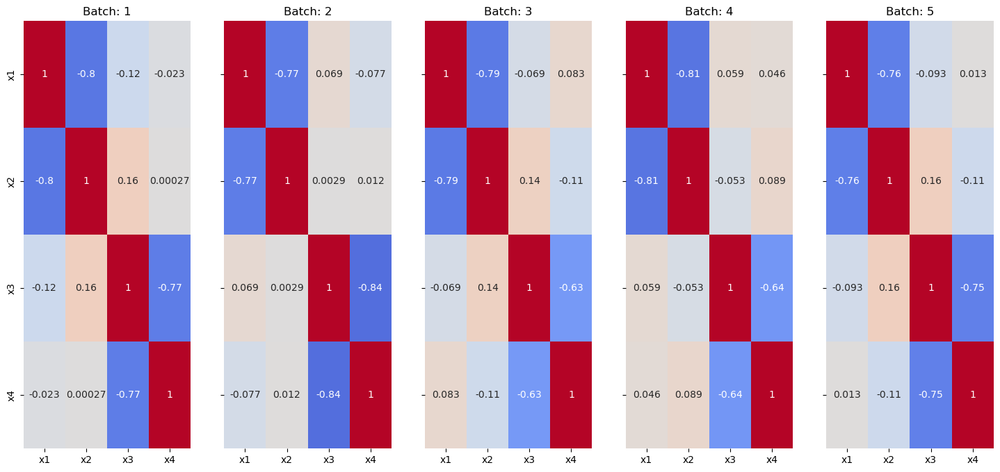

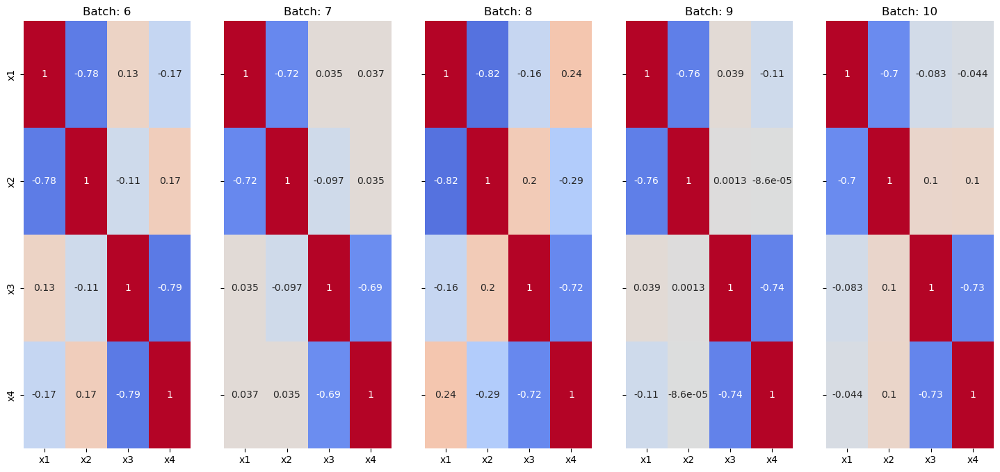

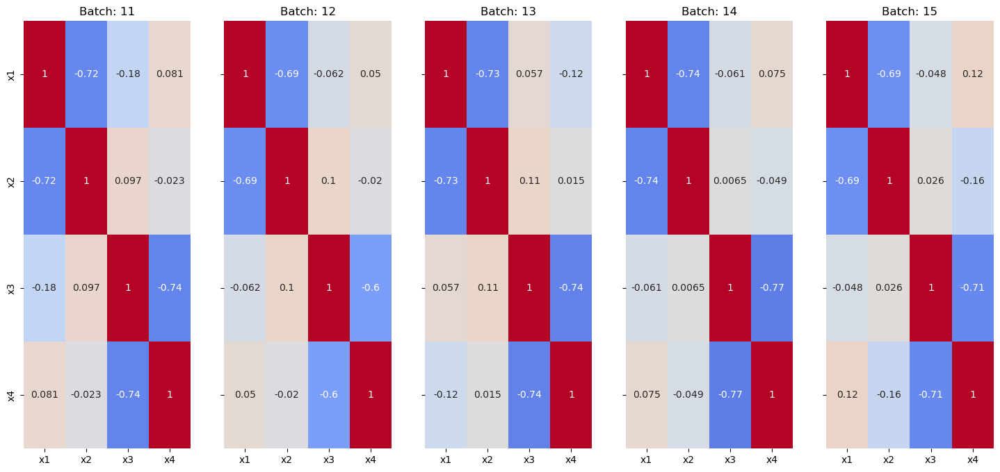

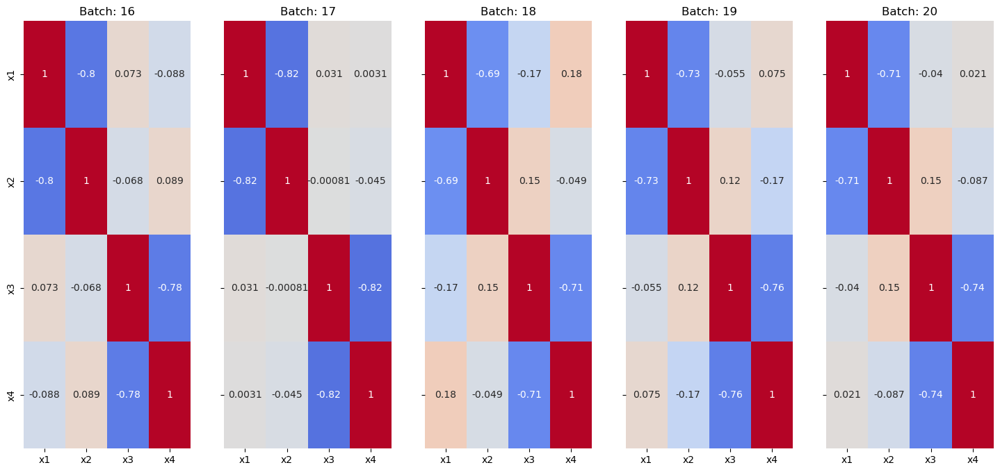

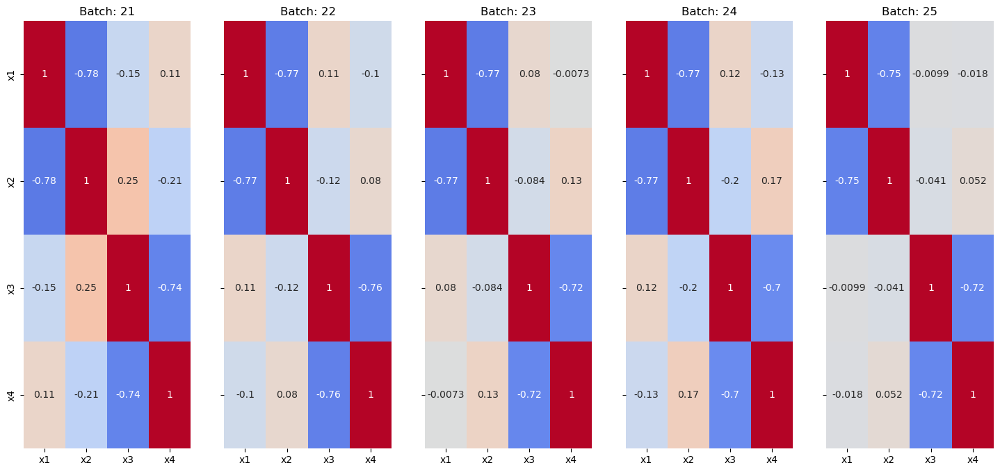

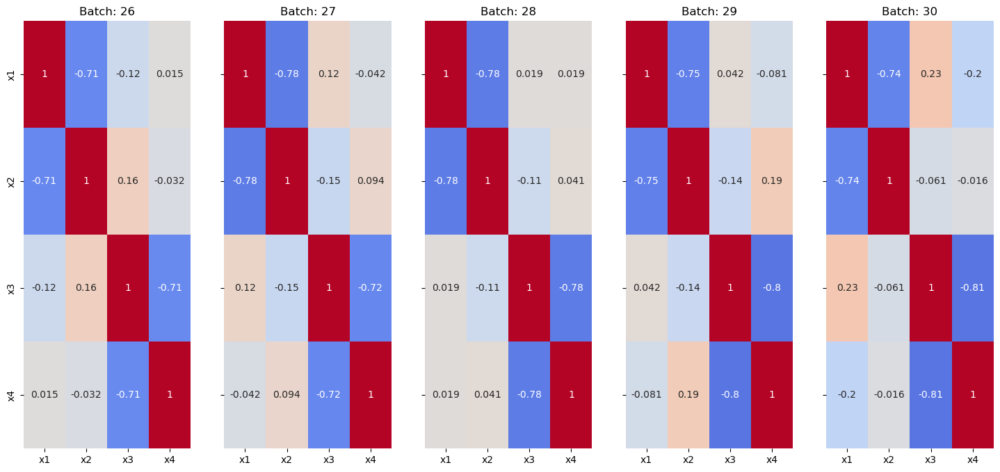

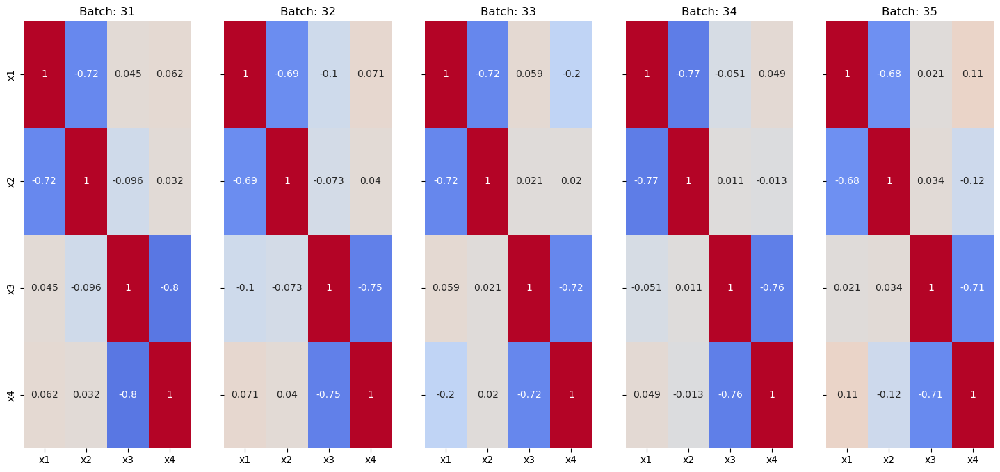

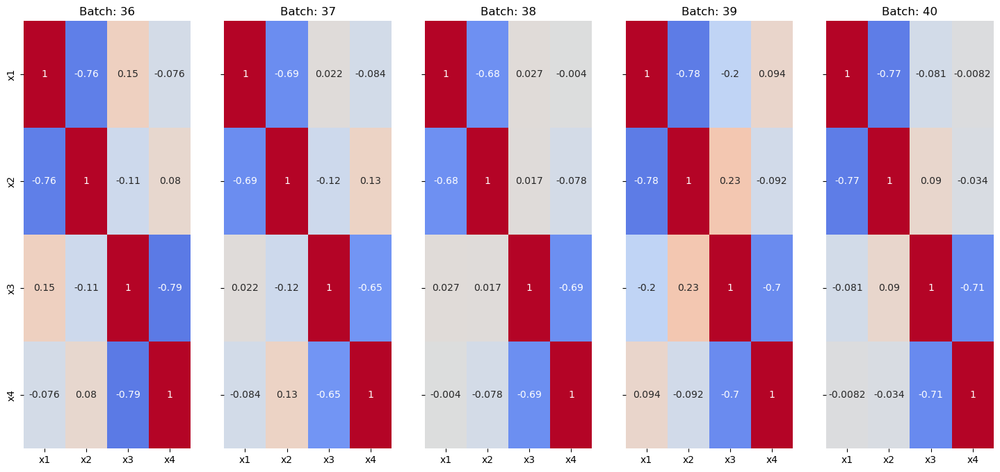

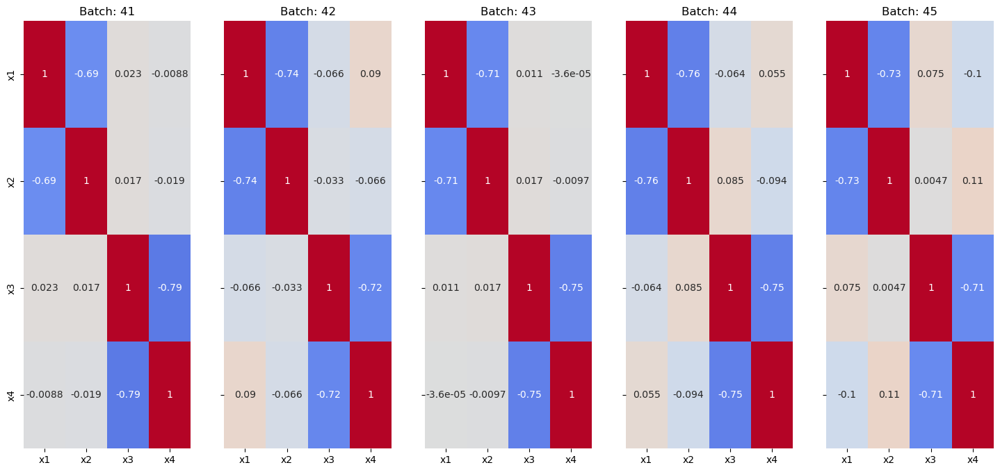

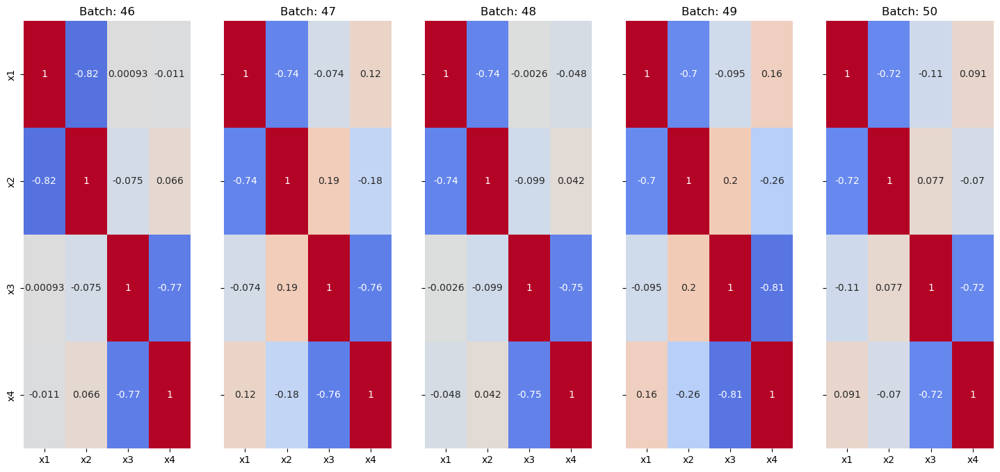

In [31]:
for i in sublists:
    fig, axs = plt.subplots(1, len(i), figsize=(18, 8), sharex=True, sharey=True )

    for ix in range(len(i)):
        sns.heatmap( data = corr_per_group_all.loc[ i[ ix ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[ix] )

        axs[ ix ].set_title('Batch: %s' % i[ ix ] )

    plt.show()

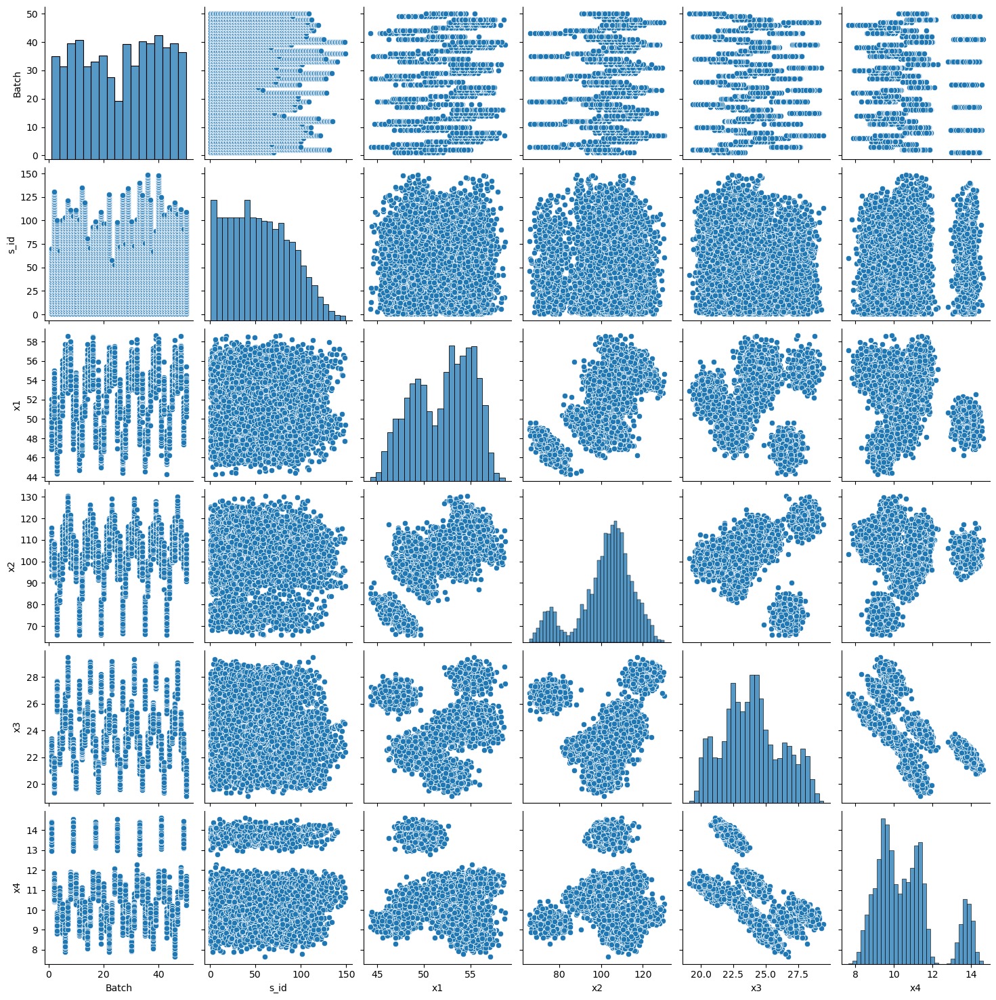

In [32]:
sns.pairplot(data = m01_df)

plt.show()

* The relationships between the operating variables varies across the batch.

### `m02_df` Overview

In [33]:
m02_df.shape

(5119, 7)

* `m02_df` has `5119 rows` and `7 columns`.

In [34]:
m02_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5119 entries, 0 to 5118
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5119 non-null   object 
 1   Batch   5119 non-null   int64  
 2   s_id    5119 non-null   int64  
 3   x1      5119 non-null   float64
 4   x2      5119 non-null   float64
 5   x3      5119 non-null   float64
 6   x4      5119 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 280.1+ KB


* Variables `x1, x2, x3, x4` are of `float` data types.
* Variables `Batch, s_id` are of `integer` data types.
* Variable `ID` is of `object` data type.

In [35]:
m02_df['Batch'] = m02_df['Batch'].astype('object')

In [36]:
m02_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5119 entries, 0 to 5118
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      5119 non-null   object 
 1   Batch   5119 non-null   object 
 2   s_id    5119 non-null   int64  
 3   x1      5119 non-null   float64
 4   x2      5119 non-null   float64
 5   x3      5119 non-null   float64
 6   x4      5119 non-null   float64
dtypes: float64(4), int64(1), object(2)
memory usage: 280.1+ KB


In [37]:
m02_df.nunique()

ID       5119
Batch      50
s_id      133
x1       5119
x2       5119
x3       5119
x4       5119
dtype: int64

* Variables `ID, x1, x2, x3, x4` have `5119 unique values` each.
* Variable `Batch` has `50 unique values`.
* Variable `s_id` has `133 unique values`.

In [38]:
m02_df.isna().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

* There are no missing values in the variables of machine 2.

### `m02_df` Marginal Behavior

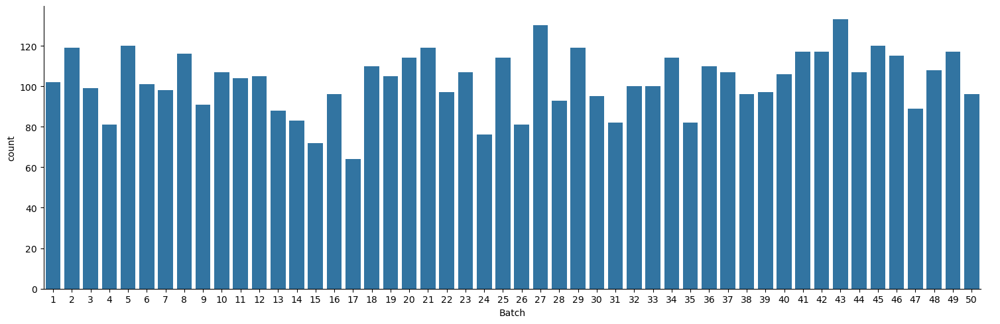

In [39]:
sns.catplot(data = m02_df, x='Batch', kind='count', aspect=3)

plt.show()

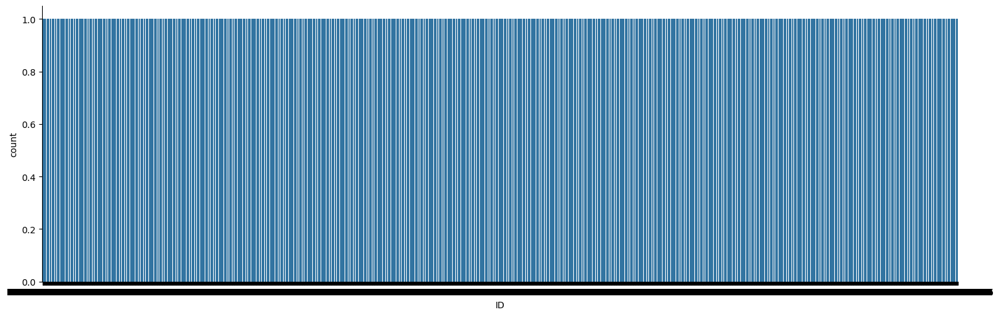

In [40]:
sns.catplot(data = m02_df, x='ID', kind='count', aspect=3)

plt.show()

* There are `50` unique values for Batch associated with Machine 2
* We can visually see the number of cell phone cases associated with the 2nd machine for each batch from the graph above. 

### `m02_df` Relationships

In [41]:
m02_df.describe()

,s_id,x1,x2,x3,x4
count,5119.000000,5119.000000,5119.000000,5119.000000,5119.000000
mean,52.754444,51.989377,101.998905,23.982312,10.605275
std,31.263876,3.095129,12.834348,2.275809,1.523140
min,1.000000,44.896759,64.774007,19.232164,7.934064
25%,26.000000,49.240567,96.325502,22.372944,9.492226
50%,52.000000,52.610949,104.357308,23.894465,10.329911
75%,78.000000,54.785418,110.672960,25.546656,11.286062
max,133.000000,58.503441,131.009046,29.093229,14.400437


In [42]:
m02_df.describe(include=object)

,ID,Batch
count,5119,5119
unique,5119,50
top,B001-M02-S001,43
freq,1,133


In [43]:
m02_df_features = m02_df.select_dtypes('number').copy()
m02_df_features = m02_df_features.drop(columns=['s_id'])
m02_df_features

,x1,x2,x3,x4
0,50.213596,100.053754,22.027835,13.839467
1,49.811232,101.161409,22.436839,13.878907
2,48.968142,106.184030,22.414990,13.847003
3,50.477133,107.949816,21.909720,14.193081
4,50.188501,102.882549,22.306728,13.693529
...,...,...,...,...
5114,52.690936,95.050804,20.324674,10.963370
5115,52.348015,97.863144,20.884779,11.156604
5116,52.187241,99.887013,20.439142,11.303222
5117,52.875621,101.572057,20.648029,11.084512


In [44]:
m02_lf = m02_df_features.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid'])
m02_lf

,rowid,variable,value
0,0,x1,50.213596
1,1,x1,49.811232
2,2,x1,48.968142
3,3,x1,50.477133
4,4,x1,50.188501
...,...,...,...
20471,5114,x4,10.963370
20472,5115,x4,11.156604
20473,5116,x4,11.303222
20474,5117,x4,11.084512


In [45]:
m02_objects = m02_df.select_dtypes('object').copy()
m02_objects

,ID,Batch
0,B001-M02-S001,1
1,B001-M02-S002,1
2,B001-M02-S003,1
3,B001-M02-S004,1
4,B001-M02-S005,1
...,...,...
5114,B050-M02-S092,50
5115,B050-M02-S093,50
5116,B050-M02-S094,50
5117,B050-M02-S095,50


In [46]:
id_cols2 = ['rowid'] + m02_objects.columns.to_list()
id_cols2

['rowid', 'ID', 'Batch']

In [47]:
m02_objects_lf = m02_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols2, value_vars=m02_df_features.columns)
m02_objects_lf

,rowid,ID,Batch,variable,value
0,0,B001-M02-S001,1,x1,50.213596
1,1,B001-M02-S002,1,x1,49.811232
2,2,B001-M02-S003,1,x1,48.968142
3,3,B001-M02-S004,1,x1,50.477133
4,4,B001-M02-S005,1,x1,50.188501
...,...,...,...,...,...
20471,5114,B050-M02-S092,50,x4,10.963370
20472,5115,B050-M02-S093,50,x4,11.156604
20473,5116,B050-M02-S094,50,x4,11.303222
20474,5117,B050-M02-S095,50,x4,11.084512


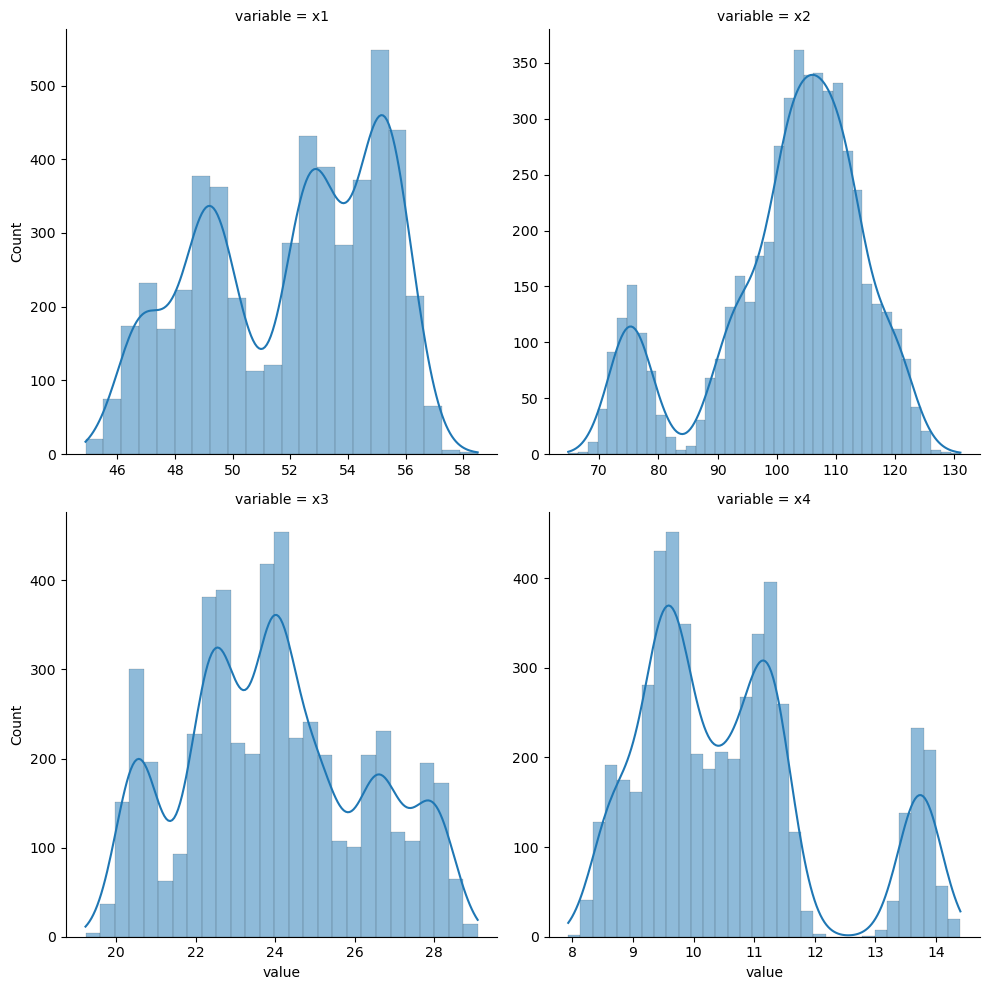

In [48]:
sns.displot(data = m02_lf, x='value', col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=2)

plt.show()

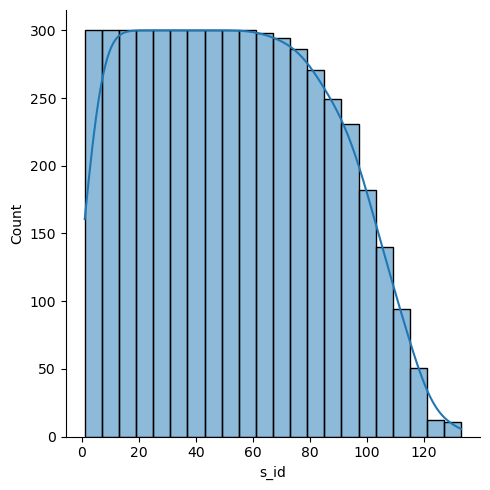

In [49]:
sns.displot(data = m02_df, x='s_id', kind='hist', kde=True) 

plt.show()

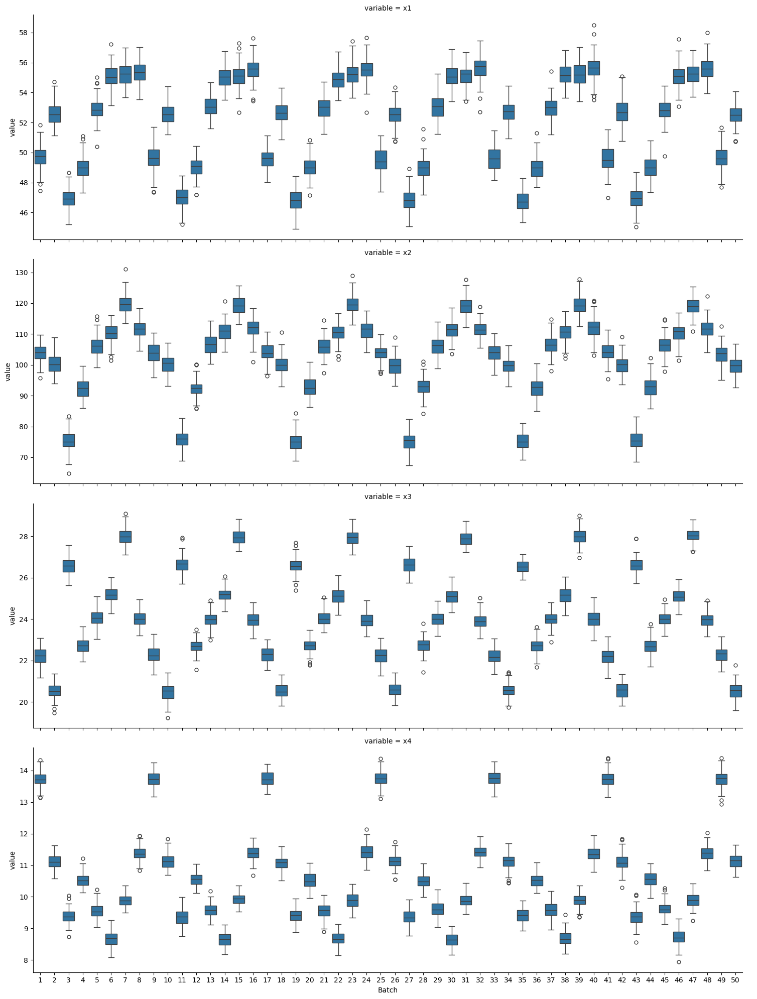

In [50]:
sns.catplot(data = m02_objects_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

* Yes, the summary statistics varies across the Batch for the operating variables.

In [51]:
m02_df_features

,x1,x2,x3,x4
0,50.213596,100.053754,22.027835,13.839467
1,49.811232,101.161409,22.436839,13.878907
2,48.968142,106.184030,22.414990,13.847003
3,50.477133,107.949816,21.909720,14.193081
4,50.188501,102.882549,22.306728,13.693529
...,...,...,...,...
5114,52.690936,95.050804,20.324674,10.963370
5115,52.348015,97.863144,20.884779,11.156604
5116,52.187241,99.887013,20.439142,11.303222
5117,52.875621,101.572057,20.648029,11.084512


In [52]:
m02_df_features_batch = m02_df_features.copy()
m02_df_features_batch['Batch'] = m02_df['Batch']
m02_df_features_batch

,x1,x2,x3,x4,Batch
0,50.213596,100.053754,22.027835,13.839467,1
1,49.811232,101.161409,22.436839,13.878907,1
2,48.968142,106.184030,22.414990,13.847003,1
3,50.477133,107.949816,21.909720,14.193081,1
4,50.188501,102.882549,22.306728,13.693529,1
...,...,...,...,...,...
5114,52.690936,95.050804,20.324674,10.963370,50
5115,52.348015,97.863144,20.884779,11.156604,50
5116,52.187241,99.887013,20.439142,11.303222,50
5117,52.875621,101.572057,20.648029,11.084512,50


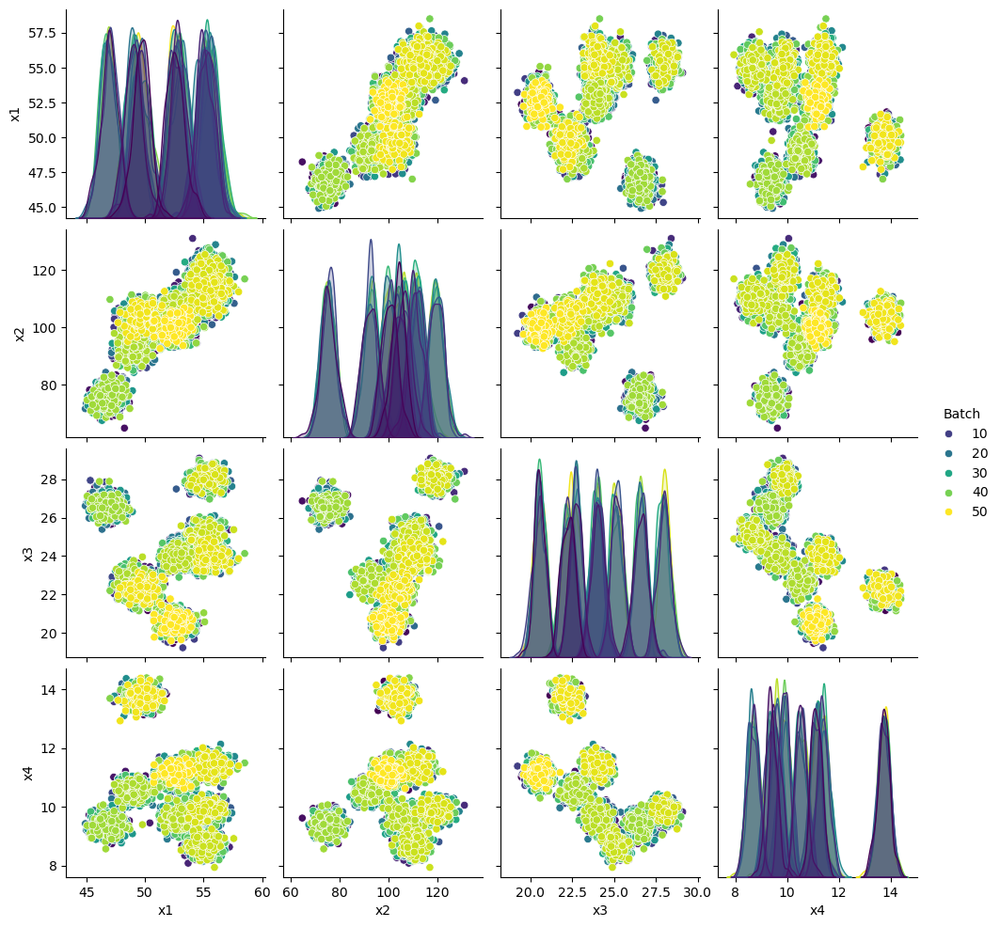

In [53]:
sns.pairplot(data = m02_df_features_batch, hue='Batch', 
             diag_kws={'common_norm': False}, palette='viridis')

plt.show()

In [54]:
corr_per_group_all2 = m02_df_features_batch.groupby('Batch').corr(numeric_only=True)
corr_per_group_all2

x1        x2        x3        x4
Batch                                           
1     x1  1.000000  0.163656 -0.217603 -0.001689
      x2  0.163656  1.000000 -0.142951 -0.069450
      x3 -0.217603 -0.142951  1.000000 -0.173068
      x4 -0.001689 -0.069450 -0.173068  1.000000
2     x1  1.000000  0.190067 -0.039772 -0.118070
...            ...       ...       ...       ...
49    x4  0.085552 -0.031279 -0.256291  1.000000
50    x1  1.000000  0.198618  0.074470 -0.037296
      x2  0.198618  1.000000  0.017599 -0.132803
      x3  0.074470  0.017599  1.000000 -0.040388
      x4 -0.037296 -0.132803 -0.040388  1.000000

[200 rows x 4 columns]

In [55]:
the_groups2 = m02_df_features_batch.Batch.unique().tolist()
print(the_groups2)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]


In [56]:
sublists2 = [the_groups2[i:i + 5] for i in range(0, len(the_groups2), 5)]

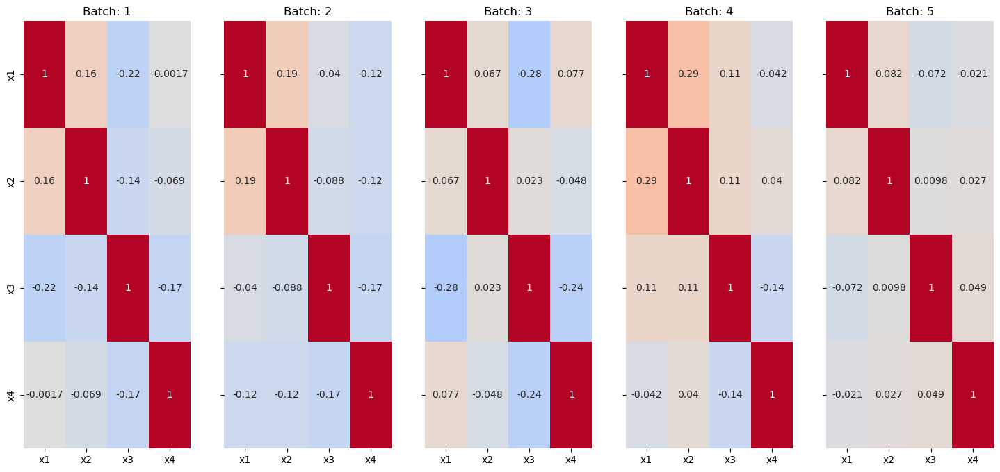

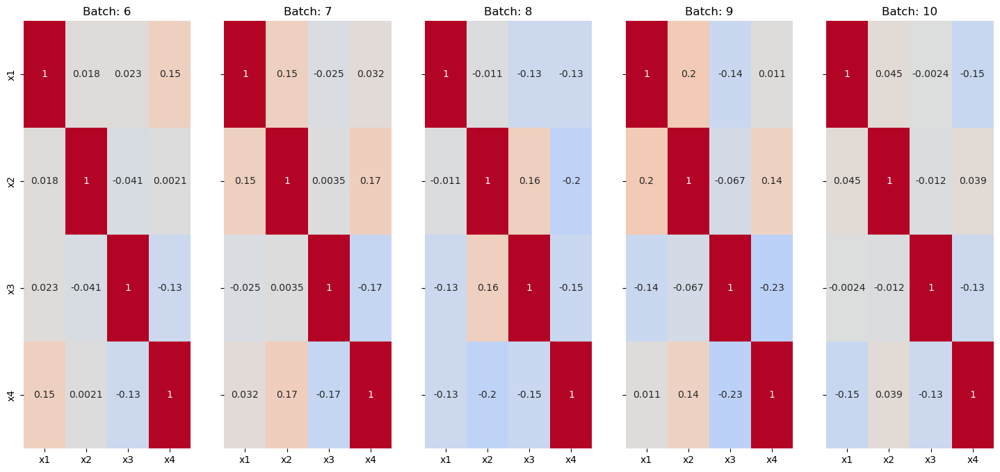

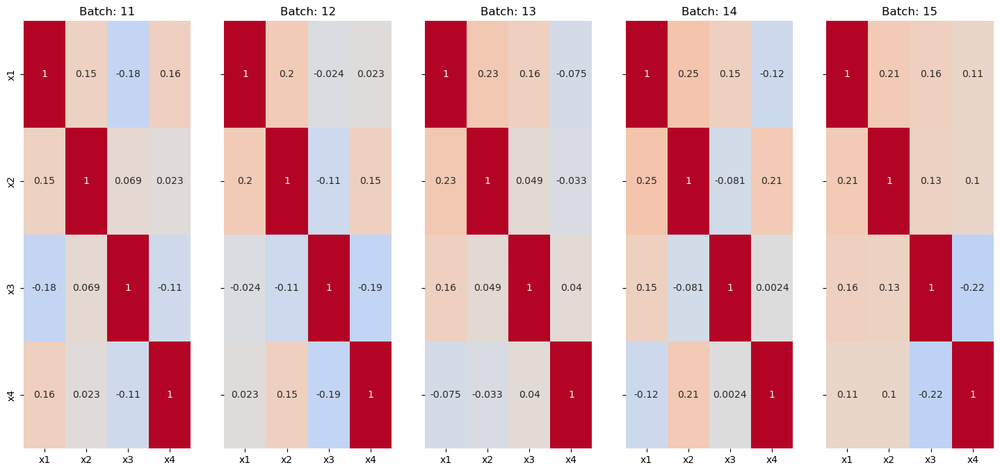

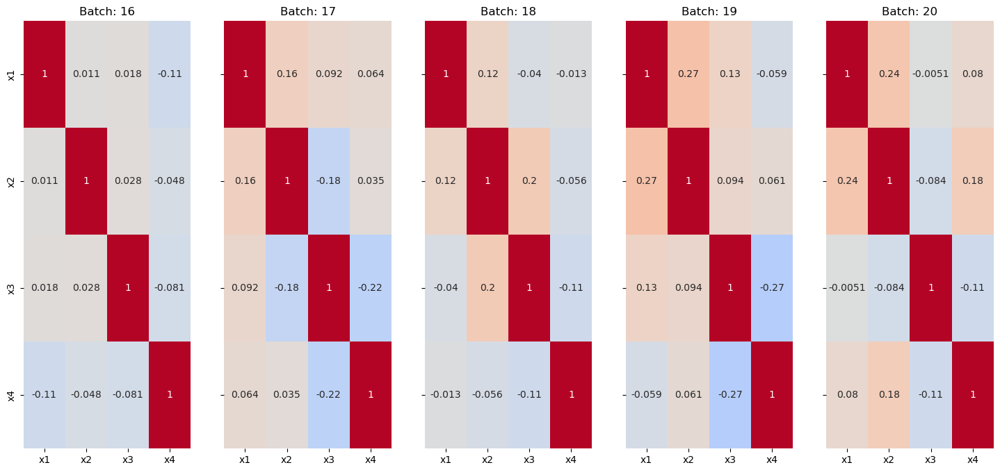

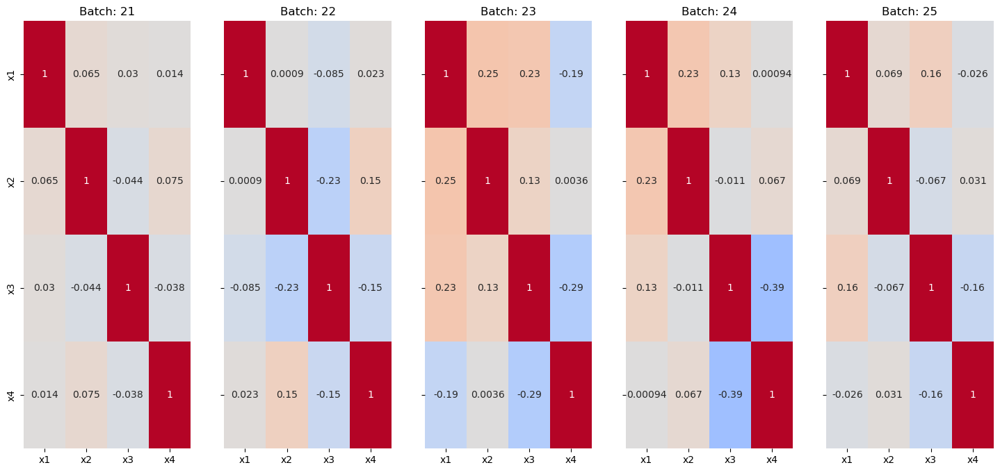

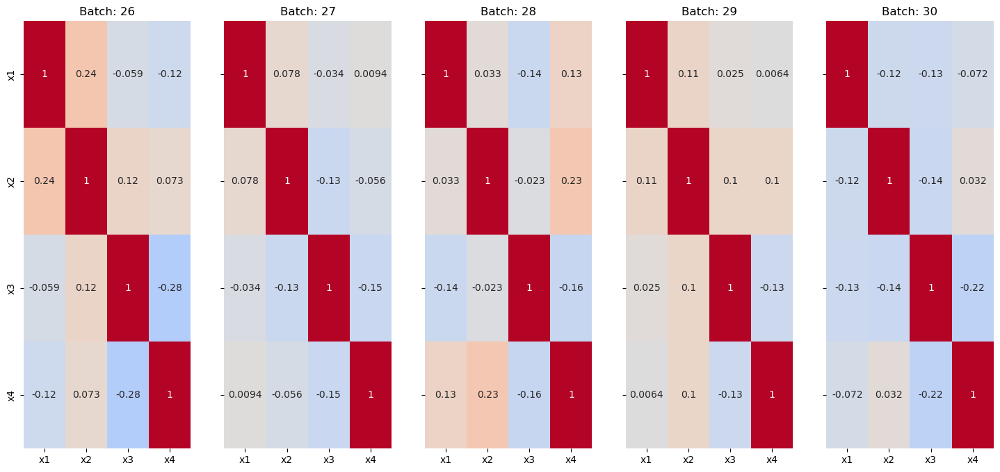

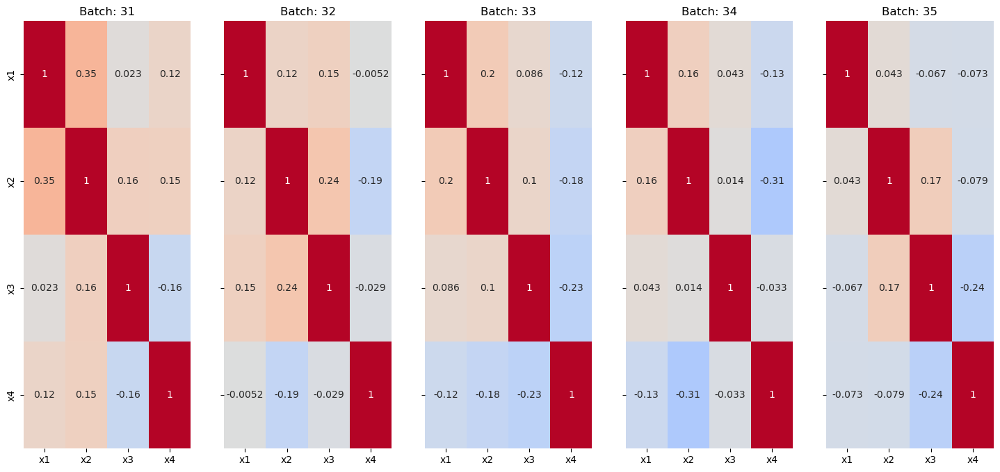

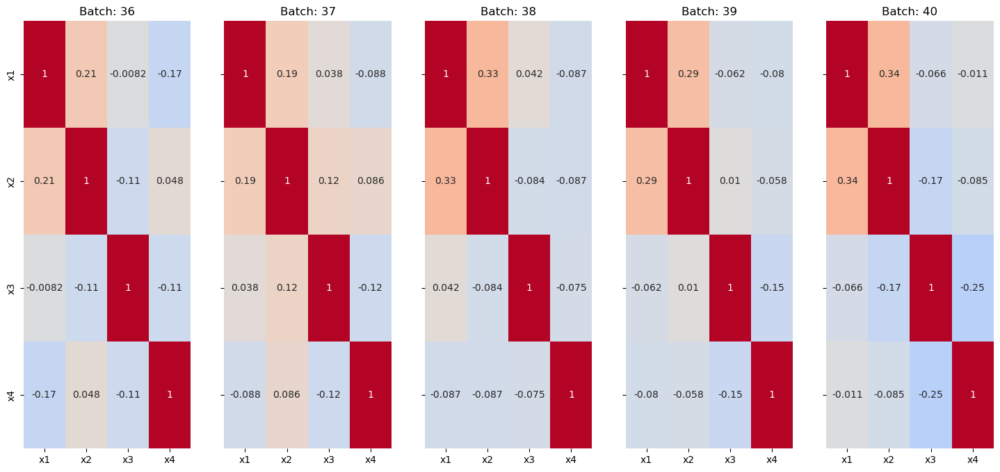

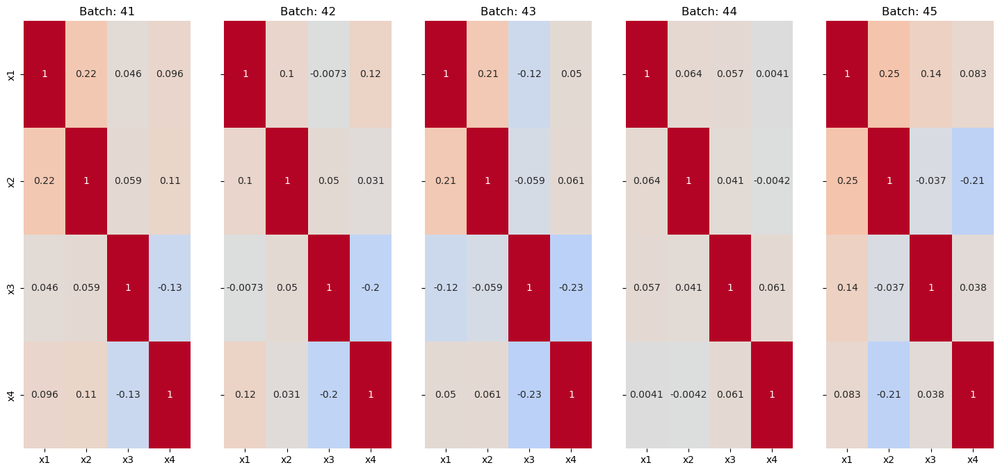

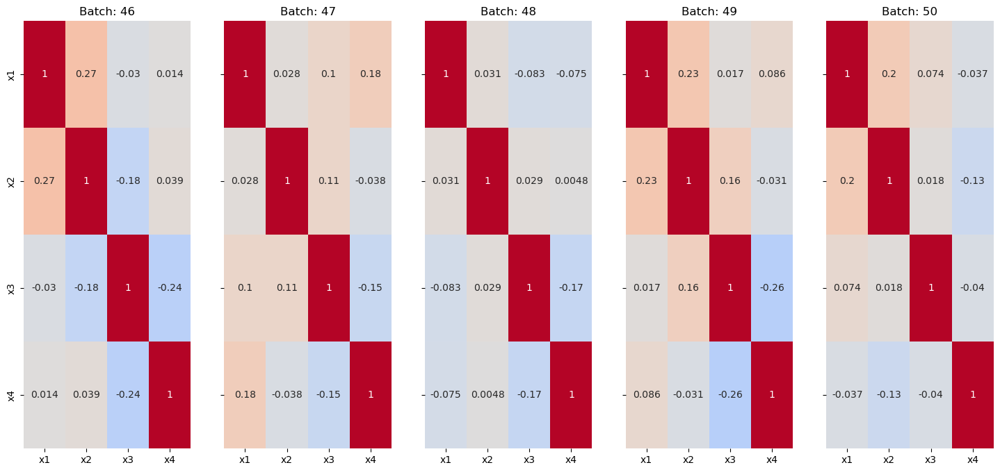

In [57]:
for i in sublists2:
    fig, axs = plt.subplots(1, len(i), figsize=(18, 8), sharex=True, sharey=True )

    for ix in range(len(i)):
        sns.heatmap( data = corr_per_group_all2.loc[ i[ ix ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[ix] )

        axs[ ix ].set_title('Batch: %s' % i[ ix ] )

    plt.show()

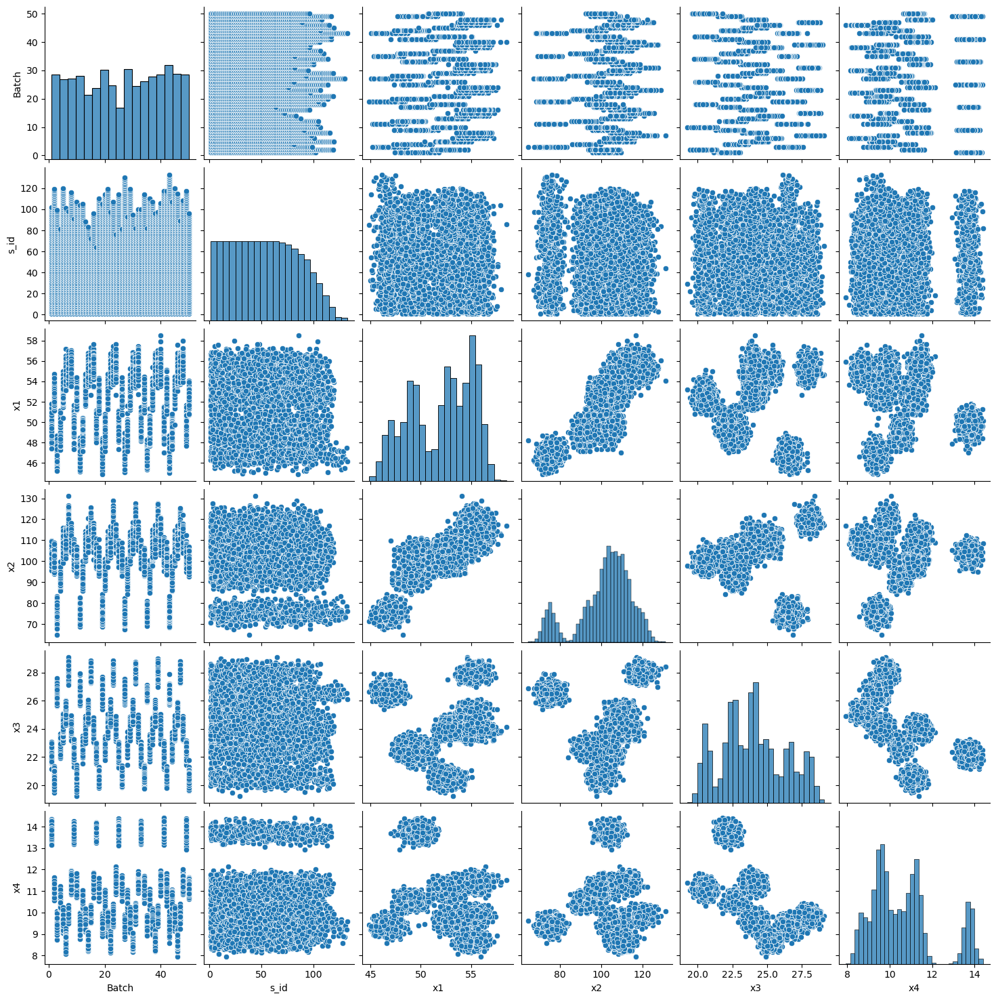

In [58]:
sns.pairplot(data = m02_df)

plt.show()

* Yes, the relationships between the operating variables vary across the Batch values.

### `m03_df` Overview

In [59]:
m03_df.shape

(4458, 7)

* `m03_df` has `4458 rows` and `7columns`.

In [60]:
m03_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4458 entries, 0 to 4457
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      4458 non-null   object 
 1   Batch   4458 non-null   int64  
 2   s_id    4458 non-null   int64  
 3   x1      4458 non-null   float64
 4   x2      4458 non-null   float64
 5   x3      4458 non-null   float64
 6   x4      4458 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 243.9+ KB


* Variables `x1, x2, x3, x4` are of `float` data types.
* Variables `Batch, s_id` are of `integer` data types.
* Variable `ID` is of `object` data type.

In [61]:
m03_df['Batch'] = m03_df['Batch'].astype('object')

In [62]:
m03_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4458 entries, 0 to 4457
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   ID      4458 non-null   object 
 1   Batch   4458 non-null   object 
 2   s_id    4458 non-null   int64  
 3   x1      4458 non-null   float64
 4   x2      4458 non-null   float64
 5   x3      4458 non-null   float64
 6   x4      4458 non-null   float64
dtypes: float64(4), int64(1), object(2)
memory usage: 243.9+ KB


In [63]:
m03_df.nunique()

ID       4458
Batch      41
s_id      141
x1       4458
x2       4458
x3       4458
x4       4458
dtype: int64

* Variables `ID, x1, x2, x3, x4` have `4458 unique values` each.
* Variable `Batch` has `41 unique values`.
* Variable `s_id` has `141 unique values`.

In [64]:
m03_df.isna().sum()

ID       0
Batch    0
s_id     0
x1       0
x2       0
x3       0
x4       0
dtype: int64

* There are no null values in the variables of Machine 3

### `m03_df` Marginal Behavior

In [65]:
m03_df.describe()

,s_id,x1,x2,x3,x4
count,4458.000000,4458.000000,4458.000000,4458.000000,4458.000000
mean,56.475774,51.857672,101.650057,23.927679,10.602371
std,33.827427,3.022646,12.243012,2.035196,1.554708
min,1.000000,45.690397,70.192150,19.865338,8.155668
25%,28.000000,49.228020,95.381831,22.457249,9.475467
50%,55.000000,52.598712,104.712727,23.900193,10.351781
75%,83.000000,54.810528,110.050211,25.142293,11.301126
max,141.000000,56.981029,126.332105,28.972747,14.182623


In [66]:
m03_df.describe(include=object)

,ID,Batch
count,4458,4458
unique,4458,41
top,B001-M03-S001,5
freq,1,141


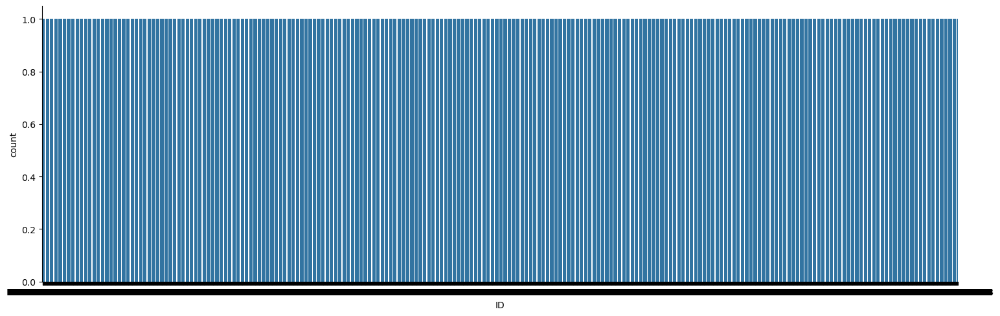

In [67]:
sns.catplot(data = m03_df, x='ID', kind='count', aspect=3)

plt.show()

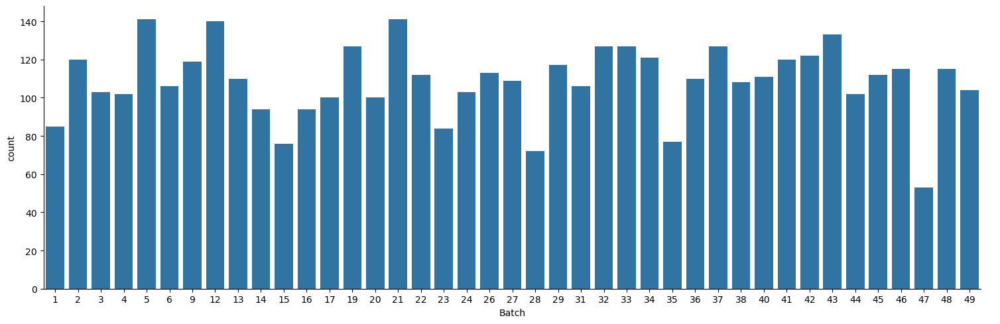

In [68]:
sns.catplot(data = m03_df, x='Batch', kind='count', aspect=3)

plt.show()

* There are `41` unique values for Batch associated with Machine 2
* We can visually see the number of cell phone cases associated with the 2nd machine for each batch from the graph above. 

In [69]:
m03_df_features = m03_df.select_dtypes('number').copy()
m03_df_features = m03_df_features.drop(columns=['s_id'])
m03_df_features

,x1,x2,x3,x4
0,49.317142,103.793803,21.848400,13.539224
1,49.983523,106.266817,22.530393,13.741064
2,48.762702,98.864632,22.462081,13.818300
3,50.009580,104.689498,22.369850,13.849127
4,48.892358,102.974600,22.657941,13.795078
...,...,...,...,...
4453,49.278415,102.089925,22.396979,13.753264
4454,49.264754,104.619874,21.977716,13.636539
4455,49.465358,102.867473,22.257845,13.678206
4456,49.751785,104.863427,22.461204,13.880084


In [70]:
m03_lf = m03_df_features.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=['rowid'])
m03_lf

,rowid,variable,value
0,0,x1,49.317142
1,1,x1,49.983523
2,2,x1,48.762702
3,3,x1,50.009580
4,4,x1,48.892358
...,...,...,...
17827,4453,x4,13.753264
17828,4454,x4,13.636539
17829,4455,x4,13.678206
17830,4456,x4,13.880084


In [71]:
m03_objects = m03_df.select_dtypes('object').copy()
m03_objects

,ID,Batch
0,B001-M03-S001,1
1,B001-M03-S002,1
2,B001-M03-S003,1
3,B001-M03-S004,1
4,B001-M03-S005,1
...,...,...
4453,B049-M03-S100,49
4454,B049-M03-S101,49
4455,B049-M03-S102,49
4456,B049-M03-S103,49


In [72]:
id_cols3 = ['rowid'] + m03_objects.columns.to_list()
id_cols3

['rowid', 'ID', 'Batch']

In [73]:
m03_objects_lf = m03_df.reset_index().\
rename(columns={'index': 'rowid'}).\
melt(id_vars=id_cols3, value_vars=m03_df_features.columns)
m03_objects_lf

,rowid,ID,Batch,variable,value
0,0,B001-M03-S001,1,x1,49.317142
1,1,B001-M03-S002,1,x1,49.983523
2,2,B001-M03-S003,1,x1,48.762702
3,3,B001-M03-S004,1,x1,50.009580
4,4,B001-M03-S005,1,x1,48.892358
...,...,...,...,...,...
17827,4453,B049-M03-S100,49,x4,13.753264
17828,4454,B049-M03-S101,49,x4,13.636539
17829,4455,B049-M03-S102,49,x4,13.678206
17830,4456,B049-M03-S103,49,x4,13.880084


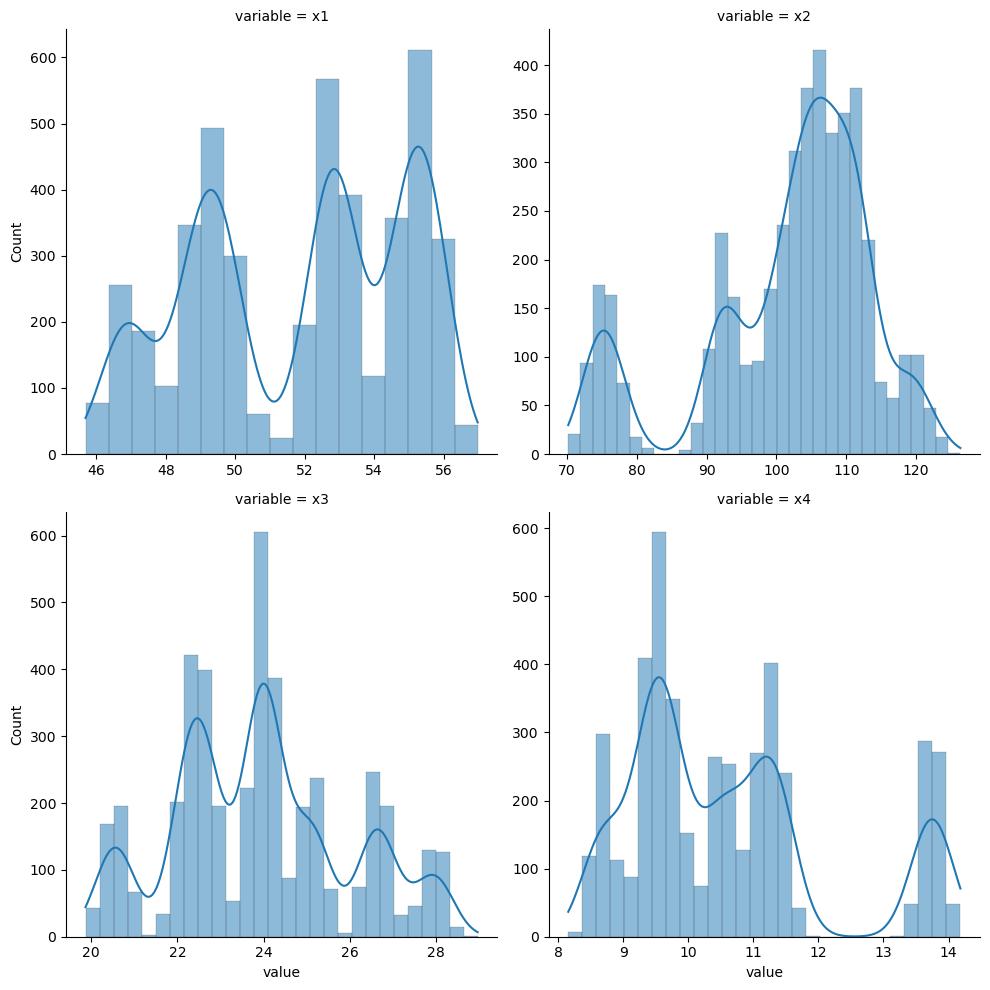

In [74]:
sns.displot(data = m03_lf, x='value', col='variable', kind='hist', kde=True,
            facet_kws={'sharex': False, 'sharey': False},
            common_bins=False, col_wrap=2)

plt.show()

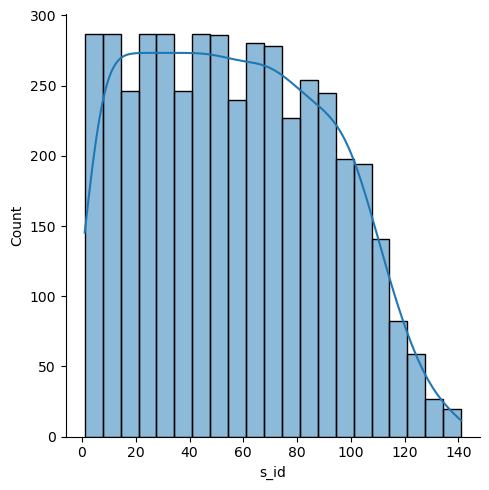

In [75]:
sns.displot(data = m03_df, x='s_id', kind='hist', kde=True) 

plt.show()

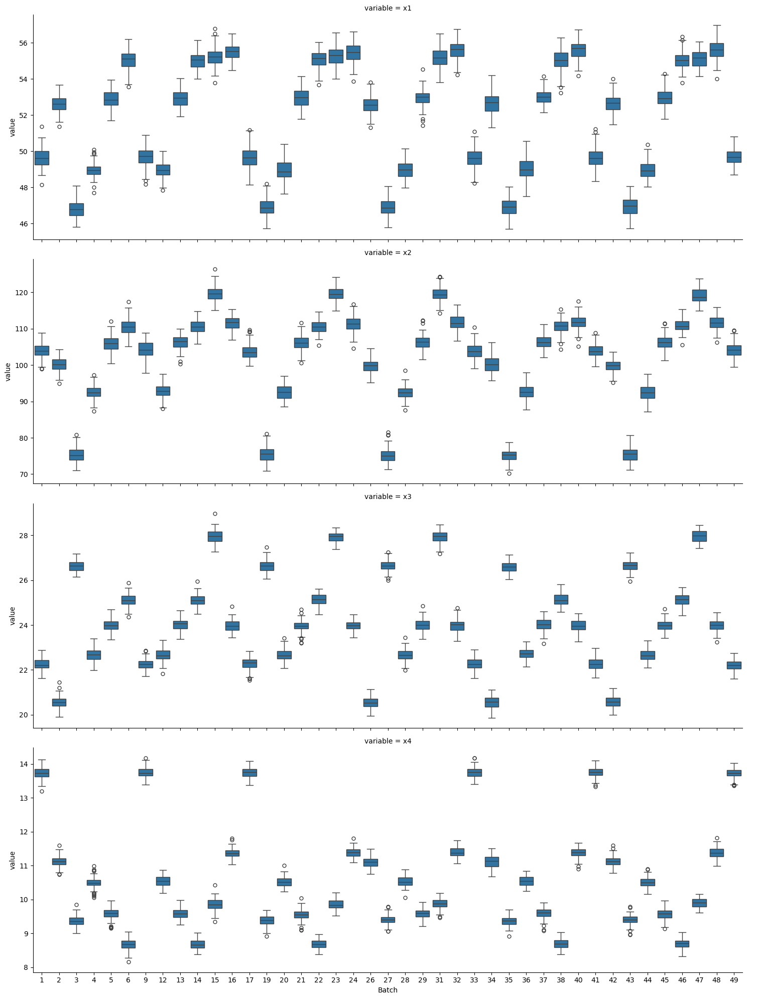

In [76]:
sns.catplot(data = m03_objects_lf, x='Batch', y='value', col='variable', col_wrap=1, aspect=3,
            kind='box',
            sharey=False)

plt.show()

* The summary statistics of the operating variables vary across the Batch values.

In [77]:
m03_df_features

,x1,x2,x3,x4
0,49.317142,103.793803,21.848400,13.539224
1,49.983523,106.266817,22.530393,13.741064
2,48.762702,98.864632,22.462081,13.818300
3,50.009580,104.689498,22.369850,13.849127
4,48.892358,102.974600,22.657941,13.795078
...,...,...,...,...
4453,49.278415,102.089925,22.396979,13.753264
4454,49.264754,104.619874,21.977716,13.636539
4455,49.465358,102.867473,22.257845,13.678206
4456,49.751785,104.863427,22.461204,13.880084


In [78]:
m03_df_features_batch = m03_df_features.copy()
m03_df_features_batch['Batch'] = m03_df['Batch']
m03_df_features_batch

,x1,x2,x3,x4,Batch
0,49.317142,103.793803,21.848400,13.539224,1
1,49.983523,106.266817,22.530393,13.741064,1
2,48.762702,98.864632,22.462081,13.818300,1
3,50.009580,104.689498,22.369850,13.849127,1
4,48.892358,102.974600,22.657941,13.795078,1
...,...,...,...,...,...
4453,49.278415,102.089925,22.396979,13.753264,49
4454,49.264754,104.619874,21.977716,13.636539,49
4455,49.465358,102.867473,22.257845,13.678206,49
4456,49.751785,104.863427,22.461204,13.880084,49


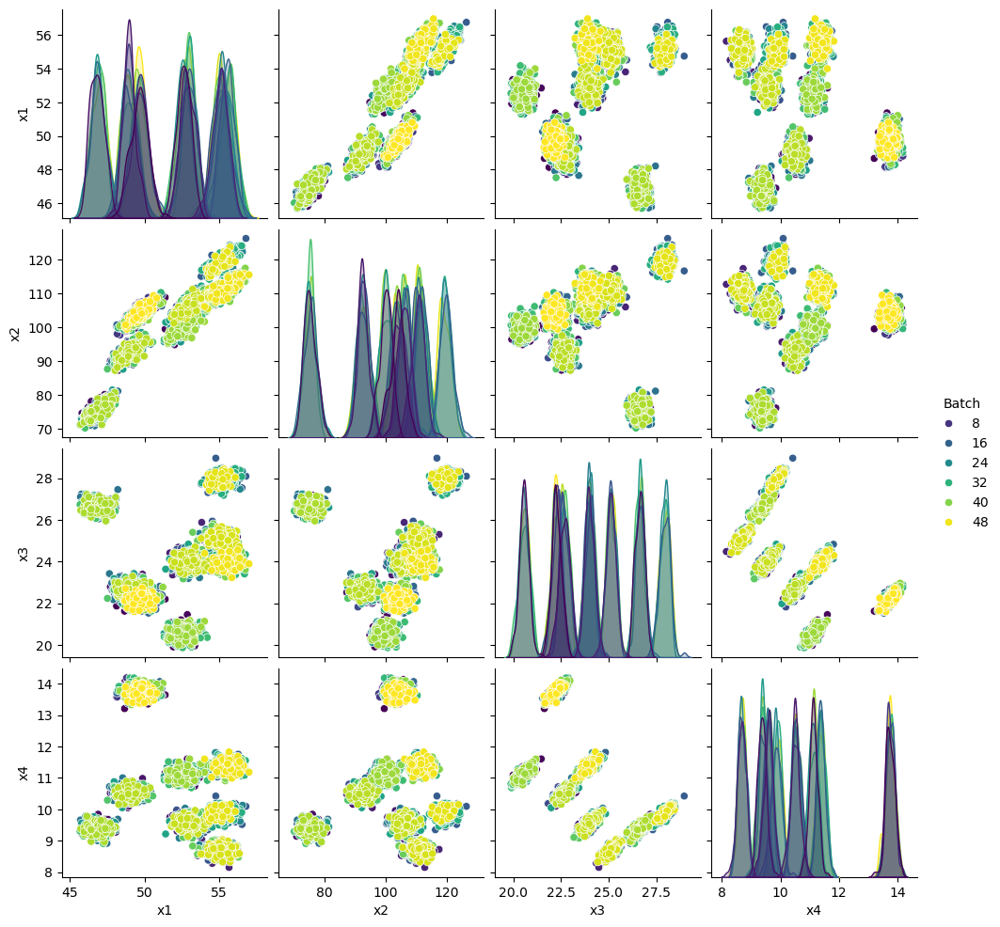

In [79]:
sns.pairplot(data = m03_df_features_batch, hue='Batch', 
             diag_kws={'common_norm': False}, palette='viridis')

plt.show()

In [80]:
corr_per_group_all3 = m03_df_features_batch.groupby('Batch').corr(numeric_only=True)
corr_per_group_all3

x1        x2        x3        x4
Batch                                           
1     x1  1.000000  0.760277  0.127774 -0.027709
      x2  0.760277  1.000000  0.096853  0.016254
      x3  0.127774  0.096853  1.000000  0.744956
      x4 -0.027709  0.016254  0.744956  1.000000
2     x1  1.000000  0.685391 -0.004765  0.046219
...            ...       ...       ...       ...
48    x4  0.064493 -0.042554  0.764414  1.000000
49    x1  1.000000  0.792663 -0.032332 -0.095601
      x2  0.792663  1.000000 -0.031371 -0.091763
      x3 -0.032332 -0.031371  1.000000  0.745093
      x4 -0.095601 -0.091763  0.745093  1.000000

[164 rows x 4 columns]

In [81]:
corr_per_group_all3

x1        x2        x3        x4
Batch                                           
1     x1  1.000000  0.760277  0.127774 -0.027709
      x2  0.760277  1.000000  0.096853  0.016254
      x3  0.127774  0.096853  1.000000  0.744956
      x4 -0.027709  0.016254  0.744956  1.000000
2     x1  1.000000  0.685391 -0.004765  0.046219
...            ...       ...       ...       ...
48    x4  0.064493 -0.042554  0.764414  1.000000
49    x1  1.000000  0.792663 -0.032332 -0.095601
      x2  0.792663  1.000000 -0.031371 -0.091763
      x3 -0.032332 -0.031371  1.000000  0.745093
      x4 -0.095601 -0.091763  0.745093  1.000000

[164 rows x 4 columns]

In [82]:
the_groups3 = m03_df_features_batch.Batch.unique().tolist()
print(the_groups3)

[1, 2, 3, 4, 5, 6, 9, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


In [83]:
len(the_groups3)

41

In [84]:
sublists3 = [the_groups3[i:i + 5] for i in range(0, len(the_groups3) - 1, 5)]

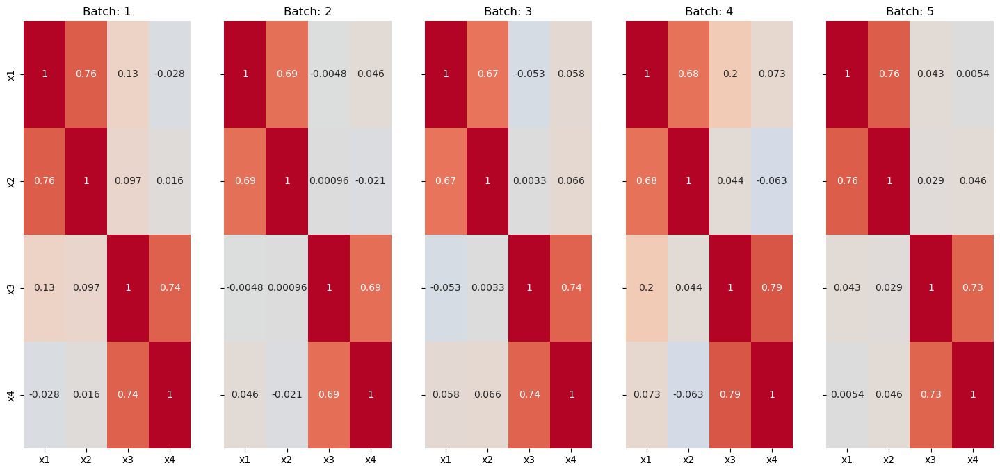

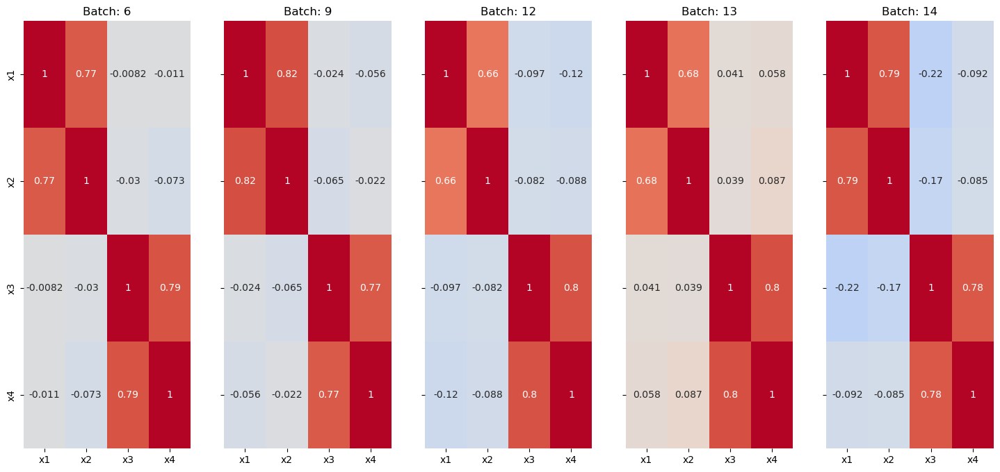

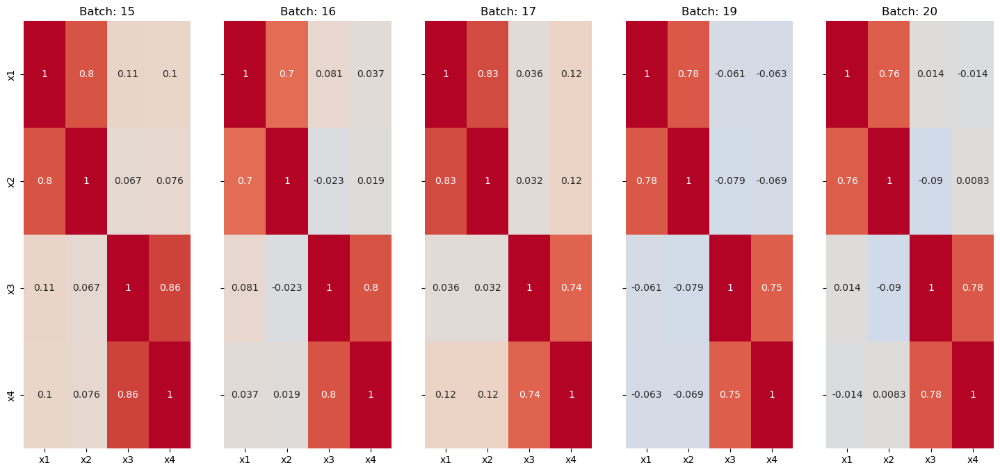

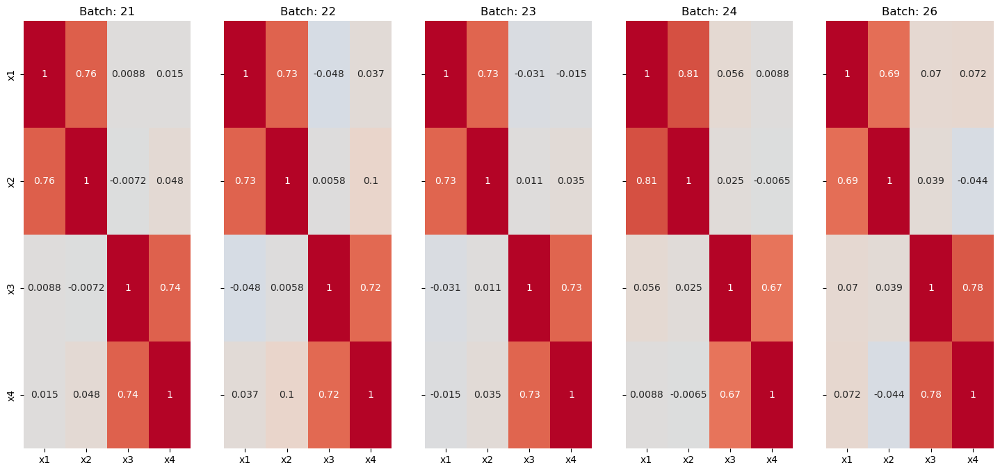

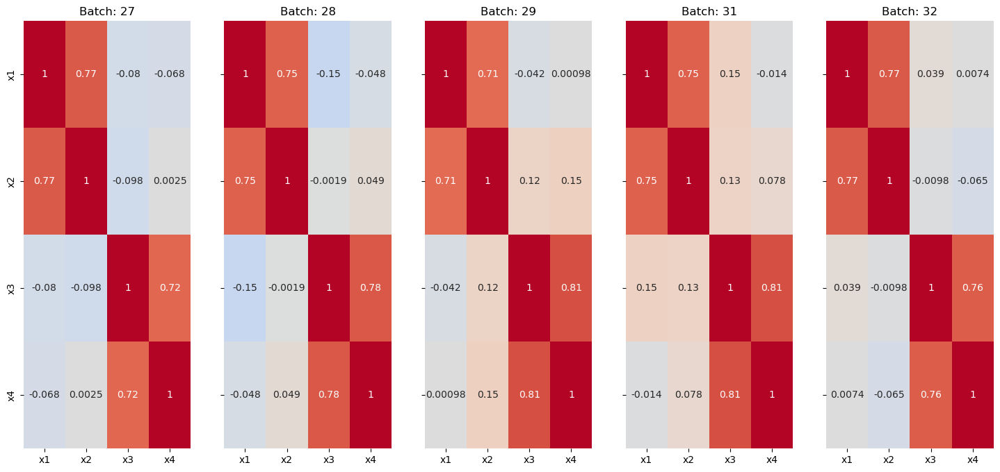

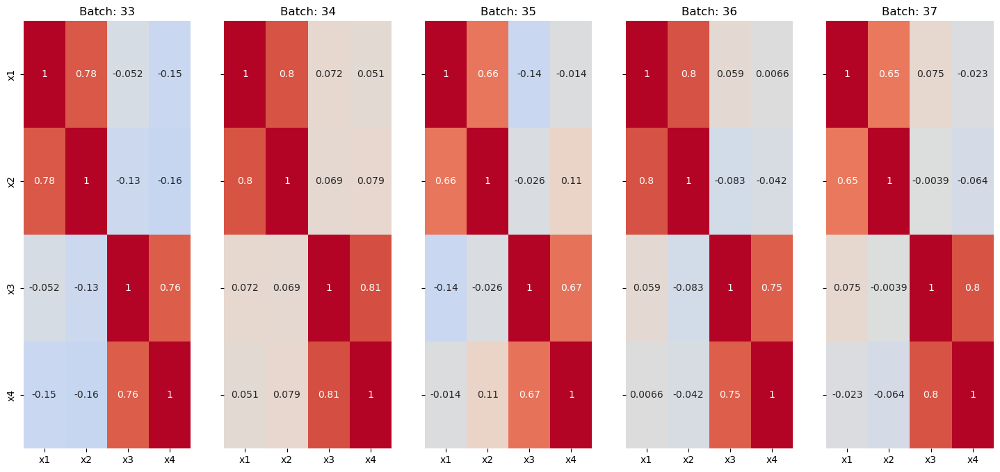

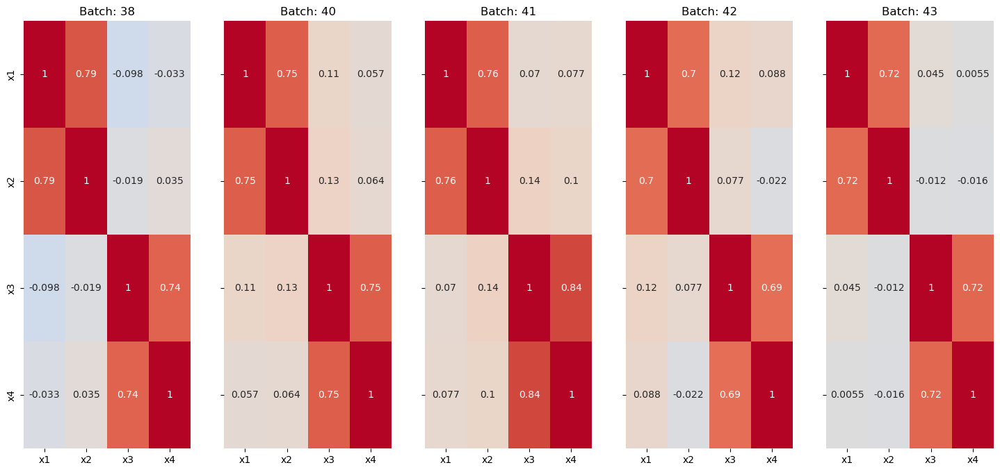

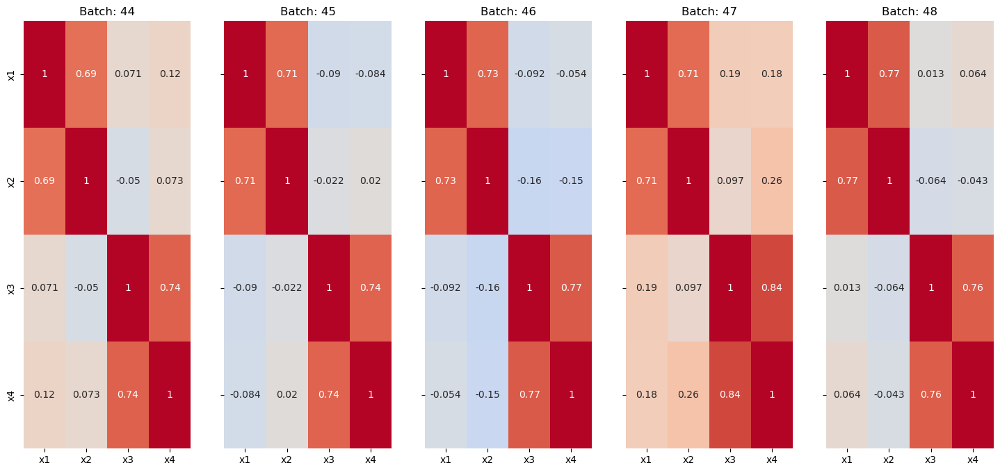

In [85]:
for i in sublists3:
    fig, axs = plt.subplots(1, len(i), figsize=(18, 8), sharex=True, sharey=True )

    for ix in range(len(i)):
        sns.heatmap( data = corr_per_group_all3.loc[ i[ ix ] ],
                     vmin=-1, vmax=1, center = 0,
                     cmap='coolwarm', cbar=False,
                     annot=True, annot_kws={'size': 10},
                     ax=axs[ix] )

        axs[ ix ].set_title('Batch: %s' % i[ ix ] )

    plt.show()

In [86]:
sublists31 = the_groups3[len(the_groups3) - 1]
sublists31

49

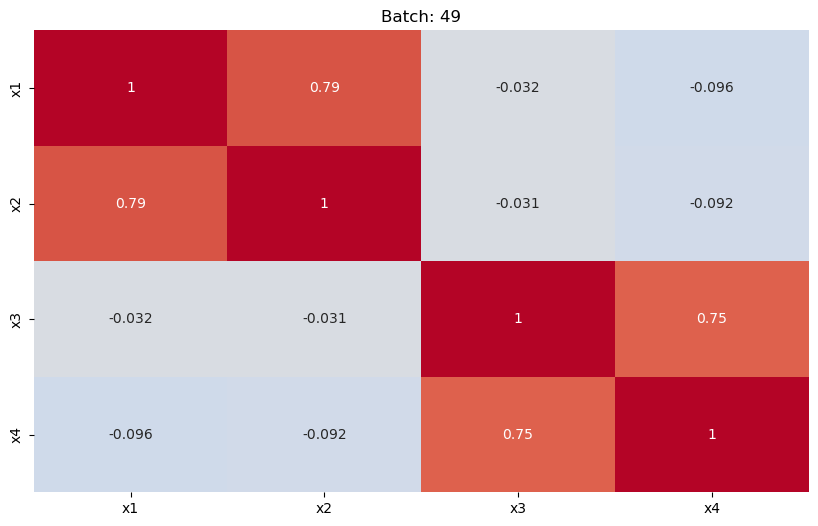

In [87]:
fig, axs = plt.subplots(figsize=(10, 6) )

sns.heatmap( data = corr_per_group_all3.loc[ sublists31 ],
             vmin=-1, vmax=1, center = 0,
             cmap='coolwarm', cbar=False,
             annot=True, annot_kws={'size': 10},
             ax=axs )

axs.set_title('Batch: %s' % sublists31 )

plt.show()

* The relationships between the operating variables vary across the batches.

In [88]:
m01_df['machine_id'] = 1
m02_df['machine_id'] = 2
m03_df['machine_id'] = 3

In [89]:
# concatenate the 3 DataFrames into a single DataFrame which includes the `machine_id` variable

machine_df = pd.concat([m01_df, m02_df, m03_df])
machine_df

,ID,Batch,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524,1
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482,1
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758,1
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666,1
...,...,...,...,...,...,...,...,...
4453,B049-M03-S100,49,100,49.278415,102.089925,22.396979,13.753264,3
4454,B049-M03-S101,49,101,49.264754,104.619874,21.977716,13.636539,3
4455,B049-M03-S102,49,102,49.465358,102.867473,22.257845,13.678206,3
4456,B049-M03-S103,49,103,49.751785,104.863427,22.461204,13.880084,3


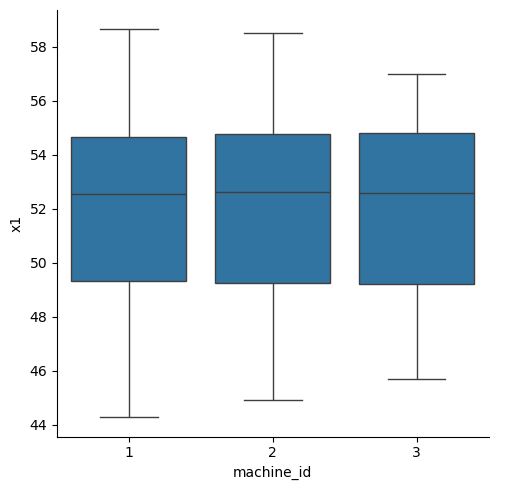

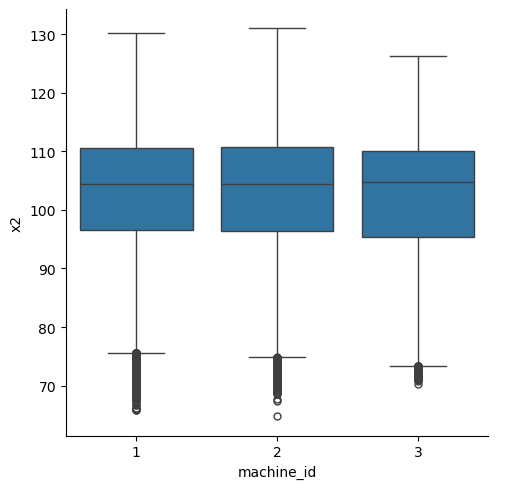

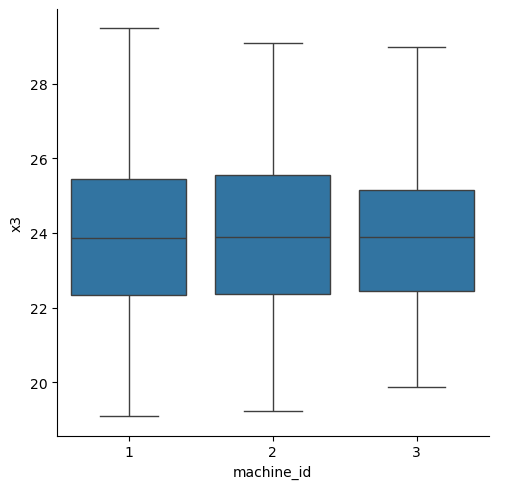

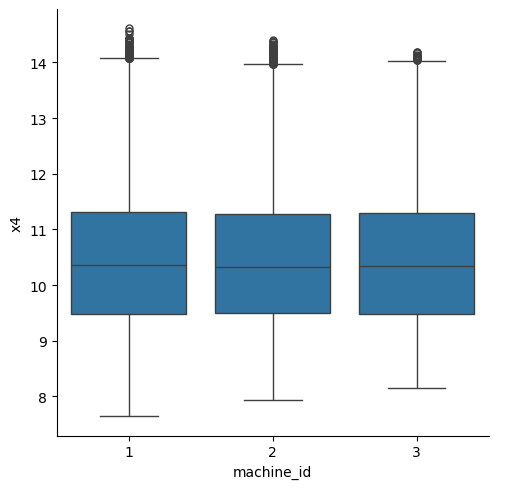

In [90]:
listx = ['x1', 'x2', 'x3', 'x4']

for i in listx:

    sns.catplot(data=machine_df, x='machine_id', y=i, kind='box')

plt.show()

* No, the summary statistics of the OPERATING VARIABLES x1 through x4 do not vary across the three MACHINES.

In [91]:
groups4 = machine_df.machine_id.unique().tolist()
groups4

[1, 2, 3]

In [92]:
corr_per_group4 = machine_df.loc[ :, ['x1', 'x2', 'x3', 'x4', 'machine_id']].groupby(['machine_id']).corr()
corr_per_group4

x1        x2        x3        x4
machine_id                                           
1          x1  1.000000  0.725695  0.117574 -0.191357
           x2  0.725695  1.000000  0.064586  0.091319
           x3  0.117574  0.064586  1.000000 -0.584667
           x4 -0.191357  0.091319 -0.584667  1.000000
2          x1  1.000000  0.850194  0.110249 -0.187127
           x2  0.850194  1.000000  0.056123  0.102422
           x3  0.110249  0.056123  1.000000 -0.569695
           x4 -0.187127  0.102422 -0.569695  1.000000
3          x1  1.000000  0.883526  0.093064 -0.199686
           x2  0.883526  1.000000 -0.024685  0.114277
           x3  0.093064 -0.024685  1.000000 -0.573415
           x4 -0.199686  0.114277 -0.573415  1.000000

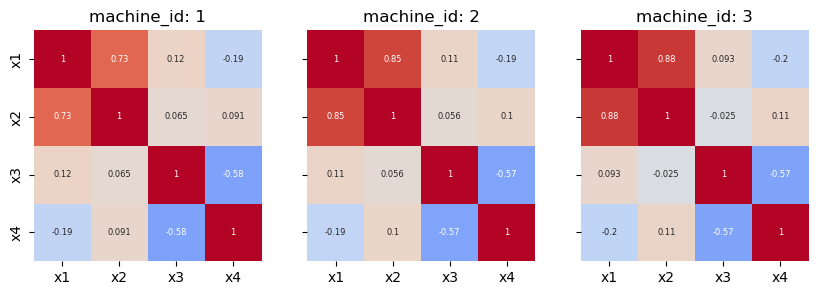

In [93]:
fig, axs = plt.subplots(1, len(groups4), figsize=(10, 3), sharex=True, sharey=True)

for ix in range(len(groups4)):
    sns.heatmap(data = corr_per_group4.loc[groups4[ix]],
                 vmin=-1, vmax=1, center = 0,
                 cmap='coolwarm', cbar=False,
                 annot=True, annot_kws={'size': 6},
                 ax=axs[ix])

    axs[ix].set_title('machine_id: %s' % groups4[ix] )

plt.show()

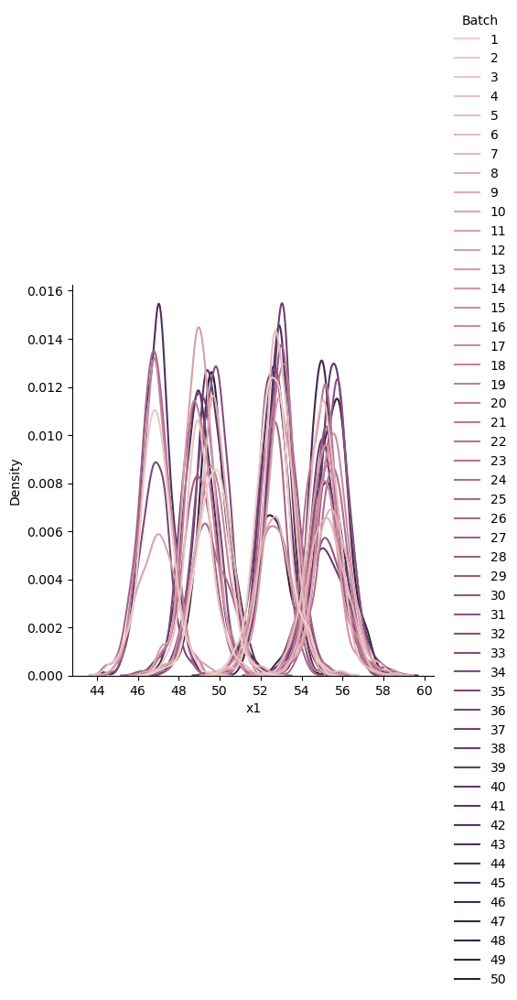

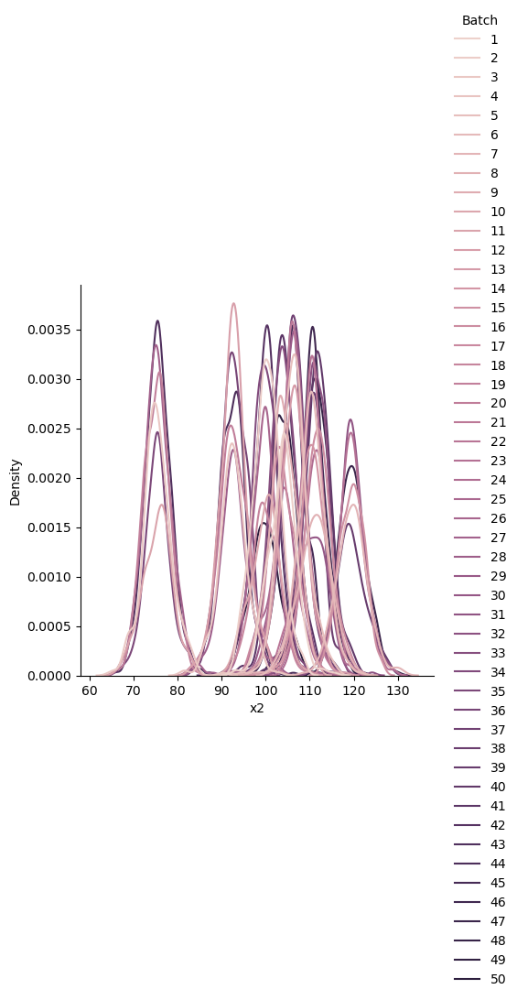

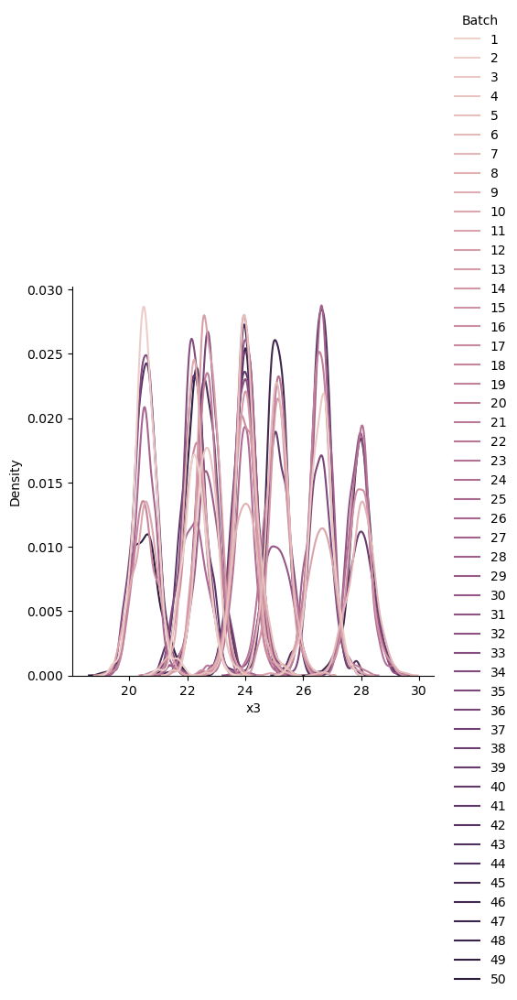

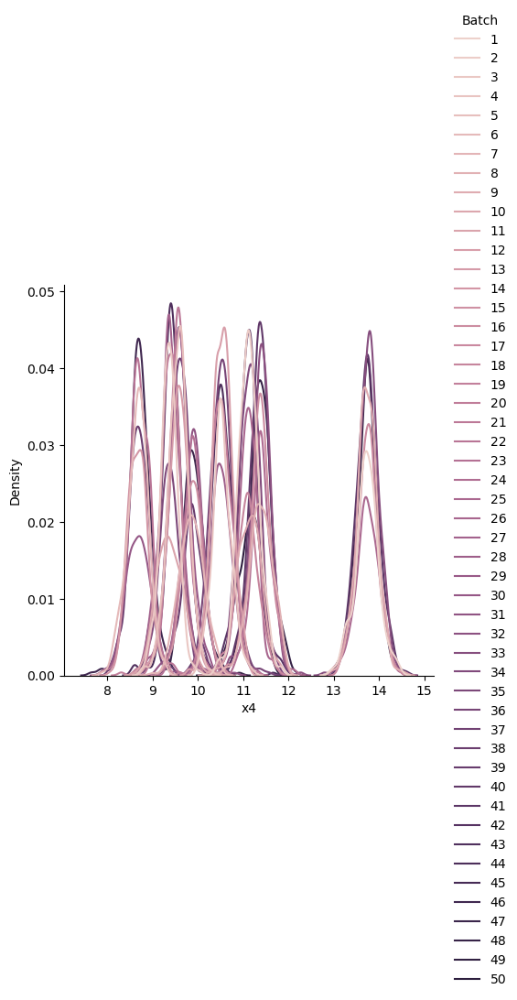

In [94]:
listx = ['x1', 'x2', 'x3', 'x4']

for i in listx:
    sns.displot(data=machine_df, x=i, hue='Batch', kind='kde')

plt.show()

* Yes, the relationships between the OPERATING VARIABLES x1 through x4 vary across the three MACHINES.

## Problem 02

The supplier batch data set file name is provided for you below. You must read in the CSV file and assign the data set to the `batch_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Do the summary statistics for `Density` depend on the `Supplier`?
* Does the average `Density` depend on the `Supplier`?
* How does `Density` relate to `Batch` for each `Supplier`?

After exploring the `batch_df` DataFrame, you **MUST** JOIN/MERGE the `batch_df` DataFrame with the `machine_df` DataFrame. Assign the merged DataFrame to the `dfa` DataFrame.

You can now explore the relationships between the MACHINE OPERATIONAL VARIABLES and the SUPPLIERS! You must use visualizations to explore the following relationships:
* Explore if the summary statistics of the 4 OPERATING VARIABLES `x1` through `x4` vary across `Batch` for each MACHINE given each `Supplier`. Your figures MUST use `Batch` as the x-axis variable.
* Explore if the relationships between the 4 OPERATING VARIABLES `x1` through `x4` vary across `Supplier`.

You may add as many markdown and code cells as you see fit to answer this question.

#### SOLUTION

In [97]:
# define the batch supplier file
batch_file = 'midterm_supplier.csv'

In [98]:
# read in the batch supplier data set

batch_df = pd.read_csv(batch_file)
batch_df

,Batch,Supplier,Density
0,1,B,10.388587
1,2,A,9.296880
2,3,A,9.565636
3,4,B,10.005387
4,5,A,9.339177
5,6,A,12.246089
6,7,A,9.695526
7,8,A,9.966524
8,9,B,9.394692
9,10,B,9.289811


In [99]:
batch_df.shape

(50, 3)

* `batch_df` has `50 rows` and `3 columns`.

In [100]:
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     int64  
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 1.3+ KB


* `Batch` is `integer` data type.
* `Supplier` is `object` data type.
* `Density` is `float` data type.

In [101]:
batch_df.nunique()

Batch       50
Supplier     2
Density     50
dtype: int64

* `Batch` and `Density` have 50 unique values each.
* `Supplier` has 2 unique variables.

In [102]:
batch_df.isna().sum()

Batch       0
Supplier    0
Density     0
dtype: int64

* The variables do not have null values in `batch_df`.

In [103]:
batch_df['Batch'] = batch_df['Batch'].astype('object')

In [104]:
batch_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Batch     50 non-null     object 
 1   Supplier  50 non-null     object 
 2   Density   50 non-null     float64
dtypes: float64(1), object(2)
memory usage: 1.3+ KB


### `batch_df` Marginal Behavior

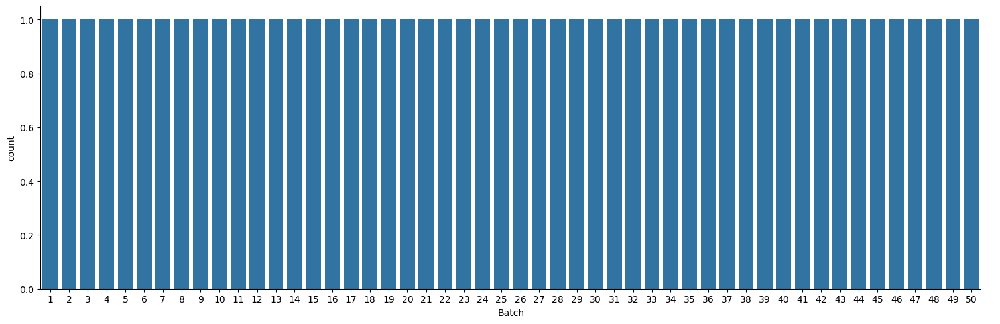

In [105]:
sns.catplot( data = batch_df, x='Batch', kind='count', aspect=3 )

plt.show()

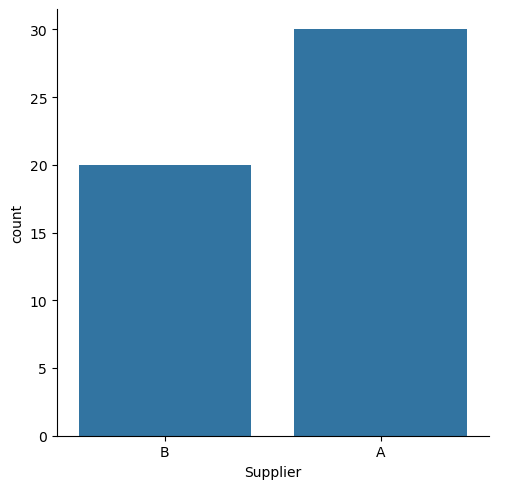

In [106]:
sns.catplot( data = batch_df, x='Supplier', kind='count' )

plt.show()

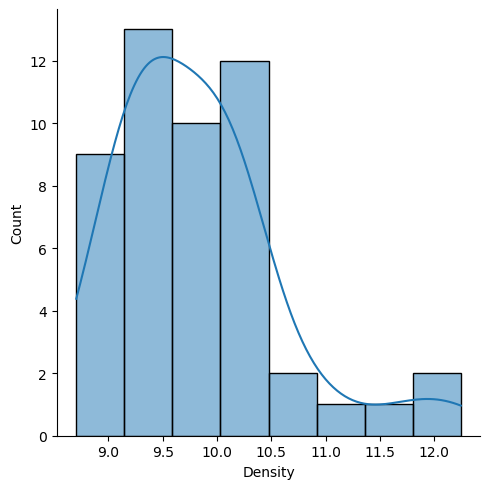

In [107]:
sns.displot(data = batch_df, x='Density', kind='hist', kde=True)

plt.show()

### `batch_df` Relationship

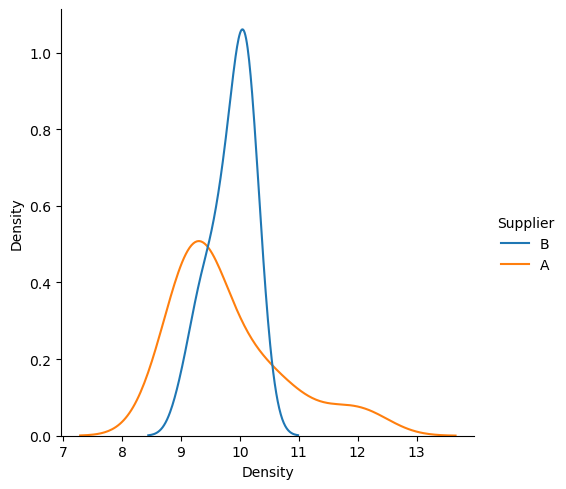

In [108]:
sns.displot(data = batch_df, x='Density', hue='Supplier',
            common_norm=False, kind='kde')

plt.show()

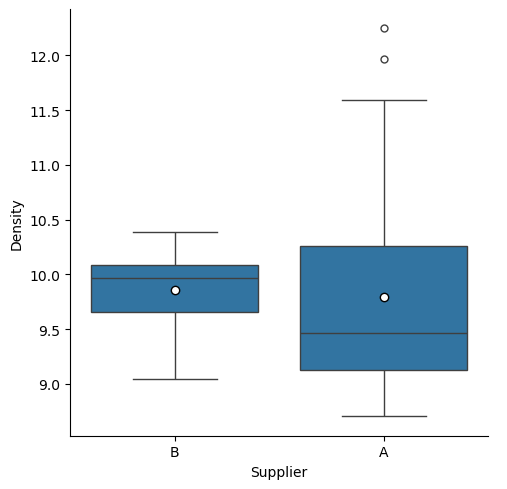

In [109]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='box',
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

/tmp/ipykernel_885/2501799885.py:1: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  sns.catplot(data = batch_df, x='Supplier', y='Density', kind='point', aspect=2, join=False)


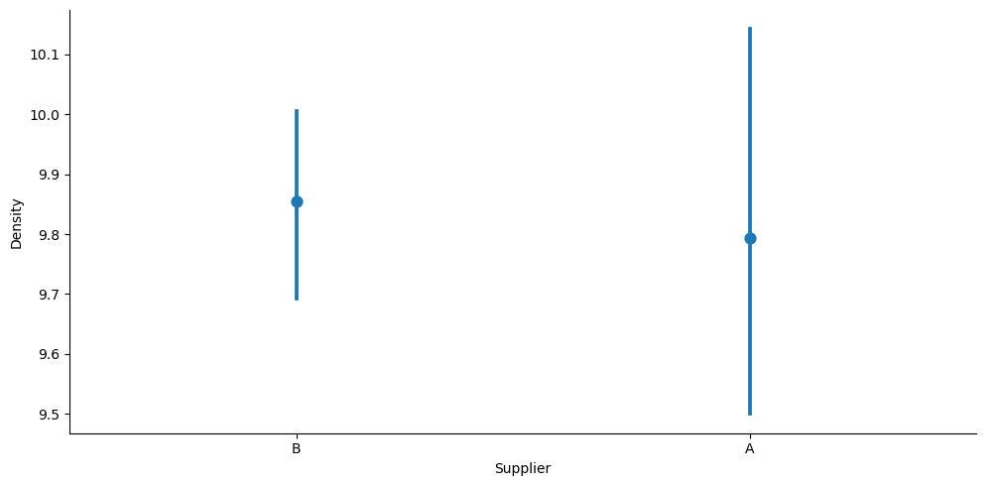

In [110]:
sns.catplot(data = batch_df, x='Supplier', y='Density', kind='point', aspect=2, join=False)

plt.show()

* Yes, the summary statistics for `Density` depend on the `Supplier`.
* Yes, the average density depends on the supplier.

In [111]:
batch_df['Batch'] = batch_df.Batch.astype('int64')

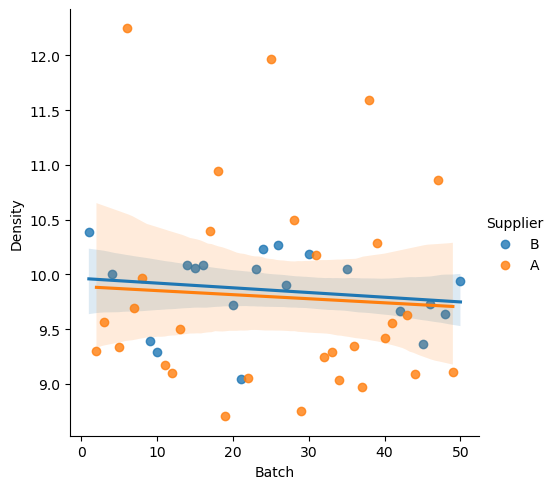

In [112]:
sns.lmplot(data = batch_df, x = 'Batch', y = 'Density', hue = 'Supplier')

plt.show()

* Relationship for Density vs Batch for each supplier is shown above. The trend plot shows almost a flat line indicating there is no relationship.

In [113]:
batch_df.head()

,Batch,Supplier,Density
0,1,B,10.388587
1,2,A,9.296880
2,3,A,9.565636
3,4,B,10.005387
4,5,A,9.339177


In [114]:
machine_df.head()

,ID,Batch,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S001,1,1,50.117118,102.167346,22.067812,13.889524,1
1,B001-M01-S002,1,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S003,1,3,50.132744,103.674908,22.319933,13.647482,1
3,B001-M01-S004,1,4,48.501042,107.143156,22.162947,14.077758,1
4,B001-M01-S005,1,5,49.690442,102.120283,22.248696,13.728666,1


In [115]:
# merge the batch supplier data set with the (concatenated) machine data set

dfa = pd.merge( batch_df, machine_df, on='Batch' )
dfa

,Batch,Supplier,Density,ID,s_id,x1,x2,x3,x4,machine_id
0,1,B,10.388587,B001-M01-S001,1,50.117118,102.167346,22.067812,13.889524,1
1,1,B,10.388587,B001-M01-S002,2,46.887333,112.266102,23.197330,13.064709,1
2,1,B,10.388587,B001-M01-S003,3,50.132744,103.674908,22.319933,13.647482,1
3,1,B,10.388587,B001-M01-S004,4,48.501042,107.143156,22.162947,14.077758,1
4,1,B,10.388587,B001-M01-S005,5,49.690442,102.120283,22.248696,13.728666,1
...,...,...,...,...,...,...,...,...,...,...
14724,50,B,9.935676,B050-M02-S092,92,52.690936,95.050804,20.324674,10.963370,2
14725,50,B,9.935676,B050-M02-S093,93,52.348015,97.863144,20.884779,11.156604,2
14726,50,B,9.935676,B050-M02-S094,94,52.187241,99.887013,20.439142,11.303222,2
14727,50,B,9.935676,B050-M02-S095,95,52.875621,101.572057,20.648029,11.084512,2


In [116]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14729 entries, 0 to 14728
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Batch       14729 non-null  object 
 1   Supplier    14729 non-null  object 
 2   Density     14729 non-null  float64
 3   ID          14729 non-null  object 
 4   s_id        14729 non-null  int64  
 5   x1          14729 non-null  float64
 6   x2          14729 non-null  float64
 7   x3          14729 non-null  float64
 8   x4          14729 non-null  float64
 9   machine_id  14729 non-null  int64  
dtypes: float64(5), int64(2), object(3)
memory usage: 1.1+ MB


In [117]:
dfa.describe()

,Density,s_id,x1,x2,x3,x4,machine_id
count,14729.000000,14729.000000,14729.000000,14729.000000,14729.000000,14729.000000,14729.000000
mean,9.735339,54.505465,51.952606,101.966113,23.953500,10.612497,1.952882
std,0.729389,32.927545,3.093916,12.678550,2.203383,1.539387,0.806398
min,8.703627,1.000000,44.275379,64.774007,19.095832,7.644190,1.000000
25%,9.289811,27.000000,49.257492,96.189442,22.394977,9.481281,1.000000
50%,9.624945,53.000000,52.586639,104.533114,23.883004,10.344656,2.000000
75%,10.083865,80.000000,54.757788,110.415780,25.343060,11.300265,3.000000
max,12.246089,149.000000,58.647186,131.009046,29.477213,14.612911,3.000000


In [118]:
dfa.describe(include=object)

,Batch,Supplier,ID
count,14729,14729,14729
unique,50,2,14729
top,12,A,B001-M01-S001
freq,380,9140,1


In [119]:
dfa_copy = dfa[['x1', 'x2', 'x3', 'x4', 'Batch', 'Supplier']].copy()
dfa_copy

,x1,x2,x3,x4,Batch,Supplier
0,50.117118,102.167346,22.067812,13.889524,1,B
1,46.887333,112.266102,23.197330,13.064709,1,B
2,50.132744,103.674908,22.319933,13.647482,1,B
3,48.501042,107.143156,22.162947,14.077758,1,B
4,49.690442,102.120283,22.248696,13.728666,1,B
...,...,...,...,...,...,...
14724,52.690936,95.050804,20.324674,10.963370,50,B
14725,52.348015,97.863144,20.884779,11.156604,50,B
14726,52.187241,99.887013,20.439142,11.303222,50,B
14727,52.875621,101.572057,20.648029,11.084512,50,B


In [120]:
dfa_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14729 entries, 0 to 14728
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   x1        14729 non-null  float64
 1   x2        14729 non-null  float64
 2   x3        14729 non-null  float64
 3   x4        14729 non-null  float64
 4   Batch     14729 non-null  object 
 5   Supplier  14729 non-null  object 
dtypes: float64(4), object(2)
memory usage: 690.5+ KB


### Exploration of `operating variables` across `Batch` given a `Supplier`.

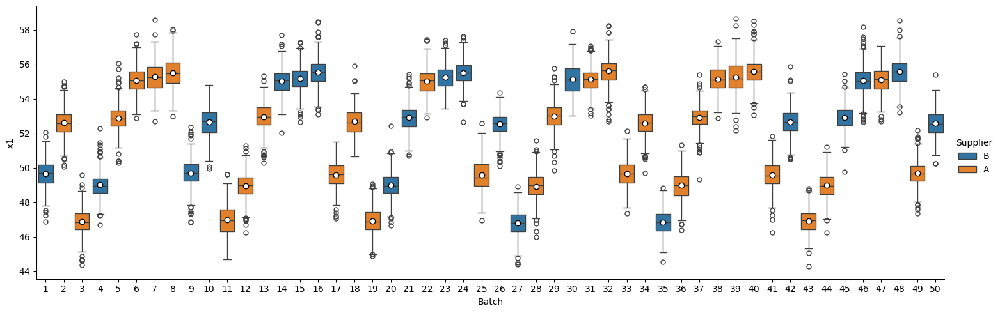

In [121]:
sns.catplot(data = dfa_copy, x='Batch', y='x1', hue='Supplier', kind='box', aspect=3,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

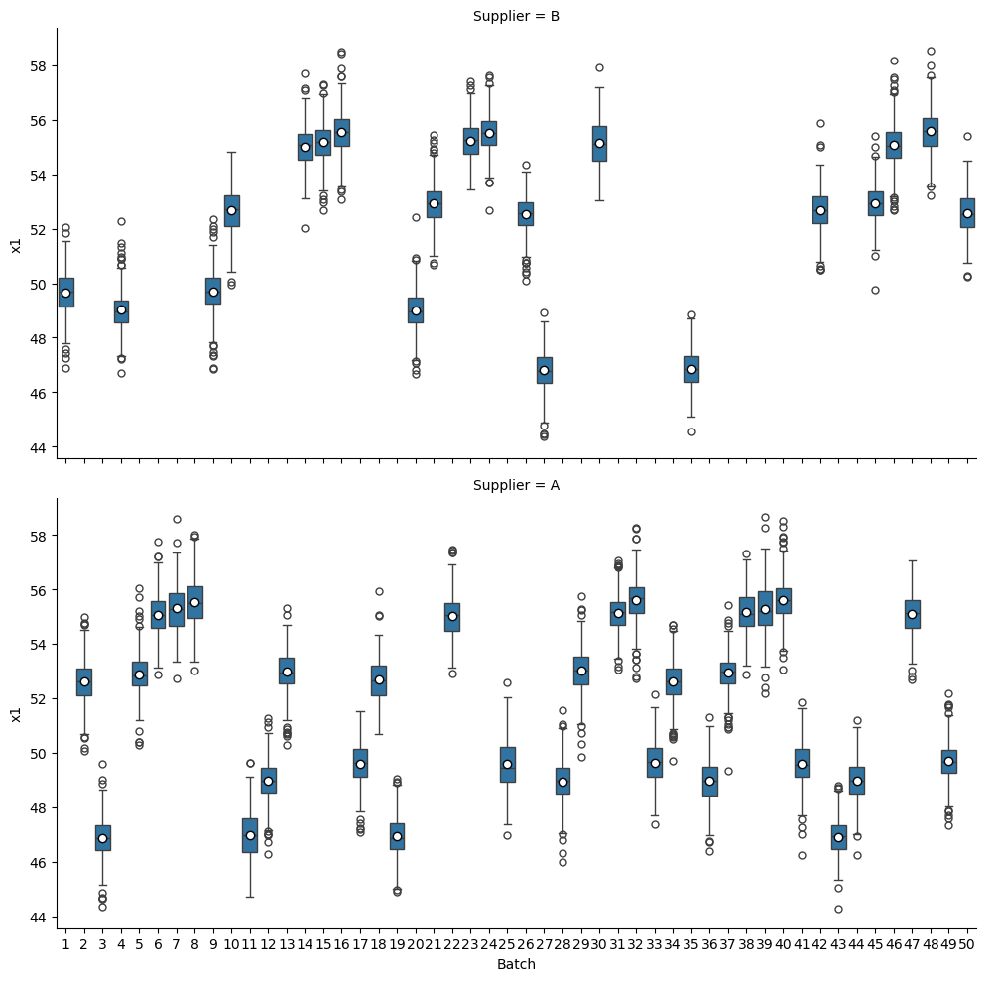

In [122]:
sns.catplot(data = dfa_copy, x='Batch', y='x1', row='Supplier', kind='box', aspect=2,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

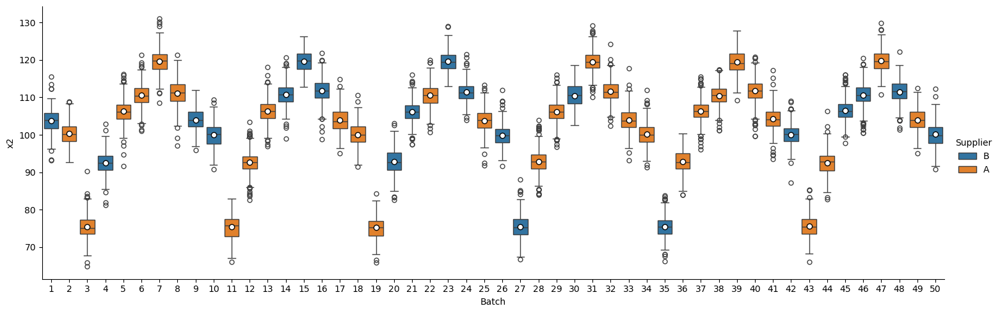

In [123]:
sns.catplot(data = dfa_copy, x='Batch', y='x2', hue='Supplier', kind='box', aspect=3,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

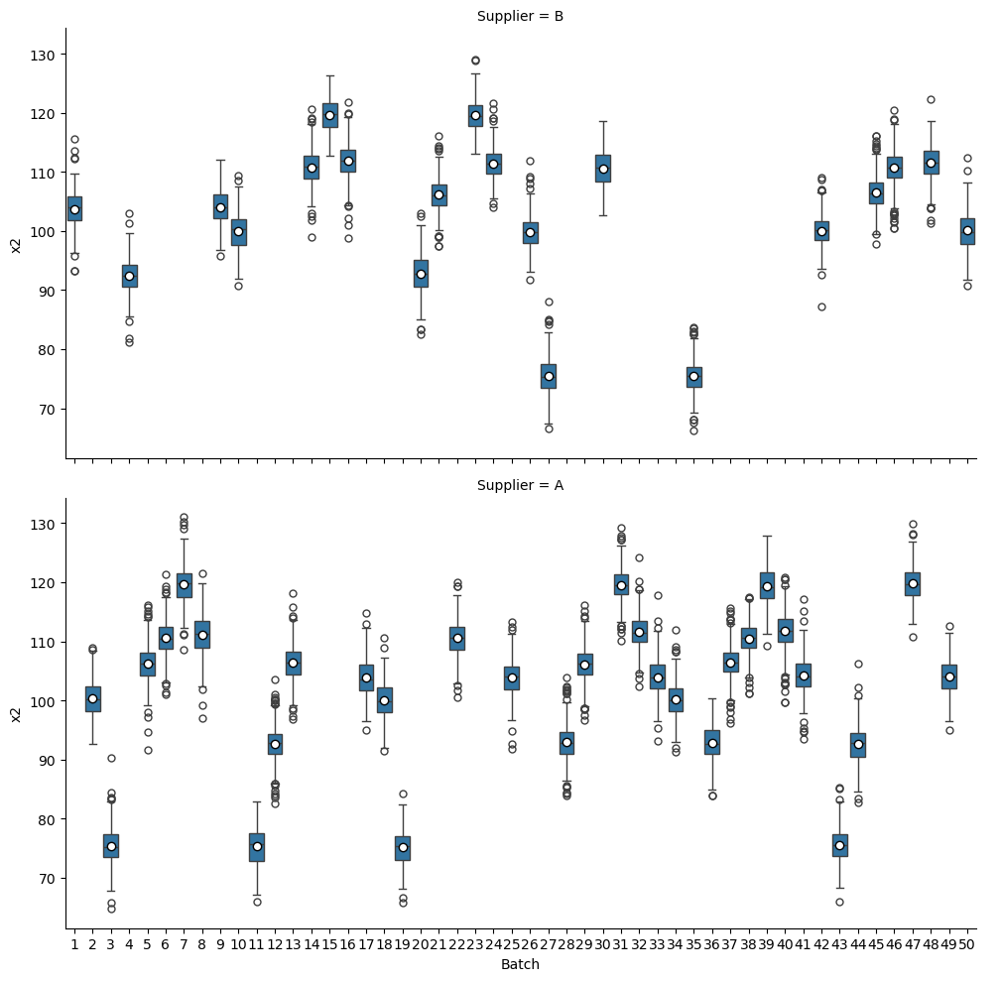

In [124]:
sns.catplot(data = dfa_copy, x='Batch', y='x2', row='Supplier', kind='box', aspect=2,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

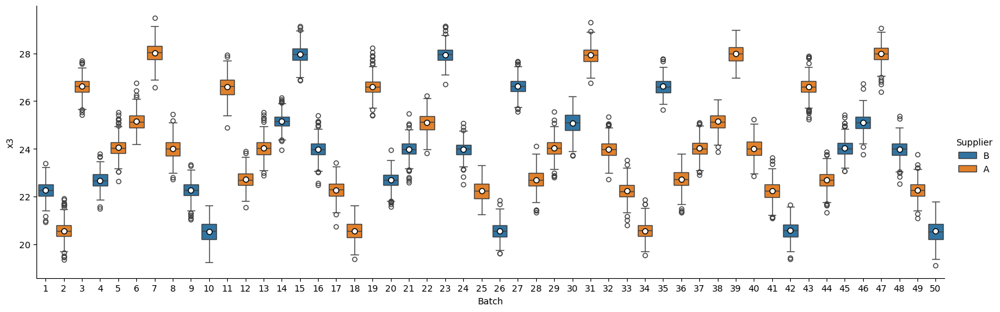

In [125]:
sns.catplot(data = dfa_copy, x='Batch', y='x3', hue='Supplier', kind='box', aspect=3,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

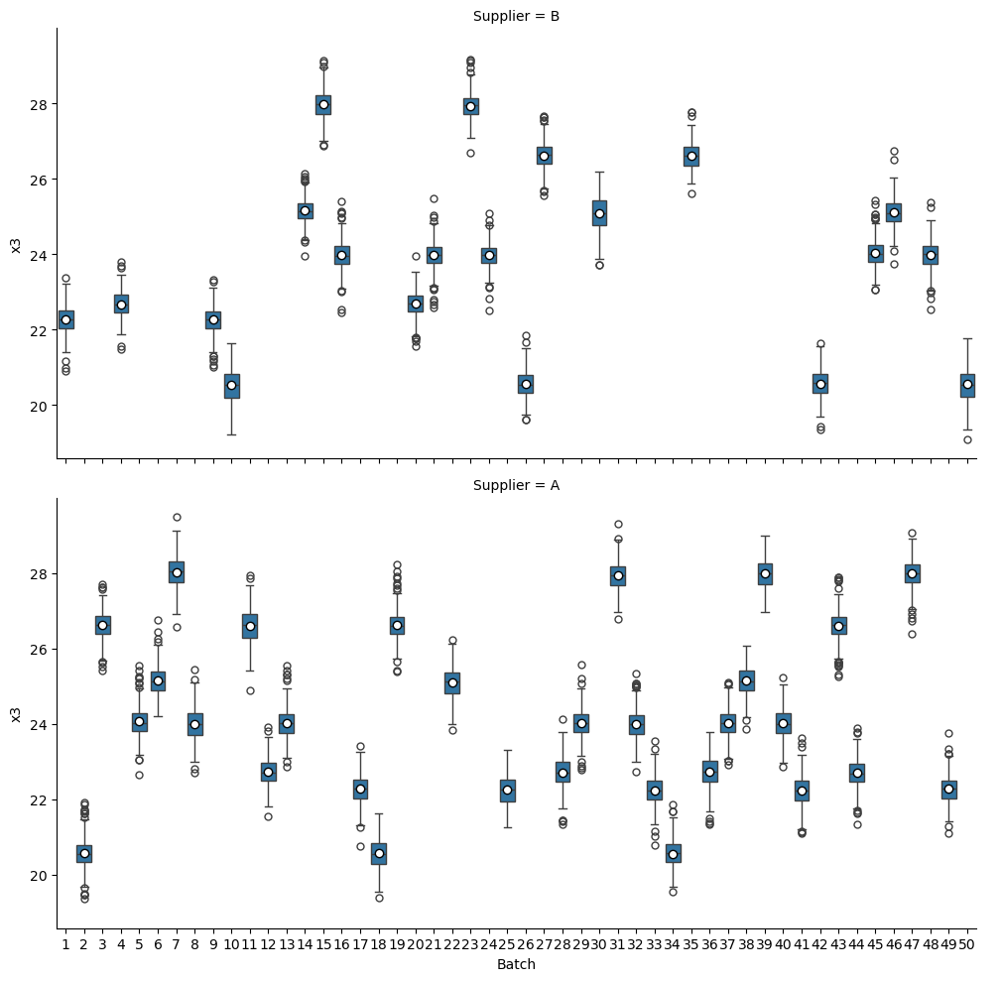

In [126]:
sns.catplot(data = dfa_copy, x='Batch', y='x3', row='Supplier', kind='box', aspect=2,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

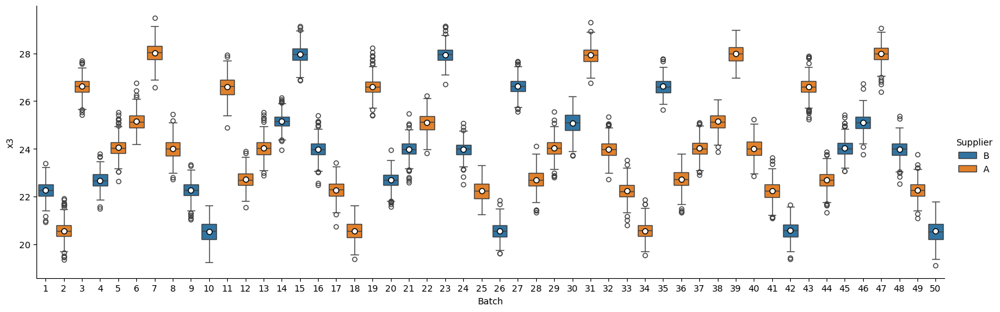

In [127]:
sns.catplot(data = dfa_copy, x='Batch', y='x3', hue='Supplier', kind='box', aspect=3,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

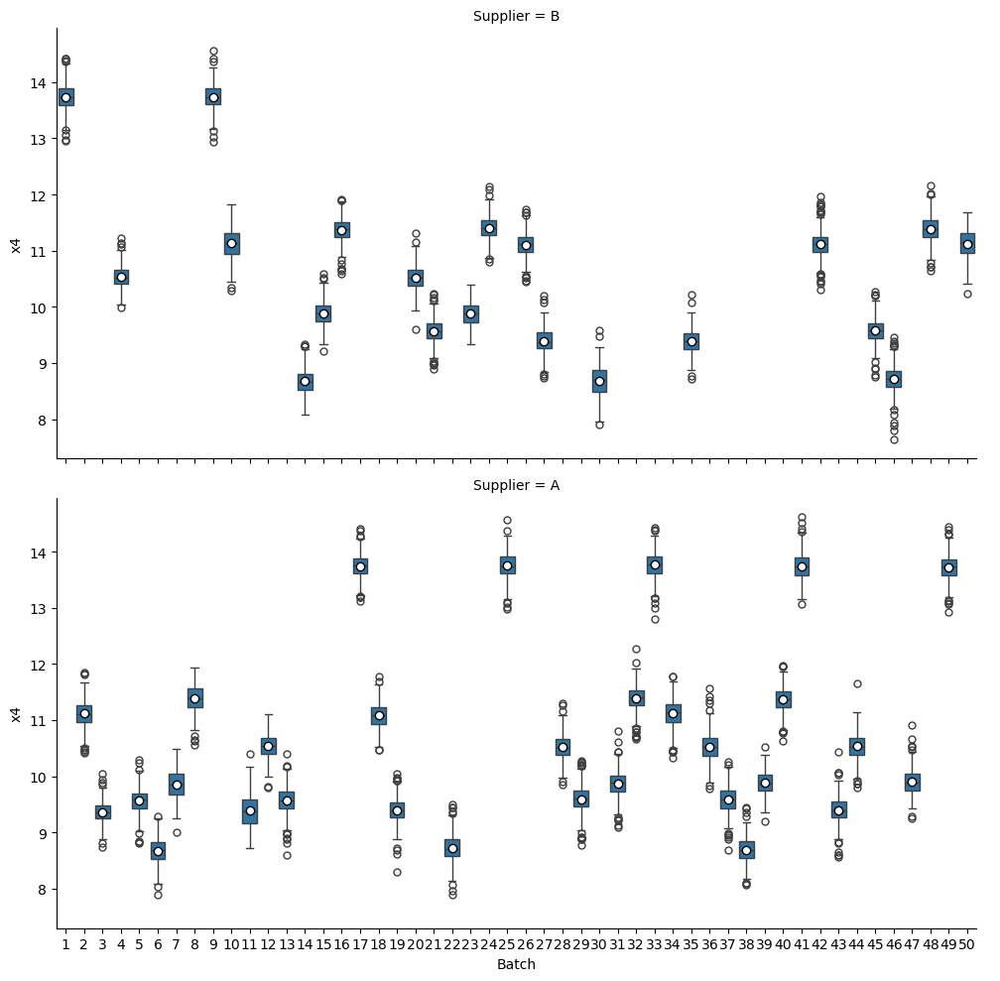

In [128]:
sns.catplot(data = dfa_copy, x='Batch', y='x4', row='Supplier', kind='box', aspect=2,
            showmeans=True,
            meanprops={'marker': 'o', 'markerfacecolor': 'white', 'markeredgecolor': 'black'})

plt.show()

* Yes, the summary statistics of the 4 operating variables varies across the Batch for each machine given the Supplier.

### Exploration of `operating variables` across `Supplier`.

In [129]:
dfa_copy_copy = dfa_copy[['x1', 'x2', 'x3', 'x4', 'Supplier']].copy()
dfa_copy_copy

,x1,x2,x3,x4,Supplier
0,50.117118,102.167346,22.067812,13.889524,B
1,46.887333,112.266102,23.197330,13.064709,B
2,50.132744,103.674908,22.319933,13.647482,B
3,48.501042,107.143156,22.162947,14.077758,B
4,49.690442,102.120283,22.248696,13.728666,B
...,...,...,...,...,...
14724,52.690936,95.050804,20.324674,10.963370,B
14725,52.348015,97.863144,20.884779,11.156604,B
14726,52.187241,99.887013,20.439142,11.303222,B
14727,52.875621,101.572057,20.648029,11.084512,B


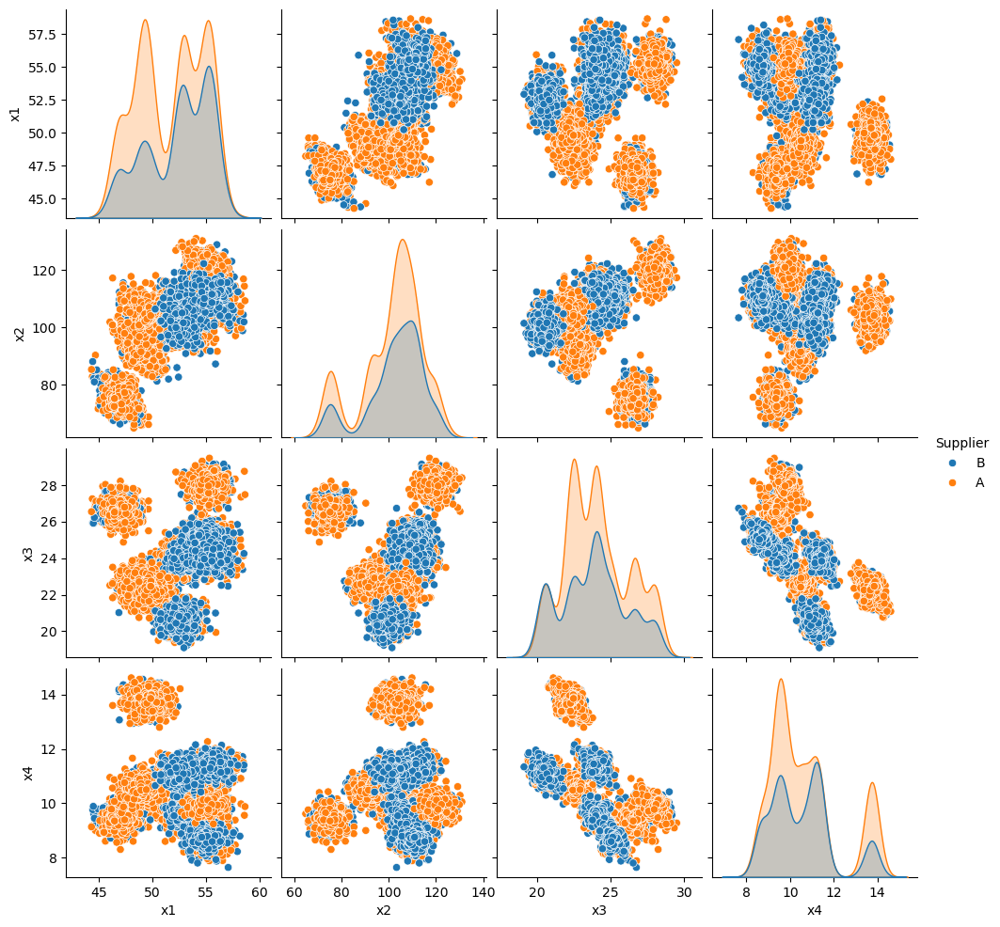

In [130]:
sns.pairplot(data=dfa_copy_copy, hue='Supplier')

plt.show()

* Yes, the relationships between the 4 OPERATING VARIABLES x1 through x4 varies across Supplier.

## Problem 03

The DROP TEST result data set file name is provided for you below. You must read in the CSV file and assign the dta set to the `test_df` object. 

You must perform the following **ESSENTIAL** activities:

* How many rows and columns are in the data? 
* What are the names and data types for each column?
* How many unique values are there for each column?
* How many missing values are there for each column?

You must visually explore the MARGINAL behavior of the variables in the data. You must use visualizations appropriate for the DATA TYPE of the columns.

You must visually explore RELATIONSHIPS between variables in the data. You must use visualizations appropriate for the DATA TYPES. You must make sure that your visualizations can answer the following questions:
* Count the number of times each unique value of `Result` occurs for each `test_group_id` value.

After exploring the `test_df` DataFrame, you **MUST** JOIN/MERGE the `test_df` DataFrame with the `dfa` DataFrame. Assign the merged DataFrame to the `dfb` DataFrame. You **MUST** answer the following:
* How many rows remain using the DEFAULT joining procedure?

You may add as many markdown and code cells as you see fit to answer this question. 

#### SOLUTION

In [131]:
# define the test data set file name
test_file = 'midterm_test.csv'

In [132]:
# read in the test data set

test_df = pd.read_csv(test_file)
test_df

,ID,test_group_id,Result
0,B001-M01-S056,A-0,1
1,B001-M01-S002,A-0,1
2,B001-M01-S049,A-0,1
3,B001-M01-S030,A-0,0
4,B001-M01-S048,A-0,1
...,...,...,...
1407,B049-M03-S026,K-5,1
1408,B049-M03-S008,K-5,1
1409,B049-M03-S041,K-5,1
1410,B049-M03-S061,K-5,1


### `test_df` Essentials

In [133]:
test_df.shape

(1412, 3)

* `test_df` has `1412 rows` and `3 columns`.

In [134]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ID             1412 non-null   object
 1   test_group_id  1412 non-null   object
 2   Result         1412 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 33.2+ KB


* Variables `ID` and `test_group_id` are of `object` data type.
* Variable `Result` is of `integer` data type.

In [135]:
test_df.nunique()

ID               1412
test_group_id     141
Result              2
dtype: int64

* `ID` has `1412 unique values`
* `test_group_id` has `141` unique values.
* `Result` has `2` unique values.

In [136]:
test_df.isna().sum()

ID               0
test_group_id    0
Result           0
dtype: int64

* None of the variables have null values.

### `test_df` Marginal Behavior

In [137]:
test_df.describe()

,Result
count,1412.000000
mean,0.301700
std,0.459158
min,0.000000
25%,0.000000
50%,0.000000
75%,1.000000
max,1.000000


In [138]:
test_df.describe(include=object)

,ID,test_group_id
count,1412,1412
unique,1412,141
top,B001-M01-S056,L-4
freq,1,14


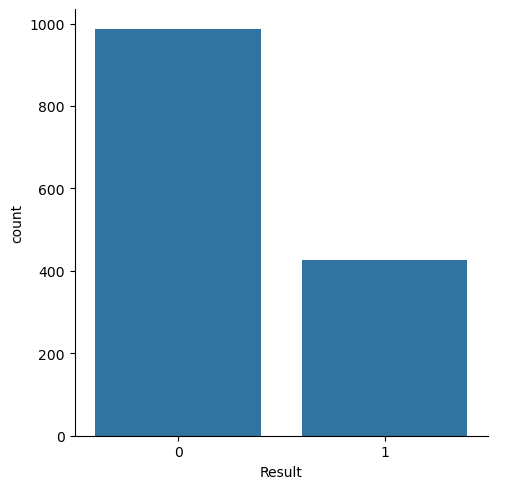

In [139]:
sns.catplot( data = test_df, x='Result', kind='count' )

plt.show()

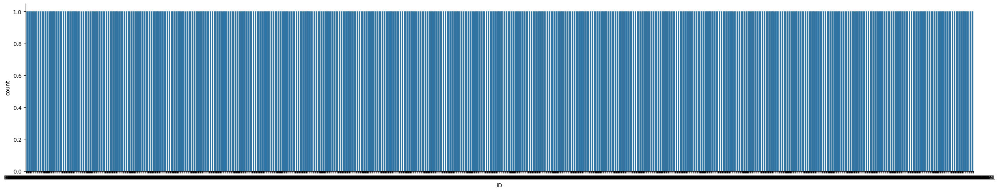

In [140]:
sns.catplot( data = test_df, x='ID', kind='count', aspect=5 )

plt.show()

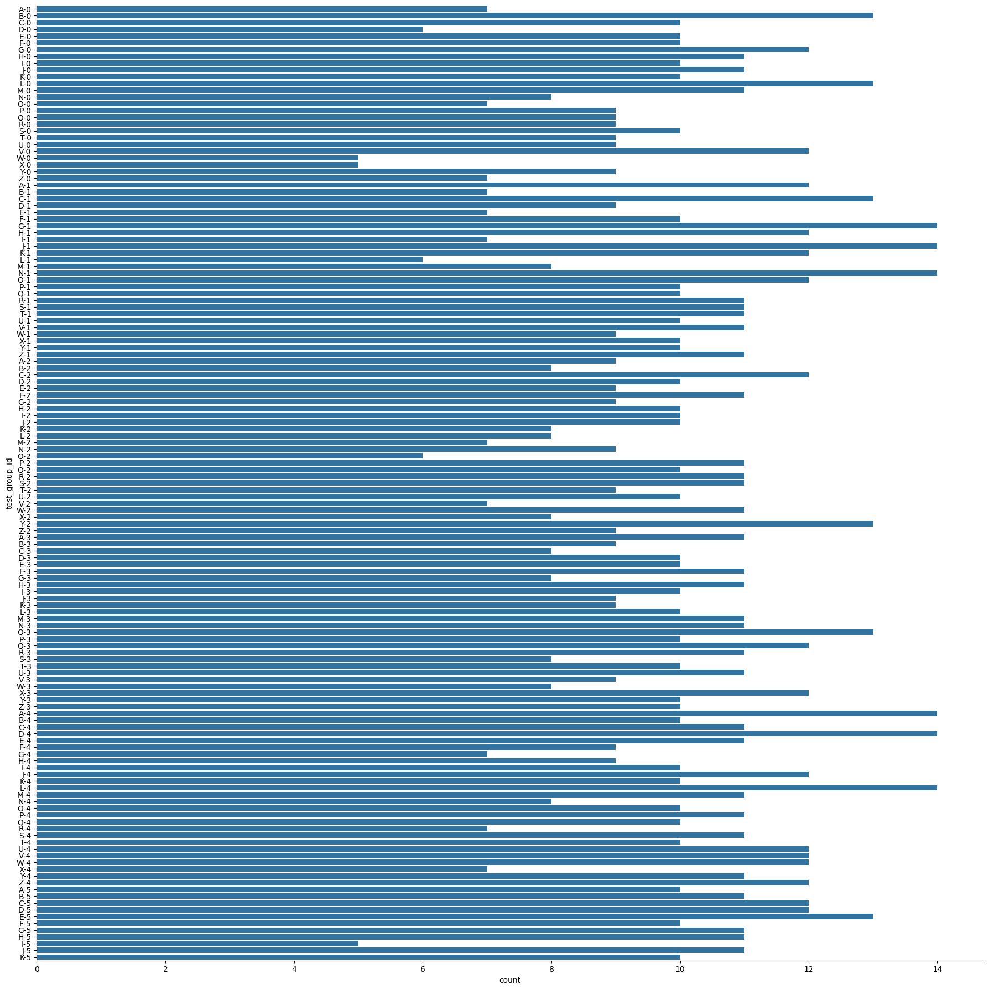

In [141]:
sns.catplot( data = test_df, y='test_group_id', kind='count', height=18 )

plt.show()

### `test_df` Relationships

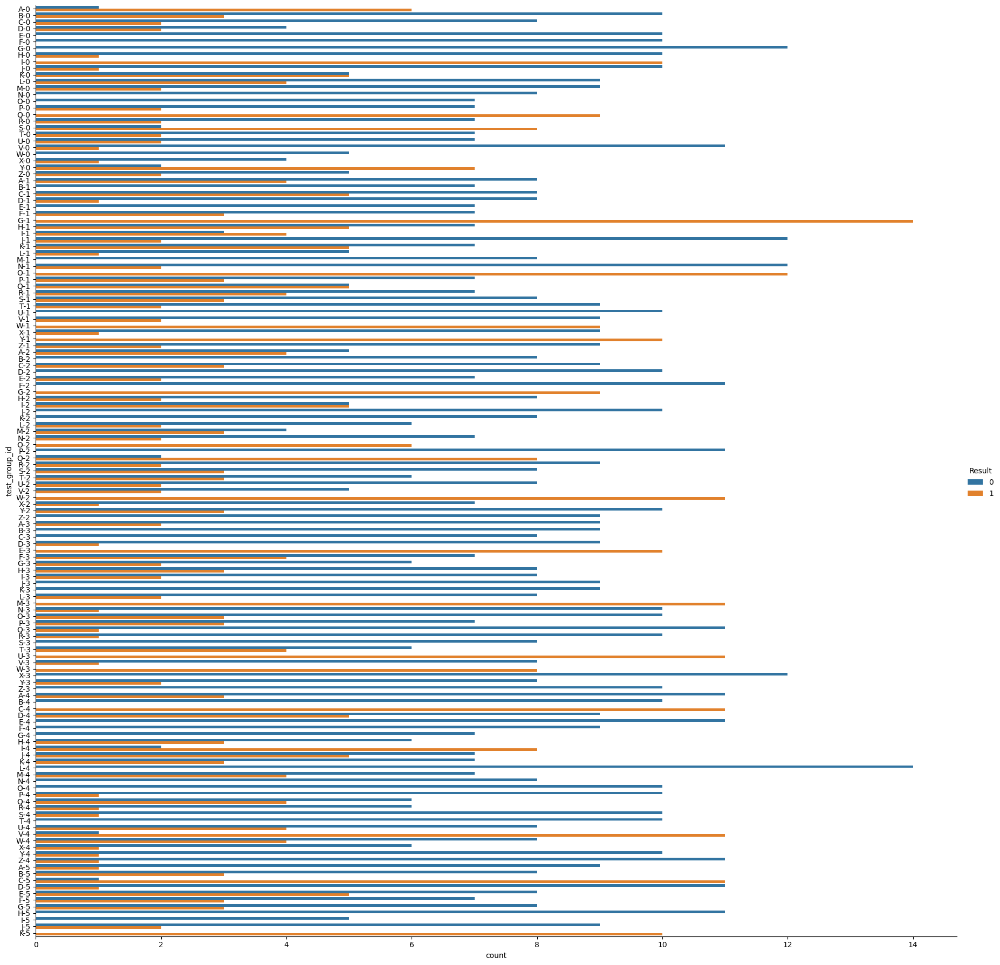

In [142]:
sns.catplot(data = test_df, y='test_group_id', hue='Result', height=18, kind='count')

plt.show()

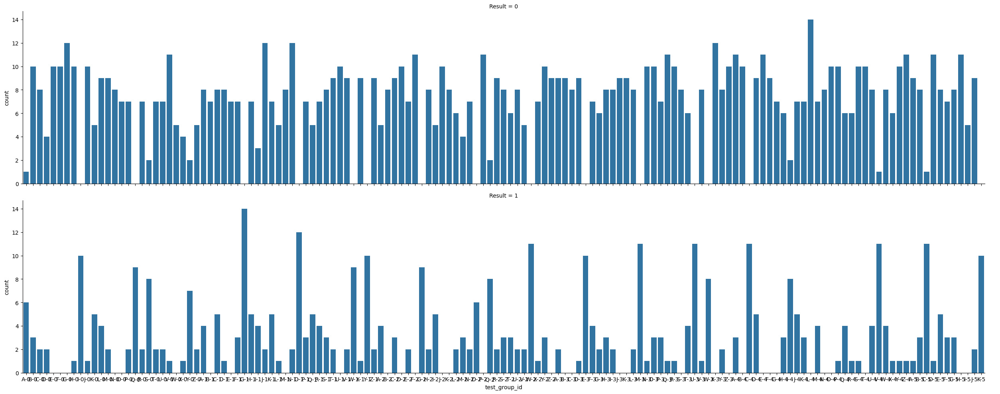

In [143]:
sns.catplot(data = test_df, x='test_group_id', row='Result', kind='count', aspect=5)

plt.show()

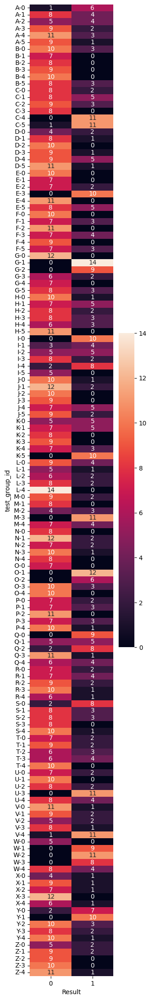

In [144]:
fig, ax = plt.subplots(figsize=(3,28))

sns.heatmap( pd.crosstab( test_df.test_group_id, test_df.Result ), ax = ax,
             annot=True, annot_kws={'size': 10}, fmt='d')

plt.show()

* The heat map above shows the count of the number of unique values of `Result` for each `test_group_id`.

In [145]:
# merge test_df with the dfa object

dfb = pd.merge( test_df, dfa, on='ID' )
dfb

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1407,B049-M03-S026,K-5,1,49,A,9.111256,26,49.464765,102.967447,22.411845,13.919089,3
1408,B049-M03-S008,K-5,1,49,A,9.111256,8,49.408191,103.516814,21.966617,13.730119,3
1409,B049-M03-S041,K-5,1,49,A,9.111256,41,49.605196,103.460366,21.932429,13.790280,3
1410,B049-M03-S061,K-5,1,49,A,9.111256,61,49.716703,104.346466,22.059022,13.543388,3


In [146]:
dfb.shape

(1412, 12)

* All the rows remain after the default join. Nothing is lost.

## Problem 04

You must now examine the merged `dfb` object and answer the following:

* Count the number of times each unique value of `Result` occurs for each value of `machine_id`.
* Count the number of times each unique value of `Result` occurs for each value of `Supplier`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id`.
* Visualize the number of times each unique value of `Result` occurs per `Batch` for each value of `machine_id` and `Supplier`.
* Calculate the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id`.
* Visualize the PROPORTION of times the cell phone case failed the test in each `Batch` per `machine_id` and for each unique value of `Supplier`.

*HINT*: Remember that a FAILED test is encoded as `Result == 1`. How can you calculate the PROPORTION of times `Result == 1`?

Add as many cells as you see fit to answer this question.

#### SOLUTION

In [147]:
dfb.head()

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [148]:
dfb.shape

(1412, 12)

In [149]:
dfb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             1412 non-null   object 
 1   test_group_id  1412 non-null   object 
 2   Result         1412 non-null   int64  
 3   Batch          1412 non-null   object 
 4   Supplier       1412 non-null   object 
 5   Density        1412 non-null   float64
 6   s_id           1412 non-null   int64  
 7   x1             1412 non-null   float64
 8   x2             1412 non-null   float64
 9   x3             1412 non-null   float64
 10  x4             1412 non-null   float64
 11  machine_id     1412 non-null   int64  
dtypes: float64(5), int64(3), object(4)
memory usage: 132.5+ KB


In [150]:
dfb.nunique()

ID               1412
test_group_id     141
Result              2
Batch              50
Supplier            2
Density            50
s_id              134
x1               1412
x2               1412
x3               1412
x4               1412
machine_id          3
dtype: int64

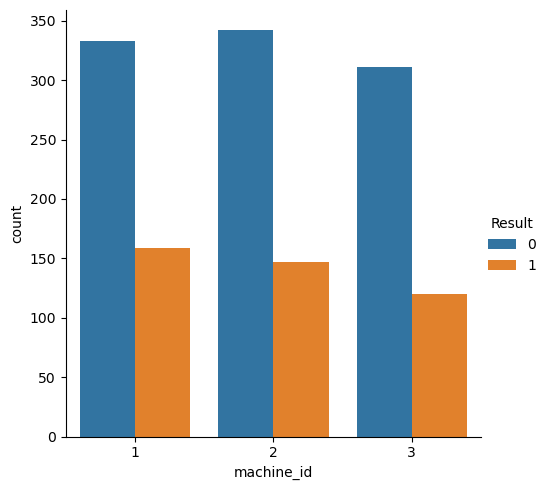

In [151]:
sns.catplot(data=dfb, x='machine_id', hue='Result', kind='count')

plt.show()

* Machine 1: There are around 330 `0 Results` and around 160 `1 Results`.
* Machine 2: There are around 340 `0 Results` and around 140 `1 Results`.
* Machine 3: There are around 310 `0 Results` and around 120 `1 Results`.

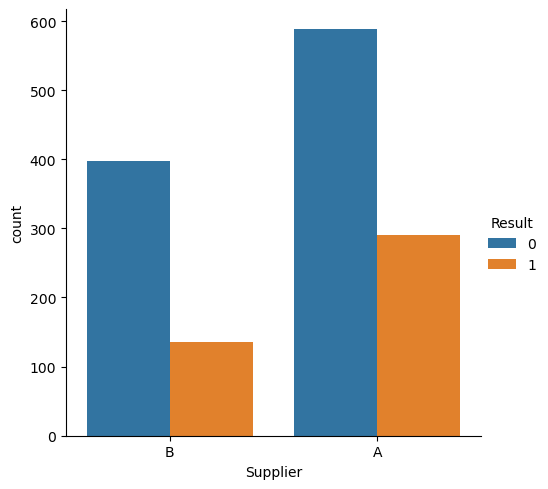

In [152]:
sns.catplot(data=dfb, x='Supplier', hue='Result', kind='count')

plt.show()

* Supplier A: There are around 400 `0 Results` and around 140 `1 Results`.
* Supplier B: There are around 600 `0 Results` and around 300 `1 Results`.

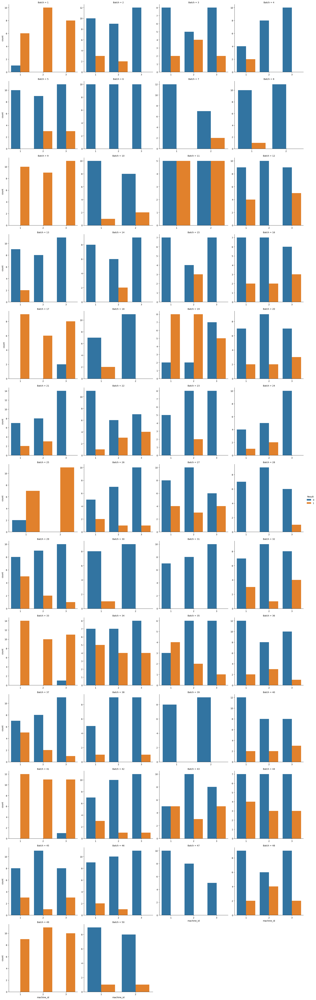

In [153]:
sns.catplot(data=dfb, x='machine_id', hue='Result', col='Batch', kind='count', col_wrap=4, sharex=False, sharey=False)

plt.show()

* The plot above shows the number of times each unique value of Result occurs per Batch for each value of machine_id

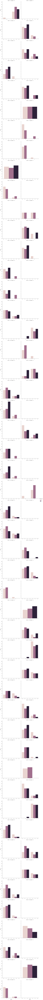

In [154]:
sns.catplot(data=dfb, x='Result', hue='machine_id', col='Supplier', row='Batch', kind='count', sharex=False)

plt.show()

* The plot above shows the number of times each unique value of Result occurs per Batch for each value of machine_id and Supplier

In [155]:
dfb.head()

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [156]:
dfb_prop = dfb[['Batch', 'machine_id', 'Result', 'Supplier']].copy()
dfb_prop

,Batch,machine_id,Result,Supplier
0,1,1,1,B
1,1,1,1,B
2,1,1,1,B
3,1,1,0,B
4,1,1,1,B
...,...,...,...,...
1407,49,3,1,A
1408,49,3,1,A
1409,49,3,1,A
1410,49,3,1,A


In [157]:
failures = dfb_prop[dfb_prop['Result'] == 1].groupby(['Batch', 'machine_id'])['Result'].count()
failures

Batch  machine_id
1      1              6
       2             10
       3              8
2      1              3
       2              2
                     ..
49     1              9
       2             11
       3             10
50     1              1
       2              1
Name: Result, Length: 107, dtype: int64

In [158]:
total = dfb_prop.groupby(['Batch', 'machine_id'])['Result'].count()
total

Batch  machine_id
1      1              7
       2             10
       3              8
2      1             13
       2             11
                     ..
49     1              9
       2             11
       3             10
50     1             10
       2              9
Name: Result, Length: 141, dtype: int64

In [159]:
proportion_failures = failures / total

proportion_failures = proportion_failures.reset_index()
proportion_failures

,Batch,machine_id,Result
0,1,1,0.857143
1,1,2,1.000000
2,1,3,1.000000
3,2,1,0.230769
4,2,2,0.181818
...,...,...,...
136,49,1,1.000000
137,49,2,1.000000
138,49,3,1.000000
139,50,1,0.100000


* The proportion of failed test cases is shown above for each Batch per machine_id.

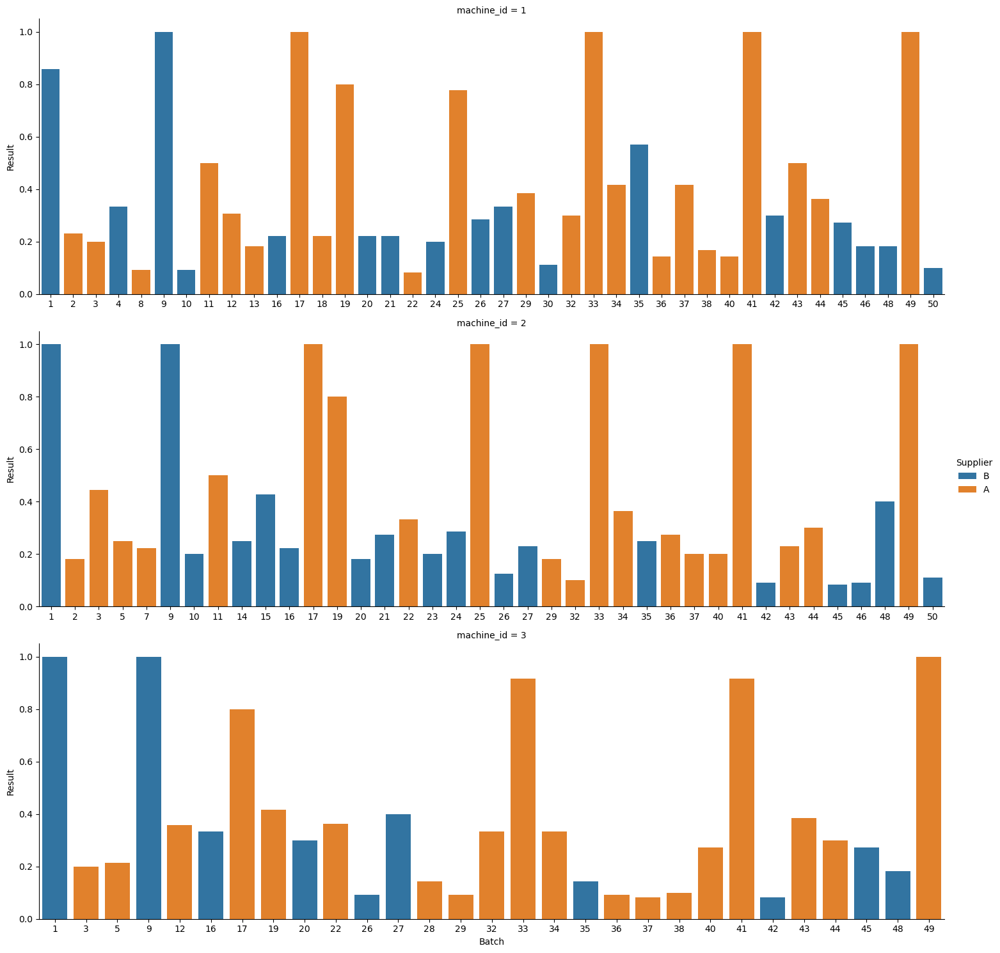

In [160]:
failures1 = dfb[dfb['Result'] == 1].groupby(['Batch', 'machine_id', 'Supplier'])['Result'].count()
total1 = dfb.groupby(['Batch', 'machine_id', 'Supplier'])['Result'].count()
proportion_failures1 = failures1 / total1

proportion_failures1 = proportion_failures1.reset_index()

sns.catplot(x='Batch', y='Result', hue='Supplier', col='machine_id',\
            data=proportion_failures1, kind='bar', aspect=3, col_wrap=1, sharex=False)

plt.show()

* The above plot shows the visualization of the proportion of times the cell phone case failed the test in each Batch per machine_id and for each unique value of Supplier.

## Problem 05

You must cluster the rows of `dfb` using the 4 operational variables `x1` through `x4`. You must decide how many clusters to use and describe how you made that choice. You may use KMeans OR Hierarchical clustering. Include any figures that helped you make that choice.

Visualize your cluster analysis results by:
* Plotting the number of observations per cluster.
* Visualizing the relationships between the operational variables GIVEN the cluster.

You are interested in the PROPORTION of cell phone cases that failed the DROP TEST. Are any of the clusters associated with higher failure PROPORTIONS than others? Based on your visualizations how would you describe that cluster?

Add as many cells as you see fit to answer this question.

#### SOLUTION

In [161]:
dfb.head()

,ID,test_group_id,Result,Batch,Supplier,Density,s_id,x1,x2,x3,x4,machine_id
0,B001-M01-S056,A-0,1,1,B,10.388587,56,49.215485,105.647327,21.410531,14.154576,1
1,B001-M01-S002,A-0,1,1,B,10.388587,2,46.887333,112.266102,23.197330,13.064709,1
2,B001-M01-S049,A-0,1,1,B,10.388587,49,49.125629,112.323042,22.874947,13.743788,1
3,B001-M01-S030,A-0,0,1,B,10.388587,30,48.306819,109.445722,22.910858,13.839830,1
4,B001-M01-S048,A-0,1,1,B,10.388587,48,50.564504,109.184587,22.083064,13.954942,1


In [162]:
dfb_clean = dfb.copy()
dfb_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ID             1412 non-null   object 
 1   test_group_id  1412 non-null   object 
 2   Result         1412 non-null   int64  
 3   Batch          1412 non-null   object 
 4   Supplier       1412 non-null   object 
 5   Density        1412 non-null   float64
 6   s_id           1412 non-null   int64  
 7   x1             1412 non-null   float64
 8   x2             1412 non-null   float64
 9   x3             1412 non-null   float64
 10  x4             1412 non-null   float64
 11  machine_id     1412 non-null   int64  
dtypes: float64(5), int64(3), object(4)
memory usage: 132.5+ KB


In [163]:
dfb_features_clean = dfb_clean[['x1', 'x2', 'x3', 'x4', 'Result']].copy()
dfb_features_clean

,x1,x2,x3,x4,Result
0,49.215485,105.647327,21.410531,14.154576,1
1,46.887333,112.266102,23.197330,13.064709,1
2,49.125629,112.323042,22.874947,13.743788,1
3,48.306819,109.445722,22.910858,13.839830,0
4,50.564504,109.184587,22.083064,13.954942,1
...,...,...,...,...,...
1407,49.464765,102.967447,22.411845,13.919089,1
1408,49.408191,103.516814,21.966617,13.730119,1
1409,49.605196,103.460366,21.932429,13.790280,1
1410,49.716703,104.346466,22.059022,13.543388,1


In [164]:
dfb_features_clean['Result'] = dfb_features_clean.Result.astype('category')
dfb_features_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   x1      1412 non-null   float64 
 1   x2      1412 non-null   float64 
 2   x3      1412 non-null   float64 
 3   x4      1412 non-null   float64 
 4   Result  1412 non-null   category
dtypes: category(1), float64(4)
memory usage: 45.8 KB


In [165]:
X = StandardScaler().fit_transform( dfb_features_clean )
X.shape

(1412, 5)

In [166]:
dfb_features_clean.shape

(1412, 5)

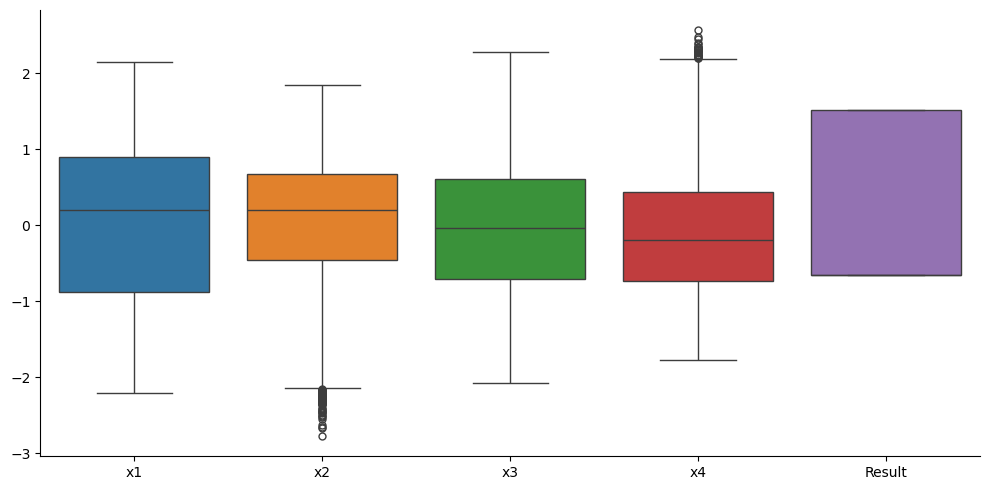

In [167]:
sns.catplot(data = pd.DataFrame(X, columns=dfb_features_clean.columns), kind='box', aspect=2)

plt.show()

In [168]:
clusters_2 = KMeans(n_clusters=2, random_state=121, n_init=25, max_iter=500).fit_predict( X )

In [169]:
dfb_features_clean_copy = dfb_features_clean.copy()

In [170]:
dfb_features_clean_copy['k2'] = pd.Series( clusters_2, index=dfb_features_clean_copy.index ).astype('category')
dfb_features_clean_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   x1      1412 non-null   float64 
 1   x2      1412 non-null   float64 
 2   x3      1412 non-null   float64 
 3   x4      1412 non-null   float64 
 4   Result  1412 non-null   category
 5   k2      1412 non-null   category
dtypes: category(2), float64(4)
memory usage: 47.2 KB


In [171]:
dfb_features_clean_copy.k2.value_counts()

k2
1    752
0    660
Name: count, dtype: int64

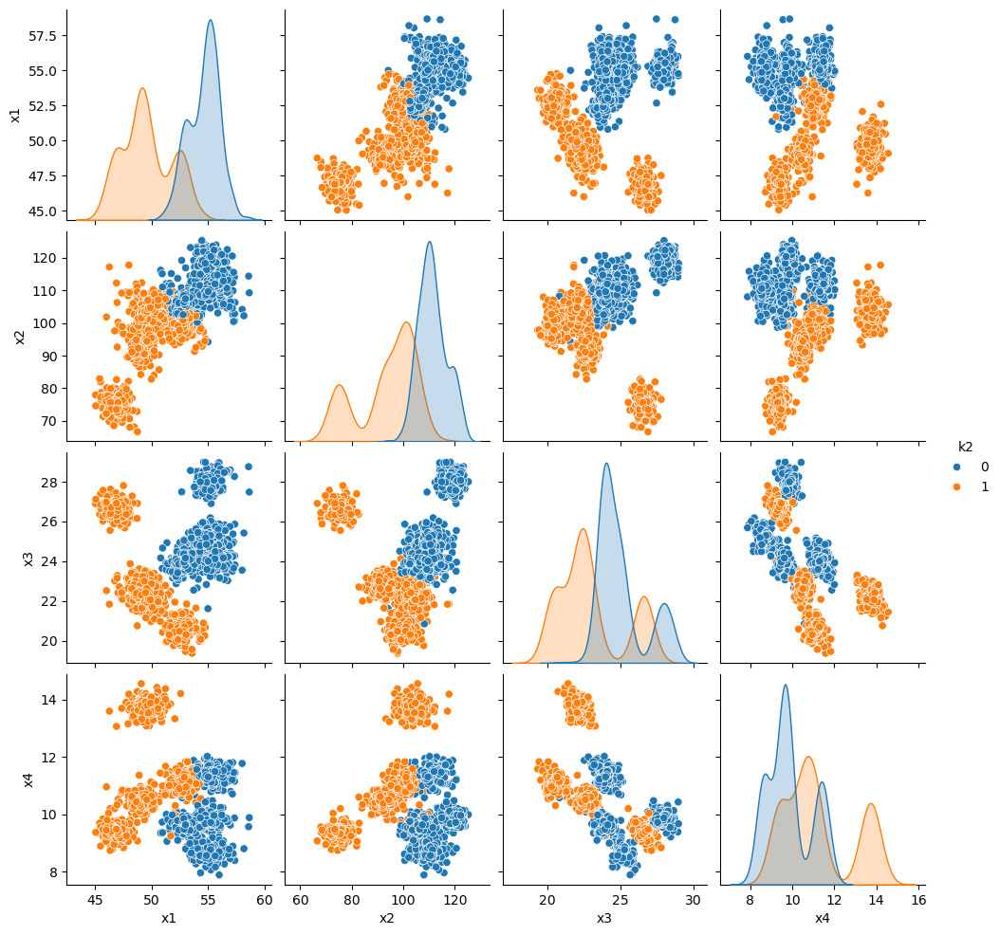

In [172]:
sns.pairplot(data = dfb_features_clean_copy, hue='k2', diag_kws={'common_norm': False})

plt.show()

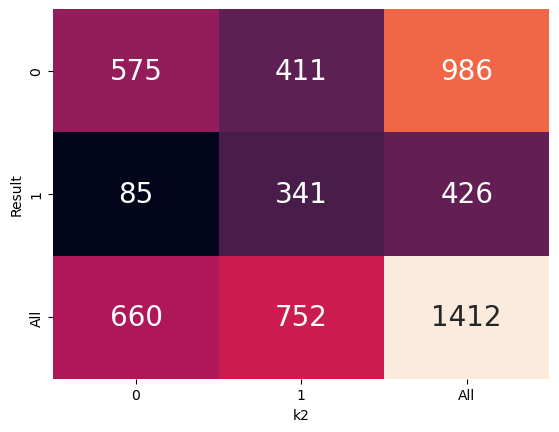

In [173]:
fig, ax = plt.subplots()

sns.heatmap(data = pd.crosstab( dfb_features_clean_copy.Result, dfb_features_clean_copy.k2, margins=True ), 
            annot=True, annot_kws={"fontsize": 20}, fmt='g',
            cbar=False,
            ax=ax)

plt.show()

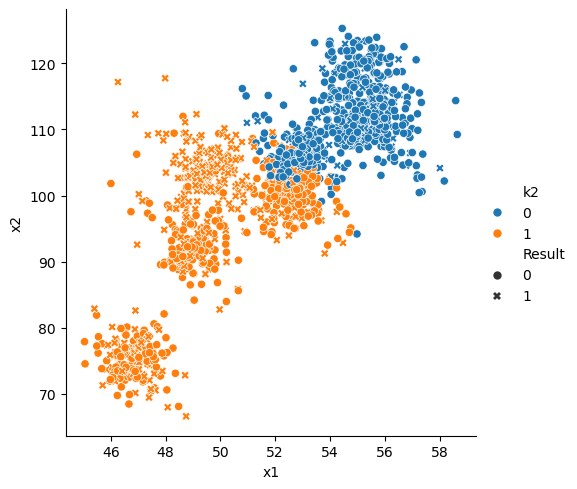

In [174]:
sns.relplot(data = dfb_features_clean_copy, x='x1', y='x2', hue='k2', style='Result')

plt.show()

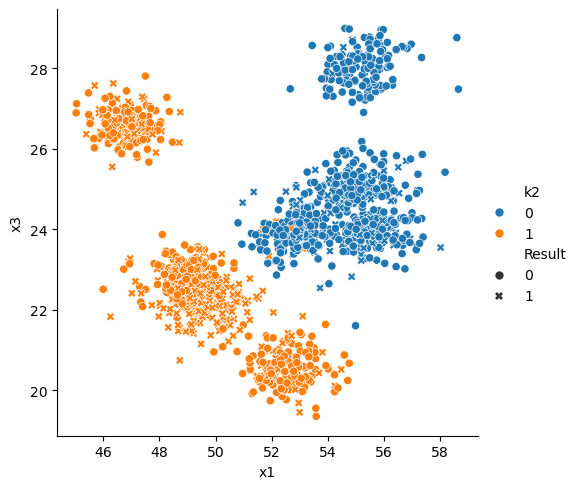

In [175]:
sns.relplot(data = dfb_features_clean_copy, x='x1', y='x3', hue='k2', style='Result')

plt.show()

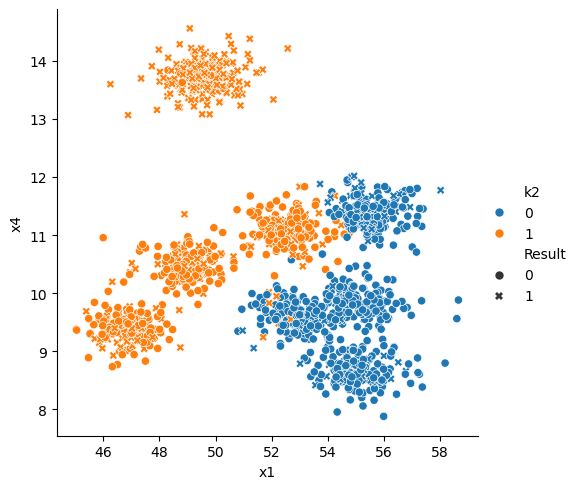

In [176]:
sns.relplot(data = dfb_features_clean_copy, x='x1', y='x4', hue='k2', style='Result')

plt.show()

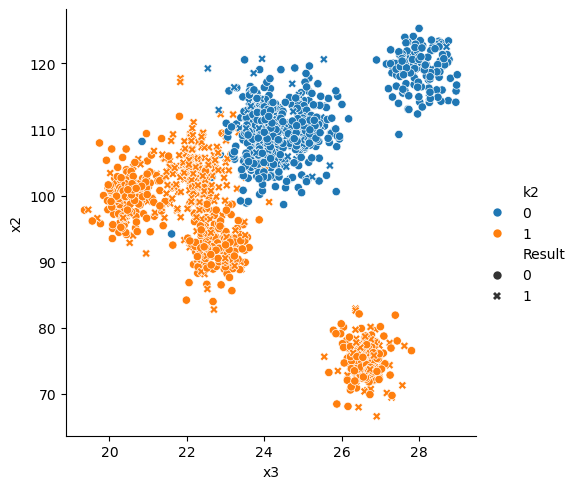

In [177]:
sns.relplot(data = dfb_features_clean_copy, x='x3', y='x2', hue='k2', style='Result')

plt.show()

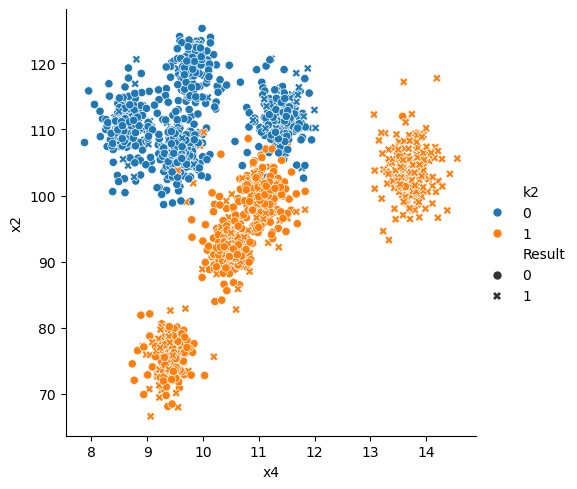

In [178]:
sns.relplot(data = dfb_features_clean_copy, x='x4', y='x2', hue='k2', style='Result')

plt.show()

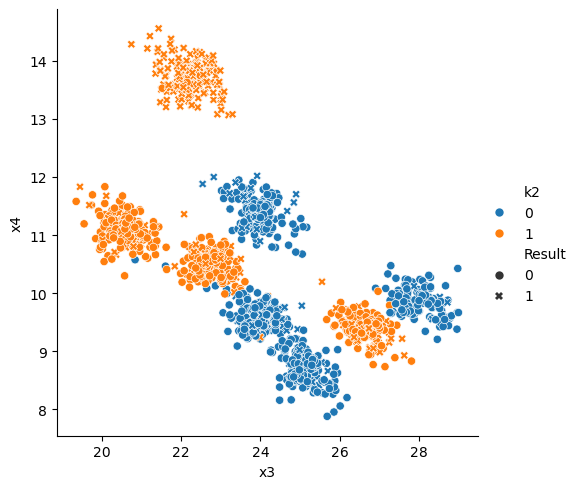

In [179]:
sns.relplot(data = dfb_features_clean_copy, x='x3', y='x4', hue='k2', style='Result')

plt.show()

### Optimal Number of Clusters

In [180]:
tots_within = []

K = range(1, 31)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit( X )
    
    tots_within.append( km.inertia_ )

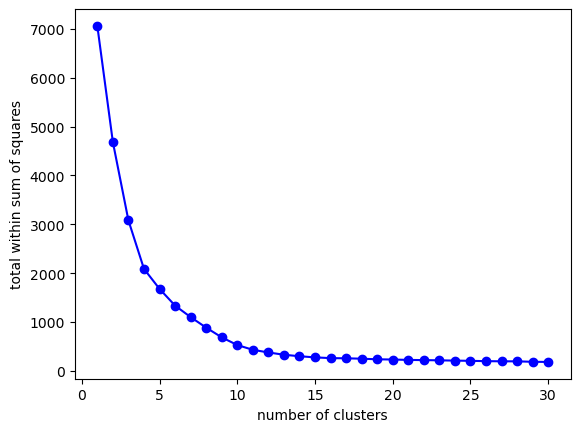

In [181]:
fig, ax = plt.subplots()

ax.plot( K, tots_within, 'bo-' )
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

* Using 4 clusters according to the knee bend plot above

In [182]:
clusters_4 = KMeans(n_clusters=4, random_state=121, n_init=25, max_iter=500).fit_predict( X )

In [183]:
dfb_features_clean_copy['k4'] = pd.Series( clusters_4, index=dfb_features_clean_copy.index ).astype('category')

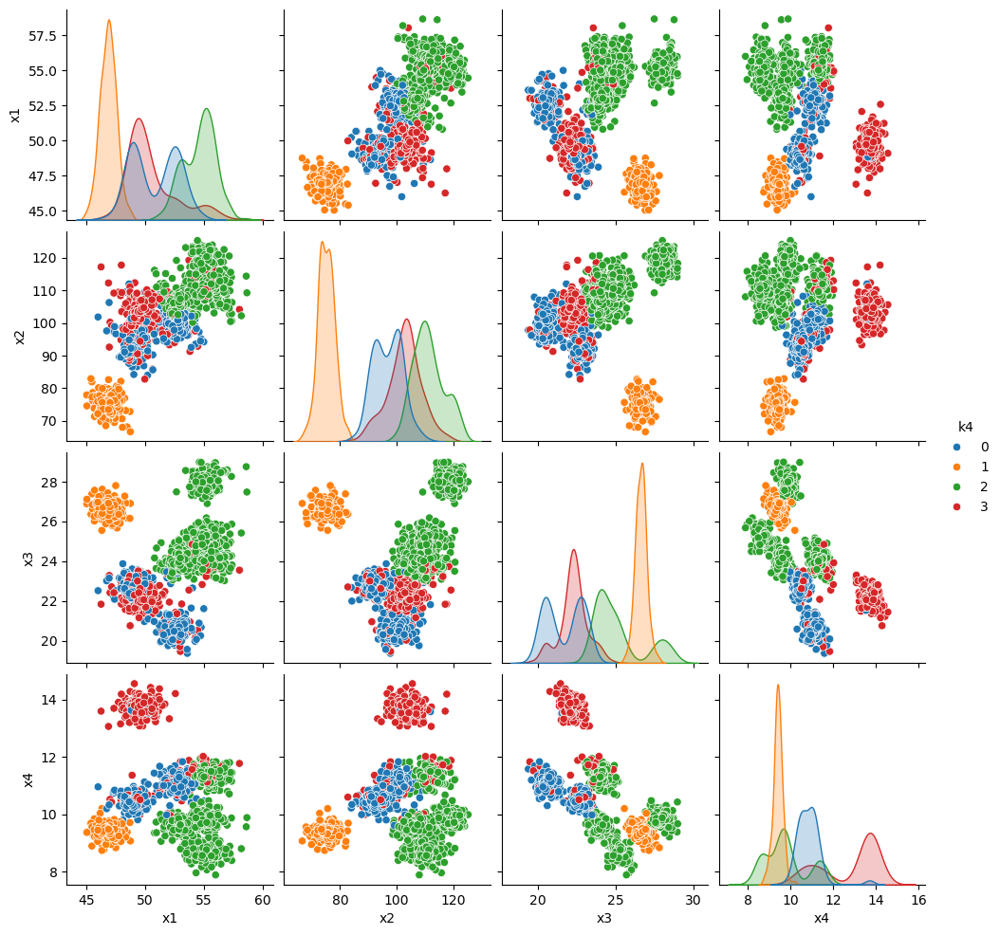

In [184]:
sns.pairplot(data = dfb_features_clean_copy, hue='k4', diag_kws={'common_norm': False})

plt.show()

* Using 5 clusters according to the knee bend plot above

In [185]:
clusters_5 = KMeans(n_clusters=5, random_state=121, n_init=25, max_iter=500).fit_predict( X )

In [186]:
dfb_features_clean_copy['k5'] = pd.Series( clusters_5, index=dfb_features_clean_copy.index ).astype('category')

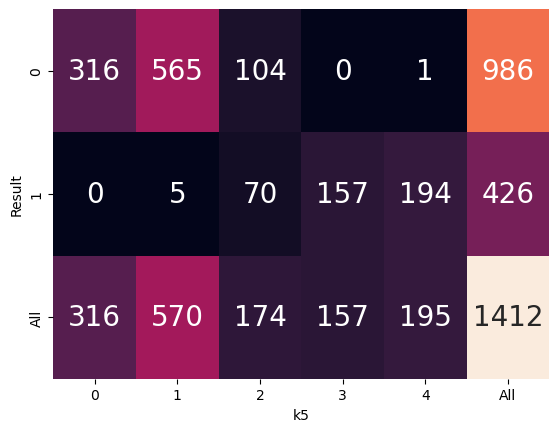

In [189]:
fig, ax = plt.subplots()

sns.heatmap(data = pd.crosstab( dfb_features_clean_copy.Result, dfb_features_clean_copy.k5, margins=True ), 
            annot=True, annot_kws={"fontsize": 20}, fmt='g',
            cbar=False,
            ax=ax)

plt.show()

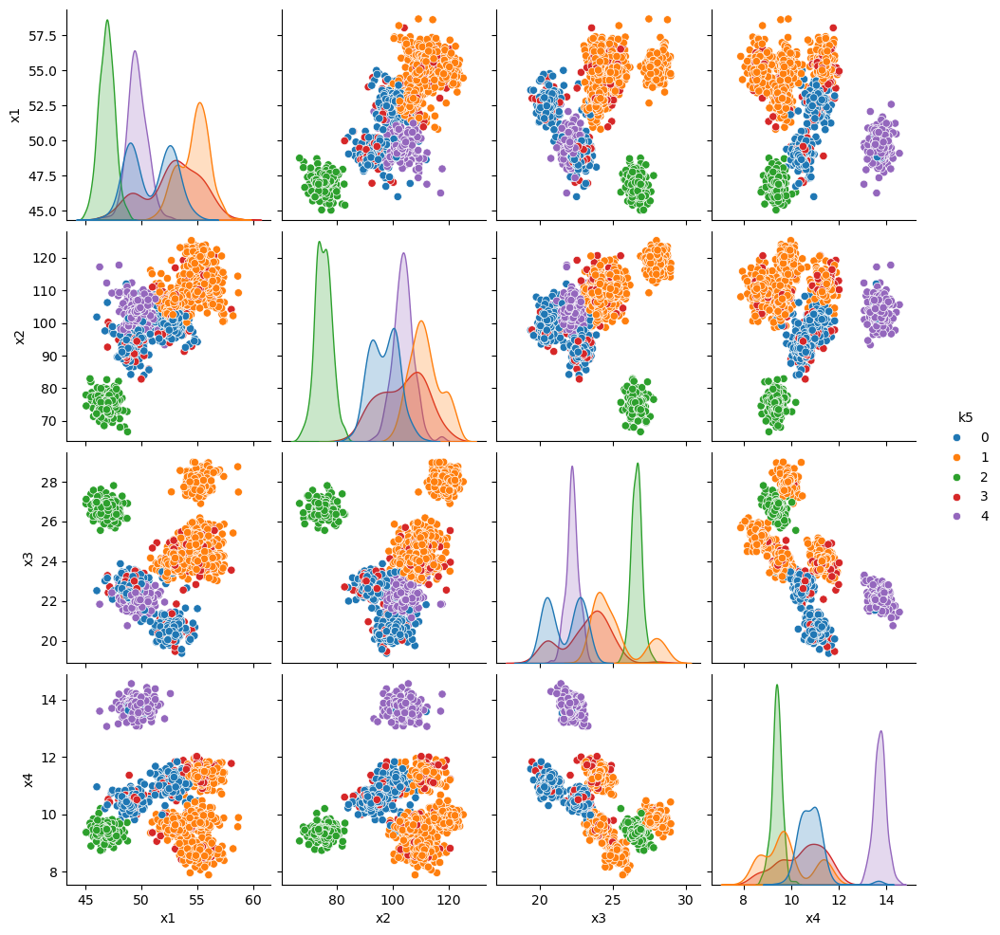

In [190]:
sns.pairplot(data = dfb_features_clean_copy, hue='k5', diag_kws={'common_norm': False})

plt.show()

* Could not make a concrete decision using KMeans and the KNEE Bend plot. Hence, I'm trying to use Hierarchical clustering.

### Trying Hierarchical Clustering

In [191]:
from scipy.cluster import hierarchy

In [192]:
hclust_complete = hierarchy.complete(X)

In [193]:
type(hclust_complete)

numpy.ndarray

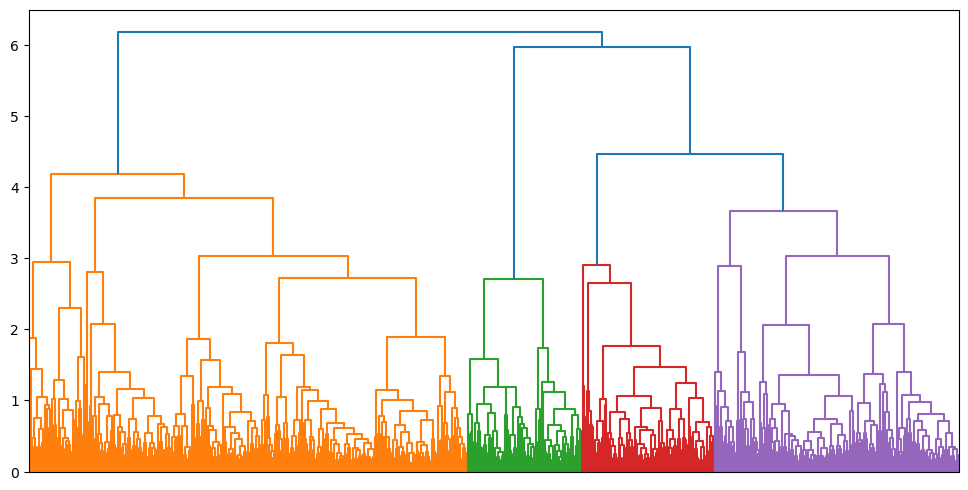

In [194]:
fig = plt.figure(figsize=(12,6))

dn = hierarchy.dendrogram( hclust_complete, no_labels=True )

plt.show()

* From the graph above, we can see that 4 clusters is optimal.

In [195]:
hierarchy.cut_tree( hclust_complete, n_clusters=4 ).ravel()

array([0, 0, 0, ..., 0, 0, 0])

In [196]:
np.unique( hierarchy.cut_tree( hclust_complete, n_clusters=4).ravel() )

array([0, 1, 2, 3])

In [197]:
pca_dfb = PCA(n_components=4).fit_transform( X )
pca_dfb.shape

(1412, 4)

In [198]:
pca_dfb_df = pd.DataFrame( pca_dfb, columns=['pc01', 'pc02', 'pc03', 'pc04'] )
pca_dfb_df

,pc01,pc02,pc03,pc04
0,-2.463565,1.786034,0.438785,0.543170
1,-2.054846,1.056957,1.012786,0.774621
2,-1.907154,1.650158,0.967256,0.776832
3,-1.170109,1.032959,-0.669684,1.902278
4,-1.946382,1.927281,0.712119,0.517157
...,...,...,...,...
1407,-2.279358,1.420362,0.691389,0.606428
1408,-2.289154,1.462599,0.565129,0.440833
1409,-2.279220,1.513296,0.558445,0.439195
1410,-2.139895,1.460727,0.607652,0.361835


In [199]:
pca_dfb_df['hclust_4'] = pd.Series( hierarchy.cut_tree( hclust_complete, n_clusters=4 ).ravel(),
                                     index=pca_dfb_df.index ).astype('category')
pca_dfb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1412 entries, 0 to 1411
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   pc01      1412 non-null   float64 
 1   pc02      1412 non-null   float64 
 2   pc03      1412 non-null   float64 
 3   pc04      1412 non-null   float64 
 4   hclust_4  1412 non-null   category
dtypes: category(1), float64(4)
memory usage: 45.8 KB


In [200]:
pca_dfb_df.hclust_4.value_counts()

hclust_4
3    666
1    371
0    201
2    174
Name: count, dtype: int64

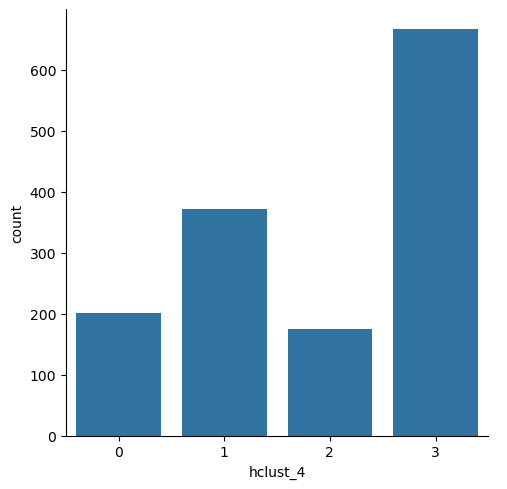

In [201]:
sns.catplot(data = pca_dfb_df, x='hclust_4', kind='count')

plt.show()

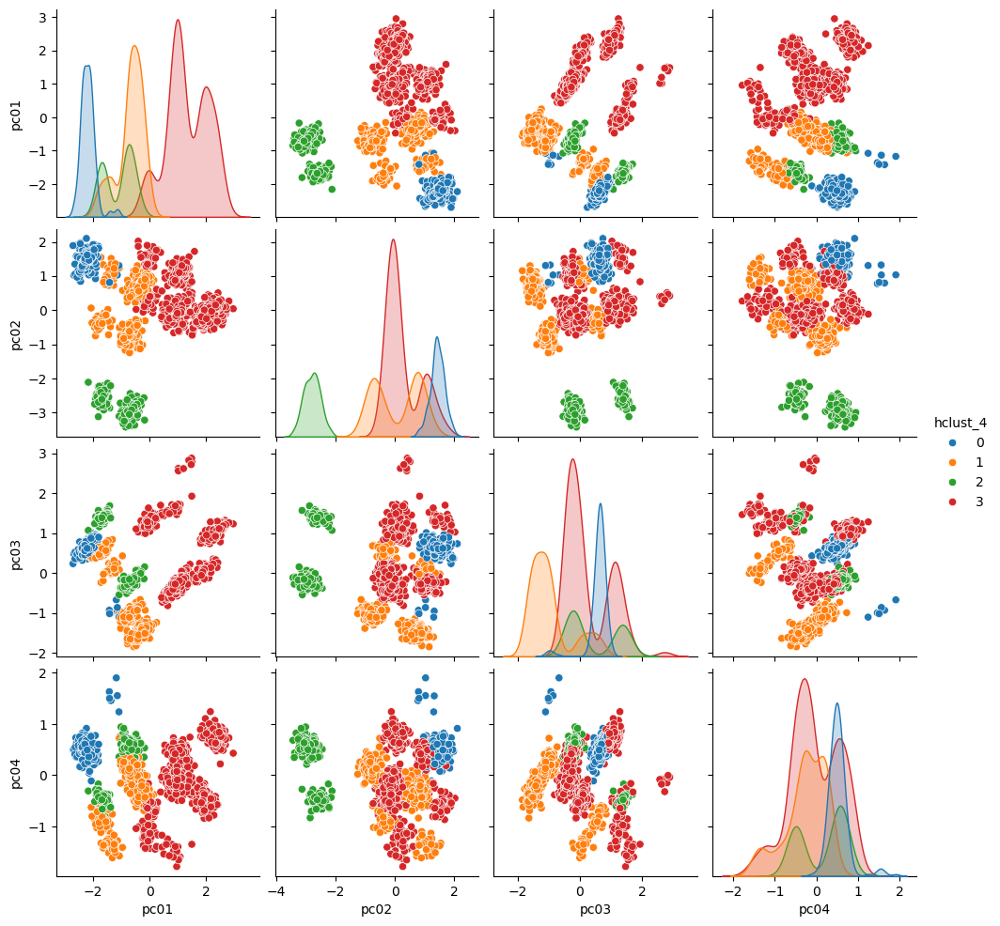

In [202]:
sns.pairplot(data=pca_dfb_df, hue='hclust_4')

plt.show()

In [ ]:
dfb_features_clean_copy.head()

In [ ]:
dfb_failed_tests = dfb_features_clean_copy[dfb_features_clean_copy['Result'] == 1].copy()
dfb_failed_tests

In [ ]:
dfb_failed_tests_k4 = dfb_failed_tests.groupby(['k4']).size().reset_index(name='Cluster Count').copy()
dfb_failed_tests_k4

In [ ]:
failed2 = dfb_failed_tests_k4['Cluster Count']
failed2

In [ ]:
sum_of_cluster = dfb_failed_tests_k4['Cluster Count'].sum()
sum_of_cluster

In [ ]:
dfb_failed_tests_k4['Proportion'] = failed2 / sum_of_cluster
dfb_failed_tests_k4

In [ ]:
sns.barplot(x="k4", y="Proportion", data=dfb_failed_tests_k4)

plt.show()

* Cluser 3 has the highest failed cases, followed by Cluster 1, and then Cluster 2 in close proximity. Cluster 0 has no failed cases.